In [1]:
import glob
from keras import backend as K

from keras.models import load_model
from tqdm import tqdm
from keras.utils import to_categorical
from keras.layers import Lambda

import os
import cv2
import imageio
import numpy as np
import json

import matplotlib.pyplot as plt

from keras.callbacks import CSVLogger
from IPython.display import clear_output

from tempfile import mkdtemp
import os.path as path
import tensorflow as tf
plt.rcParams['figure.figsize'] = (10, 10)
#os.environ["CUDA_VISIBLE_DEVICES"]="0"
#tf.enable_eager_execution()

Using TensorFlow backend.


In [2]:
def sorted_data_path(in_path, frame_path_list,mask_path_list, clasific_path, clasific):
    new_data = []
    new_frame = []
    new_mask = []

    for idx in tqdm(range(len(frame_path_list))):
        for j in range(len(clasific_path)):
            if (frame_path_list[idx] == os.path.join(str(in_path), clasific_path[j])):
                    new_data.append(clasific[j])
                    new_frame.append(frame_path_list[idx])
                    new_mask.append(mask_path_list[idx])

                        
                    
    return np.array(new_frame),np.array(new_mask), np.array(new_data)



In [3]:
def cache_augmented_data(train_frame_path_list,train_mask_path_list, val):
    
    if val==1:
        filename = path.join('', 'file_train_bags.npy')
        filename_m = path.join('', 'file_train_m_bags.npy')
    if val==2:
        filename = path.join('', 'file_val_bags.npy')
        filename_m = path.join('', 'file_val_m_bags.npy')
    open(filename, 'w').close()
    fp = np.memmap(filename, dtype=np.uint8, mode='w+', shape=(len(train_frame_path_list),1280, 720, 3))
    open(filename_m, 'w').close()
    fp_m = np.memmap(filename_m, dtype=np.uint8, mode='w+', shape=(len(train_mask_path_list),1280, 720,2))
    
    
    s = []
    z = []
    m = []


    for i in tqdm(range(len(train_frame_path_list))):
        
        work_shape = (1280, 720)
        
        frame_data = imageio.imread(train_frame_path_list[i])
        mask_data = imageio.imread(train_mask_path_list[i])
        
        
        frame_target_shape = int(frame_data.shape[1]*16/9 + 0.5), frame_data.shape[1], 3
        mask_target_shape = int(mask_data.shape[1]*16/9 + 0.5), mask_data.shape[1]
        frame_target = np.full(frame_target_shape, 0, dtype=np.uint8)
        mask_target = np.full(mask_target_shape, 0, dtype=np.uint8)
        frame_target[:frame_data.shape[0]] = frame_data
        mask_target[:mask_data.shape[0]] = mask_data
        
        scale_factor = (np.array(work_shape)/np.array(frame_target_shape[:2])).mean()
        frame_data_new = frame_target
        frame_data_new = cv2.resize(frame_data_new, tuple(reversed(work_shape)))
        mask_data_new = mask_target
        mask_data_new = cv2.resize(mask_data_new, tuple(reversed(work_shape)))
        
        
        im = mask_data
        ret, thresh = cv2.threshold(im , 128, 255, 0)
        cnts,_ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
        
        cnt = sorted(cnts, key=cv2.contourArea, reverse=True)
        
        xmin = frame_data.shape[0]
        ymin = frame_data.shape[1]
        xmax = 0 
        ymax = 0
        
        for ii in range(len(cnt)):
            x1, y1, w1, h1 = cv2.boundingRect(cnt[ii])
              
            xmin = min(xmin, x1)
            ymin = min(ymin, y1)
            xmax = max(xmax, x1 + w1)
            ymax = max(ymax, y1 + h1)
            
        if len(cnt)>0:
            c_x = (xmin+xmax)/2
            c_y = (ymin+ymax)/2
            factor = 1.15
            d_w = max((xmax -xmin), (ymax - ymin))*factor/2
            x_min = int(max(c_x - d_w + 0.5, 0))
            x_max = int(min(c_x + d_w + 0.5, frame_data.shape[1]))
            y_min = int(max(c_y - d_w + 0.5, 0))
            y_max = int(min(c_y + d_w + 0.5, frame_data.shape[0]))
        else:
            x_min = 0
            x_max = frame_data.shape[1]
            y_min = 0
            y_max = frame_data.shape[0] 
        """    
        if len(cnts)>0:
            
            cnt = max(cnts, key=cv2.contourArea)
            x1, y1, w1, h1 = cv2.boundingRect(cnt)

            xmin = min(xmin, x1)
            ymin = min(ymin, y1)
            xmax = max(xmax, x1 + w1)
            ymax = max(ymax, y1 + h1)
            
            c_x = (xmin+xmax)/2
            c_y = (ymin+ymax)/2

            factor = 1.15
            d_w = max((xmax -xmin), (ymax - ymin))*factor/2
            x_min = int(max(c_x - d_w + 0.5, 0))
            x_max = int(min(c_x + d_w + 0.5, frame_data.shape[1]))

            y_min = int(max(c_y - d_w + 0.5, 0))
            y_max = int(min(c_y + d_w + 0.5, frame_data.shape[0]))

        else:
            x_min = 0
            x_max = frame_data.shape[1]

            y_min = 0
            y_max = frame_data.shape[0]
        """
    
        m.append(mask_data_new)
      
        s.append(frame_data_new)

        z.append(np.array([(x_min, y_max), (x_min, y_min),
                  (x_max, y_min), (x_max, y_max)])*scale_factor)
        

    

        if i == len(train_frame_path_list)//2:
            
            s=np.array(s)
            
            fp[:i+1,::] = s
            s=[]
            
            m=np.array(m)[...,None]
            m = np.concatenate([255. - m, m], -1)
            fp_m[:i+1,::] = m
            m=[]
        

    s=np.array(s)
    
    fp[len(train_frame_path_list)//2+1:,::] = s
    
    m=np.array(m)[...,None]
    m = np.concatenate([255. - m, m], -1)
    
    fp_m[len(train_mask_path_list)//2+1:,::] = m
  
    z=np.array(z)

    return fp,fp_m,  z

In [4]:
def find_item(frame_item):
    frame_item_name = os.path.basename(frame_item).replace('.png','')
    mask_folder_path = os.path.dirname(frame_item).replace('/frames', '/masks')
    folder_list = os.listdir(mask_folder_path)
    mask_item = [item for item in folder_list if frame_item_name in item]
    
    return os.path.join(mask_folder_path, '',mask_item[0])

In [5]:
in_path_train = '/home/user/work/Projects/active_learning_clients/clients/datasets_downloader/datasets7/bags_train/' 
train_frame_path_list = sorted(glob.glob(os.path.join(str(in_path_train), "*/frames/*.png")))
train_mask_path_list = [find_item(item) for item in train_frame_path_list]

in_path_val = '/home/user/work/Projects/active_learning_clients/clients/datasets_downloader/datasets7/bags_validation/' 
validation_frame_path_list = sorted(glob.glob(os.path.join(str(in_path_val), "*/frames/*.png")))
validation_mask_path_list = [find_item(item) for item in validation_frame_path_list]




In [6]:
len(train_mask_path_list)

875

In [7]:
train_frame_cache,train_mask_cache, train_point_cache = cache_augmented_data(train_frame_path_list,train_mask_path_list, 1)
validation_frame_cache,validation_mask_cache, validation_point_cache = cache_augmented_data(validation_frame_path_list,validation_mask_path_list, 2)

100%|██████████| 3/3 [00:00<00:00, 29.86it/s]


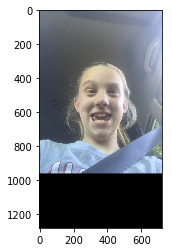

In [8]:
idx = 0
frame_data = train_frame_cache[idx].copy()
src_points = train_point_cache[idx]
plt.imshow(frame_data)
plt.show()

In [9]:
idx = 0
s_pts = np.float32([train_point_cache[idx][0], train_point_cache[idx][1], train_point_cache[idx][2]])
d_pts = np.float32([[0, 128], [0, 0], [128, 0]])
M2 = cv2.getAffineTransform(s_pts, d_pts)
out_frame = cv2.warpAffine(frame_data, M2, dsize=(128,128))
# M2 = cv2.invertAffineTransform(M2) 

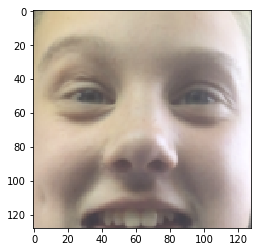

In [10]:
plt.imshow(out_frame)
plt.show()

In [11]:
train_frame=train_frame_cache
train_mask=train_mask_cache
z_train = train_point_cache
validation_frame=validation_frame_cache
validation_mask=validation_mask_cache
z_val = validation_point_cache

In [12]:
x_train = []
for i in range(len(train_frame)):
    frame = cv2.cvtColor(train_frame[i], cv2.COLOR_RGB2YUV)
    frame = np.transpose(frame, (1,0,2))
    x_train.append(frame)
x_train = np.array(x_train)
y_train = []
for i in range(len(train_mask)):
    mask = np.transpose(train_mask[i], (1,0,2))
    y_train.append(mask)
y_train = np.array(y_train)



In [13]:
x_val = []
for i in range(len(validation_frame)):
    frame = cv2.cvtColor(validation_frame[i], cv2.COLOR_RGB2YUV)
    frame = np.transpose(frame, (1,0,2))
    x_val.append(frame)
x_val = np.array(x_val)
y_val = []
for i in range(len(validation_mask)):
    mask = np.transpose(validation_mask[i], (1,0,2))
    y_val.append(mask)
y_val = np.array(y_val)

In [14]:
from keras.layers import Input, Activation,MaxPool2D,Flatten,Conv2D,MaxPooling2D,UpSampling2D
from keras.layers import Dense, AveragePooling2D, BatchNormalization, Concatenate,Dropout,PReLU
from keras import regularizers

from keras.engine.topology import Layer
from keras.models import Model

In [15]:
import keras.backend as K
from keras.legacy import interfaces
from keras.optimizers import Optimizer
import tensorflow as tf


class AdamAccumulate(Optimizer):

    def __init__(self, lr=0.001, beta_1=0.9, beta_2=0.999,
                 epsilon=None, decay=0., amsgrad=False, accum_iters=1, **kwargs):
        if accum_iters < 1:
            raise ValueError('accum_iters must be >= 1')
        super(AdamAccumulate, self).__init__(**kwargs)
        with K.name_scope(self.__class__.__name__):
            self.iterations = K.variable(0, dtype='int64', name='iterations')
            self.lr = K.variable(lr, name='lr')
            self.beta_1 = K.variable(beta_1, name='beta_1')
            self.beta_2 = K.variable(beta_2, name='beta_2')
            self.decay = K.variable(decay, name='decay')
        if epsilon is None:
            epsilon = K.epsilon()
        self.epsilon = epsilon
        self.initial_decay = decay
        self.amsgrad = amsgrad
        self.accum_iters = K.variable(accum_iters, K.dtype(self.iterations))
        self.accum_iters_float = K.cast(self.accum_iters, K.floatx())

    @interfaces.legacy_get_updates_support
    def get_updates(self, loss, params):
        grads = self.get_gradients(loss, params)
        self.updates = [K.update_add(self.iterations, 1)]

        lr = self.lr

        completed_updates = K.cast(tf.floordiv(self.iterations, self.accum_iters), K.floatx())

        if self.initial_decay > 0:
            lr = lr * (1. / (1. + self.decay * completed_updates))

        t = completed_updates + 1

        lr_t = lr * (K.sqrt(1. - K.pow(self.beta_2, t)) / (1. - K.pow(self.beta_1, t)))

        # self.iterations incremented after processing a batch
        # batch:              1 2 3 4 5 6 7 8 9
        # self.iterations:    0 1 2 3 4 5 6 7 8
        # update_switch = 1:        x       x    (if accum_iters=4)  
        update_switch = K.equal((self.iterations + 1) % self.accum_iters, 0)
        update_switch = K.cast(update_switch, K.floatx())

        ms = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        vs = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        gs = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]

        if self.amsgrad:
            vhats = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        else:
            vhats = [K.zeros(1) for _ in params]

        self.weights = [self.iterations] + ms + vs + vhats

        for p, g, m, v, vhat, tg in zip(params, grads, ms, vs, vhats, gs):

            sum_grad = tg + g
            avg_grad = sum_grad / self.accum_iters_float

            m_t = (self.beta_1 * m) + (1. - self.beta_1) * avg_grad
            v_t = (self.beta_2 * v) + (1. - self.beta_2) * K.square(avg_grad)

            if self.amsgrad:
                vhat_t = K.maximum(vhat, v_t)
                p_t = p - lr_t * m_t / (K.sqrt(vhat_t) + self.epsilon)
                self.updates.append(K.update(vhat, (1 - update_switch) * vhat + update_switch * vhat_t))
            else:
                p_t = p - lr_t * m_t / (K.sqrt(v_t) + self.epsilon)

            self.updates.append(K.update(m, (1 - update_switch) * m + update_switch * m_t))
            self.updates.append(K.update(v, (1 - update_switch) * v + update_switch * v_t))
            self.updates.append(K.update(tg, (1 - update_switch) * sum_grad))
            new_p = p_t

            # Apply constraints.
            if getattr(p, 'constraint', None) is not None:
                new_p = p.constraint(new_p)

            self.updates.append(K.update(p, (1 - update_switch) * p + update_switch * new_p))
        return self.updates

    def get_config(self):
        config = {'lr': float(K.get_value(self.lr)),
                  'beta_1': float(K.get_value(self.beta_1)),
                  'beta_2': float(K.get_value(self.beta_2)),
                  'decay': float(K.get_value(self.decay)),
                  'epsilon': self.epsilon,
                  'amsgrad': self.amsgrad}
        base_config = super(AdamAccumulate, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [199]:
import tensorflow as tf

class STN(Layer):

    def __init__(self, output_size, **kwargs):
        self.output_size = output_size
        super(STN, self).__init__(**kwargs)

    def compute_output_shape(self, input_shapes):
        height, width = self.output_size
        num_channels = input_shapes[0][-1]
        return [(None, height, width, num_channels), (None, 2, 3), (None, 2), (None, 1)]

    def call(self, tensors, mask=None):
        X, transformation = tensors
        X = K.cast(X, 'float32')
        output = self._transform(X, transformation, self.output_size)
        return output

    
    def _interpolate(self, image, sampled_grids, output_size):

        batch_size = K.shape(image)[0]
        height = K.shape(image)[1]
        width = K.shape(image)[2]
        num_channels = K.shape(image)[3]

        
        x = K.cast(K.flatten(sampled_grids[:, 0, :]), dtype='float32')
        y = K.cast(K.flatten(sampled_grids[:, 1, :]), dtype='float32')

        x0 = K.cast(x, 'int32')
        x1 = x0 + 1
        y0 = K.cast(y, 'int32')
        y1 = y0 + 1

        max_x = int(K.int_shape(image)[2] - 1)
        max_y = int(K.int_shape(image)[1] - 1)

        x0 = K.clip(x0, 0, max_x)
        x1 = K.clip(x1, 0, max_x)
        y0 = K.clip(y0, 0, max_y)
        y1 = K.clip(y1, 0, max_y)

        pixels_batch = K.arange(0, batch_size) * (height * width)
        pixels_batch = K.expand_dims(pixels_batch, axis=-1)
        flat_output_size = output_size[0] * output_size[1]
        base = K.repeat_elements(pixels_batch, flat_output_size, axis=1)
        base = K.flatten(base)

        # base_y0 = base + (y0 * width)
        base_y0 = y0 * width
        base_y0 = base + base_y0
        # base_y1 = base + (y1 * width)
        base_y1 = y1 * width
        base_y1 = base_y1 + base

        indices_a = base_y0 + x0
        indices_b = base_y1 + x0
        indices_c = base_y0 + x1
        indices_d = base_y1 + x1
        
        

        flat_image = K.reshape(image, shape=(-1, num_channels))
        flat_image = K.cast(flat_image, dtype='float32')

        pixel_values_a = K.gather(flat_image, indices_a)
        pixel_values_b = K.gather(flat_image, indices_b)
        pixel_values_c = K.gather(flat_image, indices_c)
        pixel_values_d = K.gather(flat_image, indices_d)

        x0 = K.cast(x0, 'float32')
        x1 = K.cast(x1, 'float32')
        y0 = K.cast(y0, 'float32')
        y1 = K.cast(y1, 'float32')

        area_a = K.expand_dims(((x1 - x) * (y1 - y)), 1)
        area_b = K.expand_dims(((x1 - x) * (y - y0)), 1)
        area_c = K.expand_dims(((x - x0) * (y1 - y)), 1)
        area_d = K.expand_dims(((x - x0) * (y - y0)), 1)

        values_a = area_a * pixel_values_a
        values_b = area_b * pixel_values_b
        values_c = area_c * pixel_values_c
        values_d = area_d * pixel_values_d
        return values_a + values_b + values_c + values_d

    def _create_stn_image(self, x_item, theta, batch_size, x_size, y_size, num_channels):

        
        # create grid
        y = tf.linspace(0., float(x_size), x_size)
        x = tf.linspace(0., float(y_size), y_size)
        x_t, y_t = tf.meshgrid(x, y)
       
        # flatten
        x_t_flat = K.flatten(x_t)
        y_t_flat = K.flatten(y_t)

        # reshape to [x_t, y_t , 1] - (homogeneous form)
        ones = K.ones_like(x_t_flat)
        sampling_grid = K.concatenate([x_t_flat, y_t_flat, ones],0)
        

        sampling_grid = K.flatten(sampling_grid)
        sampling_grid = K.tile(sampling_grid, K.stack([batch_size]))
        sampling_grid = K.reshape(sampling_grid, (batch_size, 3, x_size * y_size))

        batch_grids = K.batch_dot(theta, sampling_grid)

        mean_grid = K.mean(batch_grids, -1)   
        
        #mean_grid_std = K.sqrt(K.epsilon() + K.mean((batch_grids - K.expand_dims(mean_grid,-1))**2, -1))
        # batch_grid > [?, 65536, 3]
        
        
        
        vector_x = (tf.subtract(batch_grids[:,0,:],mean_grid[:,0:1])/tf.cast([[1280]],'float'))**2
        vector_y = (tf.subtract(batch_grids[:,1,:],mean_grid[:,1:])/tf.cast([[720]],'float'))**2
        
        mean_grid_std=K.sum(K.sqrt(K.epsilon()+vector_x+vector_y),axis=[1])/tf.cast([x_size * y_size],'float')
        mean_grid_std = K.expand_dims(mean_grid_std,-1)
            
        y_item = self._interpolate(x_item, batch_grids, (y_size,x_size))
        
        new_shape = (batch_size,x_size,y_size,num_channels)
        y_item = K.reshape(y_item, new_shape)
        
        return y_item, theta, mean_grid, mean_grid_std

    def _transform(self, X, affine_transformation, output_size):
        
        batch_size, x,y,num_channels = K.shape(X)[0],K.shape(X)[1],K.shape(X)[2],K.shape(X)[3]

        fix = (tf.cast([[[1,1, x], [1,1, y]]], 'float32'))
        
        transformations = K.reshape(affine_transformation,
                                    shape=(batch_size, 2, 3))*fix
  
        
        new_image, m , mean_grid, mean_grid_std = self._create_stn_image(X, transformations, batch_size, *output_size, num_channels)

        new_image = tf.clip_by_value(new_image, 0., 1.)
        
        return [new_image, transformations, mean_grid, mean_grid_std]

    
class Tf_afine(Layer):

    def __init__(self, output_size, **kwargs):
        self.output_size = output_size
        super(Tf_afine, self).__init__(**kwargs)

    def call(self, tensors, mask=None):
        X, transformation = tensors

        output = self._tf_transform(X, transformation)
        
        return output
        
    def compute_output_shape(self, input_shapes):
        height, width = self.output_size
        num_channels = input_shapes[0][-1]
        return [(None, height, width, num_channels),(None, 2,3)]
        
    def _tf_transform(self, X, affine_transformation):
        X = K.cast(X,'float32')
        affine_transformation = K.cast(affine_transformation,'float32')
        batch_size, x, y= K.shape(X)[0], K.shape(X)[1], K.shape(X)[2]

        fix = (tf.cast([[[1,1, x], [1,1, y]]], 'float32'))
        
        transformations = K.reshape(affine_transformation,
                                    shape=(batch_size, 2, 3))*fix
        
        M = K.concatenate( [K.cast(transformations, 'float32'),
                                K.tile(tf.cast([[[0,0,1]]], 'float32'), [batch_size, 1,1])], 1)
        
        MMM = tf.contrib.image.matrices_to_flat_transforms(M)

        imgOut = tf.contrib.image.transform(X, MMM, interpolation="NEAREST", output_shape =(self.output_size[0],self.output_size[1]))

        return [imgOut, transformations]




In [200]:
from keras.engine.topology import Layer
class Augment(Layer):

    def __init__(self, invert=False,
                 alpha_initializer='zeros',
                 alpha_regularizer=None, **kwargs):
        self.invert=invert
        super(Augment, self).__init__(**kwargs)

    def call(self, tensors):
        
        X, Y, a1, a2, a3, a4 = tensors
        self.probability_gamma = tf.clip_by_value(tf.cast(a1,'float'),0.,1.)
        self.noise = tf.clip_by_value(tf.cast(a2,'float'),0.,1.)
        self.gamma = tf.clip_by_value(tf.cast(a3,'float'),0., 1.)*1.5+0.5
        self.gamma_procent = tf.clip_by_value(tf.cast(a4,'float'),0.,1.)*0.15+0.001
        
        output = self.get_augmented_data(X, Y)
        

        return output
        
    def compute_output_shape(self, input_shapes):
        height, width = input_shapes[0][1],input_shapes[0][2]
        
        num_channels1 = input_shapes[0][-1]
        num_channels2 = input_shapes[1][-1]
        
        return [(None, height, width, num_channels1),(None, height, width, num_channels2),(None,4)]
      
        
    def get_augmented_data(self,frame_data0,mask_data0):
        
        batch_size,x_size,y_size = K.shape(frame_data0)[0],K.shape(frame_data0)[1],K.shape(frame_data0)[2]
        
        frame_data = frame_data0
        mask_data = mask_data0

        
        self.probability_gamma = K.in_train_phase(self.probability_gamma, tf.tile(tf.cast([[0.]],'float32'),[batch_size,1]))
        self.noise = K.in_train_phase(self.noise, tf.tile(tf.cast([[0.]],'float32'),[batch_size,1]))
        
        alpha_gamma = tf.tile(K.expand_dims(K.expand_dims(tf.tile(self.probability_gamma,[1,3]),axis=1),axis=1),[1,x_size,y_size,1])      
        gamma = tf.tile(K.expand_dims(K.expand_dims(K.concatenate([self.gamma,tf.tile(tf.cast([[1,1]],'float'),[batch_size,1])]),axis=1),axis=1),[1,x_size,y_size,1])
        frame_data_out = tf.math.pow(tf.cast(frame_data,'float'), 1./gamma) + K.epsilon()
        frame_data = (1. - alpha_gamma)*frame_data + alpha_gamma*frame_data_out

        
        alpha_noise = tf.tile(K.expand_dims(K.expand_dims(tf.tile(self.noise,[1,3]),axis=1),axis=1),[1,x_size,y_size,1])
        gamma_procent_alpha = tf.tile(K.expand_dims(K.expand_dims(tf.tile(self.gamma_procent,[1,3]),axis=1),axis=1),[1,x_size,y_size,1])
        noise_mask = tf.random.uniform(shape=K.shape(frame_data),minval=-1, maxval=1)*gamma_procent_alpha*frame_data
        noisy_img = frame_data + noise_mask
        frame_data_out = (noisy_img - K.min(noisy_img,axis=[1,2,3], keepdims=True))/(K.max(noisy_img,axis=[1,2,3], keepdims=True) - K.min(noisy_img,axis=[1,2,3], keepdims=True))
        frame_data = (1. - alpha_noise)*frame_data + alpha_noise*frame_data_out 

        return [frame_data,mask_data,K.concatenate([self.probability_gamma,self.noise,self.gamma,self.gamma_procent])]
  

In [201]:


def get_initial_weights(output_size):
    b = np.zeros((2, 3), dtype='float32')
    b[0, 0] = 1#1280/256
    b[1, 1] = 1#720/256
    W = np.zeros((output_size, 6), dtype='float32')
#    W = np.random.uniform(-0.05, 0.05, size= (output_size, 6)).astype(np.float32)
    weights = [W, b.flatten()]
    return weights

def segmentation_new():
    
    local_in_shape_2D = (256,256)
    local_in_shape = local_in_shape_2D + (4, )
    
    in_local_layer = Input(shape=local_in_shape)
    
    c_layer = in_local_layer
    concat = []
    
    for i in range (5):
        for j in range(2):
            c_layer = Conv2D(8*(i+1), (3, 3), padding='same')(c_layer)
#            c_layer = BatchNormalization()(c_layer)
#            c_layer = Activation('relu')(c_layer)
            c_layer = PReLU(shared_axes=[1,2])(c_layer)
        if i <4:
            c_layer = MaxPooling2D((2, 2))(c_layer)
        concat.append(c_layer)

    
    for i in range(5):
        c_layer_0 = concat[len(concat) - 1 - i]
        c_layer_0 = Conv2D(16, (3, 3), padding='same')(c_layer_0)
#        c_layer_0 = BatchNormalization()(c_layer_0)
#        c_layer_0 = Activation('relu')(c_layer_0)
        c_layer = PReLU(shared_axes=[1,2])(c_layer)
        if i ==0:

            c_layer_1 = c_layer_0
        elif i==1:
            c_layer = Concatenate()([c_layer,c_layer_1, c_layer_0])
            c_layer = UpSampling2D((2, 2))(c_layer)
            c_layer = Conv2D(16, (3, 3), padding='same')(c_layer)
#             c_layer = BatchNormalization()(c_layer)
#             c_layer = Activation('relu')(c_layer)
            c_layer = PReLU(shared_axes=[1,2])(c_layer)
        else:

            c_layer = Concatenate()([c_layer, c_layer_0])
            c_layer = UpSampling2D((2, 2))(c_layer)
            if i<4:
                c_layer = Conv2D(8, (3, 3), padding='same')(c_layer)
#                c_layer = BatchNormalization()(c_layer)
#                c_layer = Activation('relu')(c_layer)
                c_layer = PReLU(shared_axes=[1,2])(c_layer)
            else:
                
                c_layer = Conv2D(2, (3, 3), padding='same')(c_layer)
                c_layer = BatchNormalization()(c_layer)
                c_layer = Activation('softmax', name = 'segment')(c_layer)
                
    model = Model(in_local_layer, c_layer, name='segmentation_part')
    return model

def lambda_loss_categorical(x_item):
    x_true = x_item[0][...,1:2]
    x_predicted = x_item[1][...,1:2]
    
    smooth = 1.
    
    y_true = tf.concat([1. - x_true, x_true], -1)
    y_pred = tf.concat([1. - x_predicted, x_predicted], -1)
    
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1, keepdims=True)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1, keepdims=True)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    jac = (1. - jac) * smooth

    loss = 0.
    loss += K.mean(jac, axis=[1,2,3], keepdims=True)

    loss += K.mean(K.categorical_crossentropy(x_true, x_predicted), axis=[1,2], keepdims=True)
    return loss

def alpha_loss(item, x, y,maxx):
    return K.square(K.relu(tf.math.abs(item-x) - y, max_value=2.)**maxx)

def alpha_loss_concat(item):
    #print(item[...,0:1])
    loss=0.
    loss+=alpha_loss(item[0], 0.75, 0.25, 2)    
    loss+=alpha_loss(item[1], 0.75, 0.25, 2)
    loss+=alpha_loss(item[2], 0.75, 0.25, 2)
    loss+=alpha_loss(item[3], 0.75, 0.25, 2)
    return loss


def lambda_loss(x_item):
    
    x_true = x_item[0][...,1:2]
    x_predicted = x_item[1][...,1:2]

    loss = K.mean(K.binary_crossentropy(x_true, x_predicted), axis=[1,2,3], keepdims=True)
    
    return loss

def lambda_binary_accuracy(x_item):
    x_true = x_item[0][...,1:2]
    x_predicted = x_item[1][...,1:2]
    
    acc = K.mean(K.equal(K.round(x_true), K.round(x_predicted)), axis=[1,2,3], keepdims=True)
    
    return acc


def concat_layer_predict(item):
    c_layer = item[0]
    predicted_mask = item[1]
    return K.concatenate([c_layer[...,:-1],predicted_mask[...,-1:]],-1)

def mean_loss(y_pred_in):
    print(y_pred_in)
    y_true = y_pred_in[...,0:1]/tf.cast([[[1280],[720]]], 'float32')
    y_pred = y_pred_in[...,1:2]/tf.cast([[[1280],[720]]], 'float32')
   
    return K.mean(K.abs(y_true - y_pred), axis=[1,2], keepdims=True)

def mean_loss_std(y_pred_in):
    y_true = y_pred_in[...,0:1]
    y_pred = y_pred_in[...,1:2]
    return K.mean(K.abs(1./(K.epsilon() + y_true) - 1./(K.epsilon() + y_pred)))
def stn_square_find(y_pred_in):
    batch = K.shape(y_pred_in)[0]
    fix = tf.cast([[[1,1, 1280], [1,1, 720]]], 'float32')
    m = K.reshape(y_pred_in,shape=(batch, 2, 3))*fix
 
    pts1 = tf.cast([[[256], [0],[1]]],'float32')
    new_pts1 = K.dot(m,pts1)
    new_pts1=K.reshape(new_pts1, (batch,2))
    
    pts4 =tf.cast([[[0], [256],[1]]],'float32')
    new_pts4 = K.dot(m,pts4)
    new_pts4=K.reshape(new_pts4, (batch,2))
    
    pts2 = tf.cast([[[0], [0],[1]]],'float32')
    new_pts2 = K.dot(m,pts2)
    new_pts2=K.reshape(new_pts2, (batch,2))
    
    pts3 = tf.cast([[[256], [256],[1]]],'float32')
    new_pts3 = K.dot(m,pts3)
    new_pts3=K.reshape(new_pts3, (batch,2))

    new_pts41 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts4,new_pts1),dtype='float32')
    new_pts41 = K.sum(new_pts41,1)
    
    new_pts32 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts3,new_pts2),dtype='float32')
    new_pts32 = K.sum(new_pts32,1)

    new_pts41 = tf.sqrt(K.epsilon() +new_pts41)
    new_pts32 = tf.sqrt(K.epsilon() +new_pts32)
    diff = tf.sqrt(K.epsilon() + tf.abs(tf.subtract(new_pts41**2,new_pts32**2)))
    summ = tf.sqrt(K.epsilon() + tf.add(new_pts41**2, new_pts32**2))
    
    return K.mean(K.epsilon() + diff/summ)


In [202]:
class CCELoss(Layer):

    def __init__(self, weight=1., **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        super(CCELoss, self).__init__(**kwargs)

    def call(self, tensors):
        x_true = tensors[0]
        x_predicted = tensors[1]
        loss = self.weight*K.mean(K.categorical_crossentropy(x_true, x_predicted),axis=[1,2],keepdims=False)
        
        return loss
        
    def compute_output_shape(self, input_shapes):
        
        return (None,)

class MeanLoss(Layer):
    
    def __init__(self, weight=1., **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        super(MeanLoss, self).__init__(**kwargs)

    def call(self, y_pred_in):

        y_true = y_pred_in[...,0:1]/tf.cast([[[1280],[720]]], 'float32')
        y_pred = y_pred_in[...,1:2]/tf.cast([[[1280],[720]]], 'float32')
        loss = self.weight*K.mean(K.abs(y_true - y_pred), axis=[1,2], keepdims=False)
        return loss
        
    def compute_output_shape(self, input_shapes):

        return (None,)
    
class StdLoss(Layer):

    def __init__(self, weight=1., sigma =1. , **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        self.sigma = K.variable(sigma, dtype=K.floatx())
        super(StdLoss, self).__init__(**kwargs)

    def call(self, y_pred_in):
        
        # feom mask
        y_true = y_pred_in[...,0:1]#/tf.cast([[256]], 'float32')
        # from grid
        y_pred = y_pred_in[...,1:2]#/tf.cast([[256]], 'float32')
#         loss = self.weight*K.mean(K.abs(1./(K.epsilon() + y_true) - 1./(K.epsilon() + y_pred)), axis=[1,2], keepdims=False)
        loss = self.weight*K.mean(K.abs(self.sigma*y_true - y_pred), axis=[1], keepdims=False)
        
        return loss
        
    def compute_output_shape(self, input_shapes):
        return (None,)


    
class SquareLoss(Layer):

    def __init__(self, weight=1., **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        super(SquareLoss, self).__init__(**kwargs)

    def call(self, y_pred_in):

        batch = K.shape(y_pred_in)[0]
        fix = tf.cast([[[1,1, 720], [1,1, 1280]]], 'float32')
        m = K.reshape(y_pred_in,shape=(batch, 2, 3))*fix

        pts1 = tf.cast([[[256], [0],[1]]],'float32')
        new_pts1 = K.dot(m,pts1)
        new_pts1=K.reshape(new_pts1, (batch,2))

        pts4 =tf.cast([[[0], [256],[1]]],'float32')
        new_pts4 = K.dot(m,pts4)
        new_pts4=K.reshape(new_pts4, (batch,2))

        pts2 = tf.cast([[[0], [0],[1]]],'float32')
        new_pts2 = K.dot(m,pts2)
        new_pts2=K.reshape(new_pts2, (batch,2))

        pts3 = tf.cast([[[256], [256],[1]]],'float32')
        new_pts3 = K.dot(m,pts3)
        new_pts3=K.reshape(new_pts3, (batch,2))

        new_pts41 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts4,new_pts1),dtype='float32')
        new_pts41 = K.sum(new_pts41,1)

        new_pts32 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts3,new_pts2),dtype='float32')
        new_pts32 = K.sum(new_pts32,1)

        new_pts41 = tf.sqrt(K.epsilon() +new_pts41)
        new_pts32 = tf.sqrt(K.epsilon() +new_pts32)
        diff = tf.sqrt(K.epsilon() + tf.abs(tf.subtract(new_pts41**2,new_pts32**2)))
        summ = tf.sqrt(K.epsilon() + tf.add(new_pts41**2, new_pts32**2))

        print(K.epsilon() +diff/summ)
        loss = self.weight*K.mean(K.expand_dims(K.epsilon() + diff/summ), axis=[1], keepdims=False)

        return loss
        
    def compute_output_shape(self, input_shapes):
        return (None,)
    
class Acc_Loss(Layer):

    def __init__(self, weight=1., **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        super(Acc_Loss, self).__init__(**kwargs)

    def call(self, x_item):

        x_true = x_item[0]
        x_predicted = x_item[1]
        acc = self.weight*K.mean(K.equal(K.round(x_true), K.round(x_predicted)), axis=[1,2,3], keepdims=False)
        return acc
        
    def compute_output_shape(self, input_shapes):
        return (None,)
    
class Alpha_Loss(Layer):

    def __init__(self, weight=1., **kwargs):
        self.weight = K.variable(weight, dtype=K.floatx())
        super(Alpha_Loss, self).__init__(**kwargs)

    def call(self, item):

        loss = 0.
        loss += self.alpha_loss(item[0], 0.75, 0.25, 2)    
        loss += self.alpha_loss(item[1], 0.75, 0.25, 2)
        loss += self.alpha_loss(item[2], 0.75, 0.25, 2)
        loss += self.alpha_loss(item[3], 0.75, 0.25, 2)
        loss = self.weight*loss
        return loss

        
    def compute_output_shape(self, input_shapes):
        print(input_shapes[0])
        return (None,1)
    
    def alpha_loss(sels,item, x, y,maxx):
        return K.square(K.relu(tf.math.abs(item-x) - y, max_value=2.)**maxx)
    

In [ ]:
def matrix_layer(c_layer_000):
    
    locnet = Dropout(0.1)(c_layer_000)
    locnet = Dense(256)(locnet)
    locnet = Activation('selu')(locnet)
    locnet = Dropout(0.1)(locnet)
    locnet = Dense(128)(locnet)
    locnet = Activation('selu')(locnet)    
    locnet = Dense(64)(locnet)
    weights = get_initial_weights(64)
    locnet_matrix = Dense(6, weights=weights, name='matr')(locnet)
    
    return locnet_matrix

def alpha_augment_layer(c_layer_000):
    
    locnet0 = Dropout(0.1)(c_layer_000)
    locnet0 = Dense(256)(locnet0)
    locnet0 = BatchNormalization()(locnet0)
    locnet0 = Activation('relu')(locnet0)    
    locnet0 = Dense(64)(locnet0)
    locnet0 = BatchNormalization()(locnet0)
    locnet0 = Activation('relu')(locnet0)
    locnet0 = Dense(1, name='probability_gamma')(locnet0)
    
    locnet1 = Dropout(0.1)(c_layer_000)
    locnet1 = Dense(256)(locnet1)
    locnet1 = BatchNormalization()(locnet1)
    locnet1 = Activation('relu')(locnet1)    
    locnet1 = Dense(64)(locnet1)
    locnet1 = BatchNormalization()(locnet1)
    locnet1 = Activation('relu')(locnet1)
    locnet1 = Dense(1, name='noise')(locnet1)
    
    locnet2 = Dropout(0.1)(c_layer_000)
    locnet2 = Dense(256)(locnet2)
    locnet2 = BatchNormalization()(locnet2)
    locnet2 = Activation('relu')(locnet2)    
    locnet2 = Dense(64)(locnet2)
    locnet2 = BatchNormalization()(locnet2)
    locnet2 = Activation('relu')(locnet2)
    locnet2 = Dense(1, name='gamma')(locnet2)
    
    locnet3 = Dropout(0.1)(c_layer_000)
    locnet3 = Dense(256)(locnet3)
    locnet3 = BatchNormalization()(locnet3)
    locnet3 = Activation('relu')(locnet3)    
    locnet3 = Dense(64)(locnet3)
    locnet3 = BatchNormalization()(locnet3)
    locnet3 = Activation('relu')(locnet3)
    locnet3 = Dense(1, name='gamma_procent')(locnet3)
    
    return [locnet0,locnet1,locnet2,locnet3]
    

In [203]:
def mean_find(new_image):
    new_image = new_image[...,1:2]
    b,x_size, y_size, _ = K.shape(new_image)[0], K.shape(new_image)[1], K.shape(new_image)[2],K.shape(new_image)[3]

    tmp_x = K.tile(K.expand_dims(tf.range(0., x_size), 0), [b, 1])
    tmp_y = K.tile(K.expand_dims(tf.range(0., y_size), 0), [b, 1])
    
    sum_value_x = (K.sum(K.sum(new_image, axis=[2, -1]),axis=-1))
    sum_value_y = (K.sum(K.sum(new_image, axis=[1, -1]),axis=-1))


    x_med = (K.sum(tmp_x*K.sum(new_image, axis=[2, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_x)    
    y_med = (K.sum(tmp_y*K.sum(new_image, axis=[1, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_y)


    xy_mean = K.concatenate([K.expand_dims(y_med, -1), K.expand_dims(x_med, -1)], -1)
    
    return xy_mean

def std_find(new_image):
    mean_xy = mean_find(new_image)
    new_image = new_image[...,1:2]
    y_m = K.cast(mean_xy[:, 0:1], dtype='float32')
    x_m = K.cast(mean_xy[:, 1:2], dtype='float32')
                  
    b,x_size, y_size, _ = K.shape(new_image)[0], K.shape(new_image)[1], K.shape(new_image)[2],K.shape(new_image)[3]
    
    tmp_x = (K.tile(K.expand_dims(tf.range(0., x_size), 0), [b, 1]) - x_m)**2
    tmp_y = (K.tile(K.expand_dims(tf.range(0., y_size), 0), [b, 1]) - y_m)**2
    
    sum_value_x = (K.sum(K.sum(new_image, axis=[2, -1]),axis=-1))
    sum_value_y = (K.sum(K.sum(new_image, axis=[1, -1]),axis=-1))
    
    x_med = (K.sum(tmp_x*K.sum(new_image, axis=[2, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_x)    
    y_med = (K.sum(tmp_y*K.sum(new_image, axis=[1, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_y)
    

    xy_mean = K.concatenate([K.expand_dims(y_med, -1), K.expand_dims(x_med, -1)], -1)
    
    return K.sqrt(K.epsilon() + xy_mean)

In [220]:
def new_std(image):

    new_image = image[...,1:2]
    b,x_size, y_size, _ = K.shape(new_image)[0], K.shape(new_image)[1], K.shape(new_image)[2],K.shape(new_image)[3]
    
    tmp_x = K.tile(K.expand_dims(K.expand_dims(K.expand_dims(tf.range(0., x_size), 0),-1),-1), [b, 1,y_size,1]) 
    tmp_y = K.tile(K.expand_dims(K.expand_dims(K.expand_dims(tf.range(0., y_size), 0),0),-1), [b, x_size,1,1]) 
    #tmp_z
    
    sum_im = K.sum(new_image,axis=[1,2,3])

    mean_x = K.sum(new_image*tmp_x,axis=[1,2,3])/(K.epsilon()+sum_im)
    mean_y = K.sum(new_image*tmp_y,axis=[1,2,3])/(K.epsilon()+sum_im)

    vector = ((mean_x-tmp_x)/tf.cast([[x_size]],'float'))**2+((mean_y-tmp_y)/tf.cast([[y_size]],'float'))**2
    print("vector")
    print(vector)
    #sum_im=sum_im/tf.cast([[x_size* y_size]],'float')
    r_vector = K.sqrt(K.sum(new_image*vector,axis=[1,2,3])/(sum_im+K.epsilon())+K.epsilon())

    #x1=int(K.eval((mean_x-r_vector)))
    #x2=int(K.eval(mean_x+r_vector))
    #y1=int(K.eval(mean_y-r_vector))
    #y2=int(K.eval(mean_y+r_vector))
    
    #plt.imshow(K.eval(new_image[0, x1:x2,y1:y2,0]))
    #plt.show()
    #xy = K.concatenate([K.expand_dims(r_vector, -1), K.expand_dims(r_vector, -1)], -1)
    return K.expand_dims(r_vector,-1)
    

In [221]:
#y=y_train[0:1].copy()
#plt.imshow(y[0,...,1])
#plt.show()
#result=K.eval(new_std(tf.cast(y,'float')))
#print(result)


In [222]:
#y.shape

In [223]:
def local_STN(input_shape=(720,1280, 3),
              input_shape2=(720,1280, 2),
              sampling_size=(256, 256)):
    
    SegmentationLayer = segmentation_new()
    
    in_layer_frame = Input(shape=input_shape)
    in_frame = Lambda(lambda x: x/255.)(in_layer_frame)
    
    in_layer_mask = Input(shape=input_shape2)
    in_mask = Lambda(lambda x: x/255.)(in_layer_mask)
    
    locnet = in_frame
    
    locnet = Conv2D(4, (3, 3))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(4, 3))(locnet)
    
    locnet = Conv2D(8, (3, 3))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(4, 3))(locnet)    

    locnet = Conv2D(16, (5, 5))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)

    locnet = Conv2D(32, (5, 5))(locnet)    
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)

    locnet = Conv2D(64, (5, 5))(locnet)    
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)

    locnet = Flatten()(locnet)
    c_layer_000 = locnet
    
    locnet = Dropout(0.1)(c_layer_000)
    locnet = Dense(256)(locnet)
    #locnet = BatchNormalization()(locnet)
    locnet = Activation('selu')(locnet)
    locnet = Dropout(0.1)(locnet)
    locnet = Dense(128)(locnet)
    #locnet = BatchNormalization()(locnet)
    locnet = Activation('selu')(locnet)    
    locnet = Dense(64)(locnet)
    weights = get_initial_weights(64)
    locnet_matrix = Dense(6, weights=weights, name='matr')(locnet)
    
    locnet0 = Dropout(0.1)(c_layer_000)
    locnet0 = Dense(256)(locnet0)
    locnet0 = BatchNormalization()(locnet0)
    locnet0 = Activation('relu')(locnet0)    
    locnet0 = Dense(64)(locnet0)
    locnet0 = BatchNormalization()(locnet0)
    locnet0 = Activation('relu')(locnet0)
    locnet0 = Dense(1, name='probability_gamma')(locnet0)
    
    locnet1 = Dropout(0.1)(c_layer_000)
    locnet1 = Dense(256)(locnet1)
    locnet1 = BatchNormalization()(locnet1)
    locnet1 = Activation('relu')(locnet1)    
    locnet1 = Dense(64)(locnet1)
    locnet1 = BatchNormalization()(locnet1)
    locnet1 = Activation('relu')(locnet1)
    locnet1 = Dense(1, name='noise')(locnet1)
    
    locnet2 = Dropout(0.1)(c_layer_000)
    locnet2 = Dense(256)(locnet2)
    locnet2 = BatchNormalization()(locnet2)
    locnet2 = Activation('relu')(locnet2)    
    locnet2 = Dense(64)(locnet2)
    locnet2 = BatchNormalization()(locnet2)
    locnet2 = Activation('relu')(locnet2)
    locnet2 = Dense(1, name='gamma')(locnet2)
    
    locnet3 = Dropout(0.1)(c_layer_000)
    locnet3 = Dense(256)(locnet3)
    locnet3 = BatchNormalization()(locnet3)
    locnet3 = Activation('relu')(locnet3)    
    locnet3 = Dense(64)(locnet3)
    locnet3 = BatchNormalization()(locnet3)
    locnet3 = Activation('relu')(locnet3)
    locnet3 = Dense(1, name='gamma_procent')(locnet3)
    
    image_augment, mask_augment, _ = Augment(invert=False, name='augment')([in_frame, in_mask,locnet0,locnet1,locnet2,locnet3])
    
    c_layer, m_c, mean_grid, std_grid  = STN(sampling_size, name='stn')([image_augment, locnet_matrix])
    
    c_layer = Lambda(lambda x: K.concatenate([x, x[..., -1:]], -1))(c_layer)

    predicted_mask = SegmentationLayer(c_layer)
    
    for _ in range(2):
        c_layer = Lambda(lambda x: concat_layer_predict(x))([c_layer,predicted_mask])
        predicted_mask = SegmentationLayer(c_layer)
    
    true_stn_mask, matr = Tf_afine(sampling_size, name='tf_afin')([mask_augment, locnet_matrix])
    
    true_mask_mask1 = mask_augment
    
    true_mask_mask = Lambda(lambda x : mean_find(x))(true_mask_mask1)
    true_mask_mask = Lambda(lambda x : K.expand_dims(x, -1))(true_mask_mask)
    
    mean_grid = Lambda(lambda x : K.expand_dims(x, -1))(mean_grid)
    
    mean_diff_out = Concatenate(axis=-1,name='mean')([true_mask_mask,mean_grid])
    
    true_std_mask = Lambda(lambda x : new_std(x))(true_mask_mask1)
    #true_std_mask = Lambda(lambda x : K.expand_dims(x, -1))(true_std_mask)
    #std_grid = Lambda(lambda x : K.expand_dims(x, -1))(std_grid)

    mean_diff_out_std = Concatenate(axis=-1)([true_std_mask, std_grid])
    
    dummy_out_loss_median = MeanLoss(0.5, name='loss_median')(mean_diff_out)
    
    dummy_out_loss_out_std = StdLoss(weight=0.5,sigma=1., name='loss_std')(mean_diff_out_std)
    dummy_out_loss_square = SquareLoss(0.5, name='loss_square')(locnet_matrix)
    
    dummy_out_loss = CCELoss(0.5, name='cce_loss')([true_stn_mask, predicted_mask ])
    dummy_out_acc = Acc_Loss(0.5, name='acc')([true_stn_mask, predicted_mask])
    dummy_out_alpha = Alpha_Loss(1., name='alpha')([locnet0,locnet1,locnet2,locnet3])

    print(dummy_out_loss_median, dummy_out_loss_out_std,dummy_out_loss_square,dummy_out_loss,dummy_out_acc, dummy_out_alpha)

    return Model(inputs=[in_layer_frame, in_layer_mask], outputs=[dummy_out_loss_median, dummy_out_loss_out_std,
                                                                 dummy_out_loss_square,
                                                                 dummy_out_loss, dummy_out_acc, dummy_out_alpha])
    
    

In [224]:
K.clear_session()

In [231]:
model = local_STN()
model.summary()

vector
Tensor("lambda_18/add_2:0", shape=(?, ?, ?, ?), dtype=float32)
vector
Tensor("lambda_18/add_7:0", shape=(?, ?, ?, ?), dtype=float32)
Tensor("concatenate_10/concat:0", shape=(?, 2), dtype=float32)
Tensor("loss_square_1/add_5:0", shape=(?,), dtype=float32)
(None, 1)
Tensor("loss_median_1/mul:0", shape=(?,), dtype=float32) Tensor("loss_std_1/mul_1:0", shape=(?,), dtype=float32) Tensor("loss_square_1/mul_1:0", shape=(?,), dtype=float32) Tensor("cce_loss_1/mul_1:0", shape=(?,), dtype=float32) Tensor("acc_1/mul:0", shape=(?,), dtype=float32) Tensor("alpha_1/mul:0", shape=(?, 1), dtype=float32)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 720, 1280, 3) 0                                            
__________________________________________________________________________________________________
la

In [260]:
K.set_value(model.get_layer('loss_median').weight, 2.)
K.set_value(model.get_layer('loss_std').weight, 1.)
K.set_value(model.get_layer('loss_std').sigma, 1.)
K.set_value(model.get_layer('loss_square').weight, 0.)
K.set_value(model.get_layer('cce_loss').weight, 1.)
K.set_value(model.get_layer('acc').weight, 0.)
K.set_value(model.get_layer('alpha').weight, 0.1)

In [173]:
print("loss_median "+str(K.eval(model.get_layer('loss_median').weight)))
print("loss_std "+str(K.eval(model.get_layer('loss_std').weight))+"\n sigma: "+str(K.eval(model.get_layer('loss_std').sigma)))
print("loss_square "+str(K.eval(model.get_layer('loss_square').weight)))
print("cce_loss "+str(K.eval(model.get_layer('cce_loss').weight)))
print("acc "+str(K.eval(model.get_layer('acc').weight)))
print("alpha "+str(K.eval(model.get_layer('alpha').weight)))

loss_median 1.0
loss_std 1.0
 sigma: 2.0
loss_square 0.0
cce_loss 0.0
acc 0.0
alpha 0.0


In [ ]:
#model.get_layer('segmentation_part').summary()

In [233]:
def null_loss(y_true_in, y_pred_in):
    return  y_pred_in

In [234]:
model.compile(loss=null_loss, optimizer=AdamAccumulate(accum_iters = 8))


In [177]:
def data_generator_old(batch_size, x_batch, y_batch):
    while True:
        sel = np.random.randint(0, x_batch.shape[0], batch_size)
        mmm = np.tile(np.array([[0.]]), (batch_size, 1))
        
        yield [x_batch[sel], y_batch[sel]], [mmm]*6

In [178]:
batch_size = 2
data_generator_single = data_generator_old(batch_size, x_train, y_train)

mmm = np.tile(np.array([[0.]]), (len(x_val), 1))


In [238]:

fixed_result = model.fit_generator(data_generator_single, validation_data = ([x_val, y_val], [mmm]*6), epochs=20, steps_per_epoch = 256)


Epoch 1/20
256/256 [==============================] - 42s 165ms/step - loss: 0.1088 - loss_median_loss: 0.0439 - loss_std_loss: 0.0650 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0000e+00 - acc_loss: 0.0000e+00 - alpha_loss: 0.0000e+00 - val_loss: 0.1659 - val_loss_median_loss: 0.0545 - val_loss_std_loss: 0.1115 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0000e+00 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 0.0000e+00
Epoch 2/20
256/256 [==============================] - 40s 157ms/step - loss: 0.0936 - loss_median_loss: 0.0374 - loss_std_loss: 0.0563 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0000e+00 - acc_loss: 0.0000e+00 - alpha_loss: 0.0000e+00 - val_loss: 0.1465 - val_loss_median_loss: 0.0457 - val_loss_std_loss: 0.1009 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0000e+00 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 0.0000e+00
Epoch 3/20
256/256 [==============================] - 43s 167ms/step - loss: 0.0982 - loss_median_loss: 0.0400 - l

KeyboardInterrupt: 

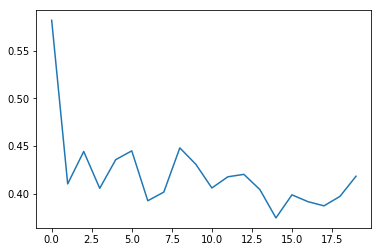

In [239]:

plt.plot(fixed_result.history['loss_std_loss'])
plt.show()


In [257]:
from keras.callbacks import Callback
from keras.callbacks import ModelCheckpoint
class PltCallback(Callback):
    def __init__(self, x_cache, y_cache):
        super(PltCallback, self).__init__()
        self.x_cache = x_cache
        self.y_cache = y_cache


    def on_epoch_begin(self, epoch, logs=None):
        input_image = self.model.input[0]
        input_mask = self.model.input[1]
        x_segment_in = self.model.get_layer('stn').output[0]
        mean_2 = self.model.get_layer('stn').output[2]
        y_segment_in = self.model.get_layer('tf_afin').output[0]
        y_segment_out = self.model.get_layer('segmentation_part').get_output_at(1)
        matrix = self.model.get_layer('stn').output[1]
        
        a1 = self.model.get_layer('probability_gamma').output[0]
        a2 = self.model.get_layer('noise').output[0]
        a3 = self.model.get_layer('gamma').output[0]
        a4 = self.model.get_layer('gamma_procent').output[0]
        x_segment_pl = model.get_layer('mean').output
        x_aug = self.model.get_layer('augment').output[0]
        y_aug = self.model.get_layer('augment').output[1]


        STN_debug_function = K.function([input_image, input_mask], 
                                        [x_aug,y_aug,x_segment_in,mean_2, y_segment_in,y_segment_out,matrix,a1,a2,a3,a4,x_segment_pl])
        
        batch_size = 1
        sel = np.random.randint(0, self.x_cache.shape[0], batch_size)
        x_batch, y_batch = self.x_cache[sel],  self.y_cache[sel]
        
        seg =[]
        font_t = {'family': 'serif',
                'color':  'darkgreen',
                'weight': 'normal',
                'size': 16
                 }

        x_aug,y_aug,np_x_segment_in,mean_2, np_y_segment_in, np_y_segment_out,matrix, a1,a2,a3,a4,np_segment_pl = STN_debug_function([x_batch, y_batch])

        print(mean_2)
        print("probality_gamma: "+ str(a1))
        print("noise: "+ str(a2))
        print("gamma: "+ str(a3))
        print("probaligamma_procentty_gamma: "+ str(a4))
        for item in np_x_segment_in:
            
            item = cv2.cvtColor(item, cv2.COLOR_YUV2RGB)
            item = np.transpose(item, (1,0,2))
            true_frame = item


        for item in np_y_segment_in:
            item = np.transpose(item, (1,0,2))
            true_mask=item[...,-1]

        for item in np_y_segment_out:
            item = np.transpose(item, (1,0,2))
            pred_mask = item[...,-1]
            seg.append(item)
        
        seg = np.array(seg)

        alpha = seg[0,...,1:2]

        frame = np.clip(true_frame*255.,0,255)
        
        c_frame_out = (1.-alpha.copy())*frame + alpha.copy()*(np.array([0,256,128]))
        
        plt.text(20, -10, r'True, predicted frame', fontdict=font_t)
        plt.imshow(np.hstack([(frame).astype(np.uint8), c_frame_out.astype(np.uint8)]))
        plt.show()
        

        print(true_mask.max())
        print(pred_mask.max())
        
        plt.text(20, -10, r'True and predict mask', fontdict=font_t)
        plt.imshow(np.hstack([true_mask, pred_mask]))
        plt.show()

        print(np_segment_pl)
        print((int(np_segment_pl[0][1][0]), int(np_segment_pl[0][0][0])))
        print((int(np_segment_pl[0][1][1]), int(np_segment_pl[0][0][1])))
        print(matrix)

        m = K.reshape(matrix,shape=(1, 2, 3))
        
        pts = tf.cast([[[0], [256],[1]],[[0], [0],[1]],[[256], [0],[1]]],'float32')
        npts=K.dot(m,pts)
        npts=K.reshape(npts, (1,2,3))
        print("npts")
        print(K.eval(npts))
        npts = K.eval(npts)

        
        x_batch2 = cv2.cvtColor(x_batch[0], cv2.COLOR_YUV2RGB)
        x_batch2 = np.transpose(x_batch2, (1,0,2))[None,...]
            
        for item in x_batch2:
            item1 = cv2.circle(item.copy(), (int(np_segment_pl[0][1][0]), int(np_segment_pl[0][0][0])), 12, (0, 0, 250), -1)
            item1 = cv2.circle(item1, (int(np_segment_pl[0][1][1]), int(np_segment_pl[0][0][1])), 12, (250, 0, 250), -1)

            x1=int(npts[0][1][0])
            x2=int(npts[0][1][1])
            x3=int(npts[0][1][2])
            x4=(abs(x1)-abs(x2))+x3
            
            y1=int(npts[0][0][0])
            y2=int(npts[0][0][1])
            y3=int(npts[0][0][2])
            y4=(abs(y1)-abs(y2))+y3
            
            print((x1,x2,x3,x4))
            print((y1,y2,y3,y4))
            
            cv2.line(item1, (x1,y1), (x2,y2), (0,255,50),2,4)
            cv2.line(item1, (x2,y2), (x3,y3), (250,255,10),2,4) 
            cv2.line(item1, (x3,y3), (x4 ,y4), (23,255,10),2,4)
            cv2.line(item1, (x4,y4), (x1,y1), (20,250,100),2,4)
            plt.imshow(item1)
            plt.show()



In [258]:
callbackshow = PltCallback(x_train[0:100],y_train[0:100])

Epoch 1/300
[[613.7945  495.72992]]
probality_gamma: [0.49645227]
noise: [0.45240635]
gamma: [0.5843729]
probaligamma_procentty_gamma: [0.37127712]


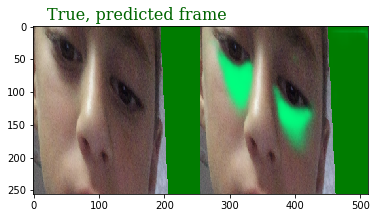

1.0
0.9943763


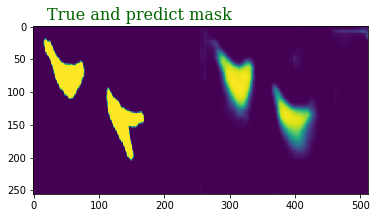

[[[605.23364 613.7945 ]
  [393.07413 495.72992]]]
(393, 605)
(495, 613)
[[[ 1.31025445e+00 -5.09756804e-01  5.11330780e+02]
  [-1.44046396e-01  3.06432438e+00  1.21934296e+02]]]
npts
[[[380.83304  511.33078  846.7559  ]
  [906.40137  121.934296  85.05842 ]]]
(906, 121, 85, 870)
(380, 511, 846, 715)


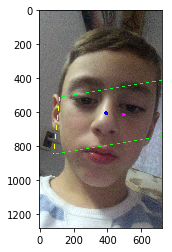

256/256 [==============================] - 57s 222ms/step - loss: 0.1829 - loss_median_loss: 0.1092 - loss_std_loss: 0.0350 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0386 - acc_loss: 0.0000e+00 - alpha_loss: 1.0154e-05 - val_loss: 0.4440 - val_loss_median_loss: 0.1000 - val_loss_std_loss: 0.0601 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2838 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.3325e-04
Epoch 2/300
[[515.87866 362.5534 ]]
probality_gamma: [0.5363328]
noise: [0.39796698]
gamma: [0.8261956]
probaligamma_procentty_gamma: [0.4250097]


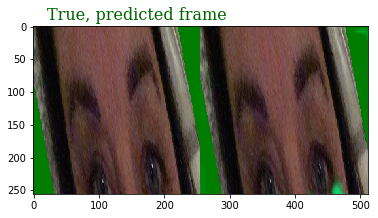

0.15686275
0.8084484


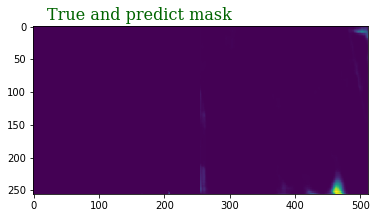

[[[611.3113  515.87866]
  [364.97952 362.5534 ]]]
(364, 611)
(362, 515)
[[[ 3.9683431e-01  3.7611714e-01  4.1694086e+02]
  [-5.6600970e-01  3.0421717e+00  4.5604649e+01]]]
npts
[[[513.22687 416.94086 518.53046]
  [824.40063  45.60465 -99.29384]]]
(824, 45, -99, 680)
(513, 416, 518, 615)


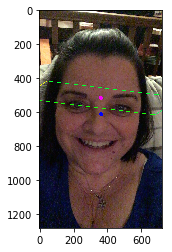

256/256 [==============================] - 57s 222ms/step - loss: 0.2156 - loss_median_loss: 0.1299 - loss_std_loss: 0.0416 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0441 - acc_loss: 0.0000e+00 - alpha_loss: 5.4137e-06 - val_loss: 0.4704 - val_loss_median_loss: 0.2837 - val_loss_std_loss: 0.0686 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1181 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 5.0404e-05
Epoch 3/300
[[448.29956 295.42038]]
probality_gamma: [0.5846344]
noise: [0.6238662]
gamma: [0.54315066]
probaligamma_procentty_gamma: [0.38697985]


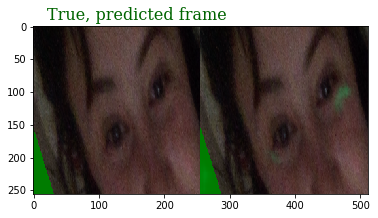

1.0
0.26523167


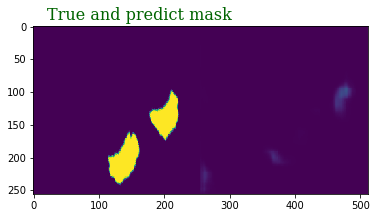

[[[511.62427 448.29956]
  [351.61694 295.42038]]]
(351, 511)
(295, 448)
[[[  0.66950744   0.8183699  257.85123   ]
  [ -0.6786181    2.171214   104.36809   ]]]
npts
[[[467.35394 257.85123 429.24512]
  [660.1989  104.36809 -69.35814]]]
(660, 104, -69, 487)
(467, 257, 429, 639)


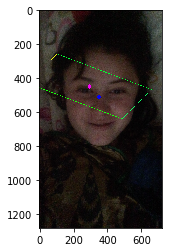

256/256 [==============================] - 57s 222ms/step - loss: 0.1914 - loss_median_loss: 0.1259 - loss_std_loss: 0.0356 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0300 - acc_loss: 0.0000e+00 - alpha_loss: 4.7692e-06 - val_loss: 0.2897 - val_loss_median_loss: 0.1484 - val_loss_std_loss: 0.0506 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0906 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.6330e-05
Epoch 4/300
[[555.7243  369.16013]]
probality_gamma: [0.5335665]
noise: [0.4795405]
gamma: [0.4152937]
probaligamma_procentty_gamma: [0.38288292]


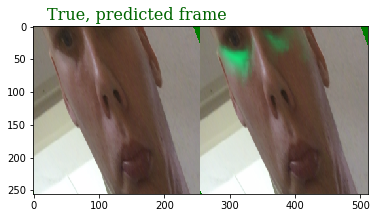

1.0
0.79686916


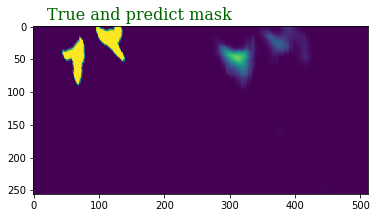

[[[480.6523  555.7243 ]
  [370.09784 369.16013]]]
(370, 480)
(369, 555)
[[[ 6.9677365e-01  2.8927076e-01  4.2951059e+02]
  [-7.9566276e-01  2.1160617e+00  2.0014905e+02]]]
npts
[[[503.5639   429.5106   607.88464 ]
  [741.86084  200.14905   -3.540619]]]
(741, 200, -3, 538)
(503, 429, 607, 681)


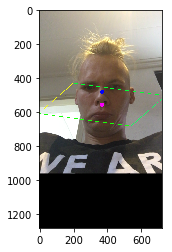

256/256 [==============================] - 57s 222ms/step - loss: 0.1948 - loss_median_loss: 0.1201 - loss_std_loss: 0.0415 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0332 - acc_loss: 0.0000e+00 - alpha_loss: 6.1673e-06 - val_loss: 0.3068 - val_loss_median_loss: 0.2039 - val_loss_std_loss: 0.0567 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0461 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.7048e-05
Epoch 5/300
[[625.02765 396.6168 ]]
probality_gamma: [0.4496959]
noise: [0.39443922]
gamma: [0.49957195]
probaligamma_procentty_gamma: [0.44425294]


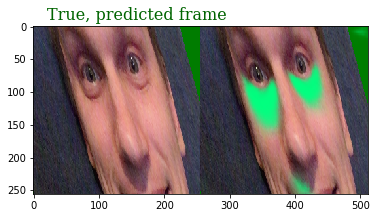

1.0
0.9949142


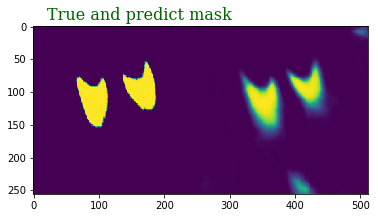

[[[605.9186  625.02765]
  [409.71136 396.6168 ]]]
(409, 605)
(396, 625)
[[[ 8.3818436e-01 -3.4785569e-03  5.1818530e+02]
  [-6.5622514e-01  2.4689057e+00  1.6459366e+02]]]
npts
[[[517.2948    518.1853    732.7605   ]
  [796.63354   164.59366    -3.3999786]]]
(796, 164, -3, 629)
(517, 518, 732, 731)


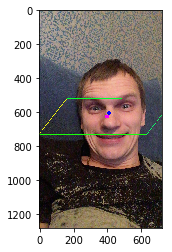

256/256 [==============================] - 57s 222ms/step - loss: 0.1692 - loss_median_loss: 0.0975 - loss_std_loss: 0.0377 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0340 - acc_loss: 0.0000e+00 - alpha_loss: 8.3428e-06 - val_loss: 0.2687 - val_loss_median_loss: 0.1321 - val_loss_std_loss: 0.0450 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0915 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.8438e-05
Epoch 6/300
[[510.04965 365.75266]]
probality_gamma: [0.44642735]
noise: [0.40683293]
gamma: [0.17097765]
probaligamma_procentty_gamma: [0.37970248]


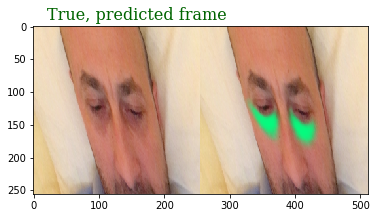

1.0
0.9744572


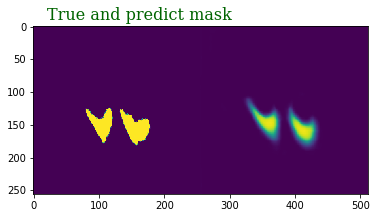

[[[529.7037  510.04965]
  [361.43594 365.75266]]]
(361, 529)
(365, 510)
[[[ 7.6886058e-01  2.9038188e-01  3.7446658e+02]
  [-6.1021352e-01  2.0280130e+00  1.8427431e+02]]]
npts
[[[448.80435  374.46658  571.2949  ]
  [703.4456   184.2743    28.059647]]]
(703, 184, 28, 547)
(448, 374, 571, 645)


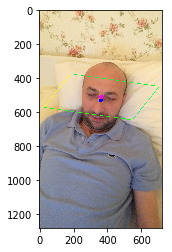

256/256 [==============================] - 57s 221ms/step - loss: 0.1607 - loss_median_loss: 0.0875 - loss_std_loss: 0.0377 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0355 - acc_loss: 0.0000e+00 - alpha_loss: 6.5208e-06 - val_loss: 0.2588 - val_loss_median_loss: 0.0662 - val_loss_std_loss: 0.0545 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1380 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0040e-04
Epoch 7/300
[[547.0092 357.0553]]
probality_gamma: [0.48046437]
noise: [0.412952]
gamma: [0.72716534]
probaligamma_procentty_gamma: [0.3982183]


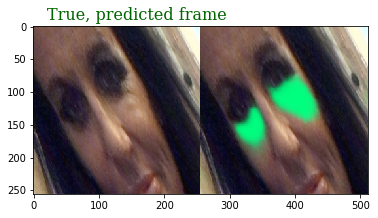

1.0
0.9972379


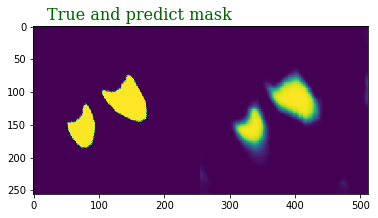

[[[543.73975 547.0092 ]
  [339.4501  357.0553 ]]]
(339, 543)
(357, 547)
[[[  0.6898291    0.4461825  401.59976   ]
  [ -0.85649425   1.6986508  249.25926   ]]]
npts
[[[515.8225   401.59976  578.19604 ]
  [684.1139   249.25926   29.996735]]]
(684, 249, 29, 464)
(515, 401, 578, 692)


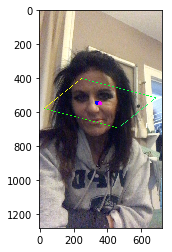

256/256 [==============================] - 56s 219ms/step - loss: 0.1568 - loss_median_loss: 0.0905 - loss_std_loss: 0.0352 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0311 - acc_loss: 0.0000e+00 - alpha_loss: 1.1901e-05 - val_loss: 0.3071 - val_loss_median_loss: 0.0787 - val_loss_std_loss: 0.0577 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1706 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.4402e-05
Epoch 8/300
[[595.1917  358.66208]]
probality_gamma: [0.36372575]
noise: [0.3619634]
gamma: [0.52995527]
probaligamma_procentty_gamma: [0.3962972]


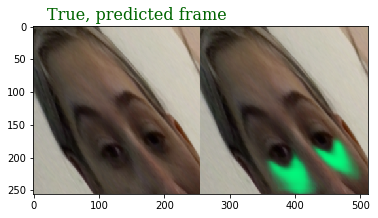

1.0
0.97181576


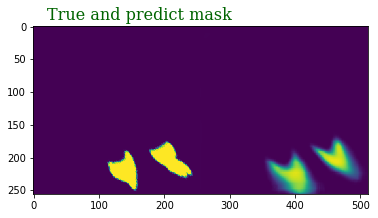

[[[661.8862  595.1917 ]
  [338.42484 358.66208]]]
(338, 661)
(358, 595)
[[[ 5.7751048e-01  3.8237339e-01  4.7232663e+02]
  [-1.0831501e+00  1.4496254e+00  3.1175327e+02]]]
npts
[[[570.21423  472.32663  620.1693  ]
  [682.85736  311.75327   34.466827]]]
(682, 311, 34, 405)
(570, 472, 620, 718)


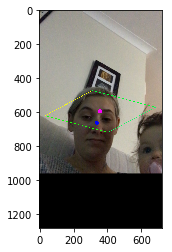

256/256 [==============================] - 56s 219ms/step - loss: 0.1667 - loss_median_loss: 0.0909 - loss_std_loss: 0.0396 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0361 - acc_loss: 0.0000e+00 - alpha_loss: 1.0773e-05 - val_loss: 0.2929 - val_loss_median_loss: 0.0940 - val_loss_std_loss: 0.0584 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1405 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.3959e-05
Epoch 9/300
[[498.4319 324.7152]]
probality_gamma: [0.35402614]
noise: [0.4944359]
gamma: [0.30385226]
probaligamma_procentty_gamma: [0.3903914]


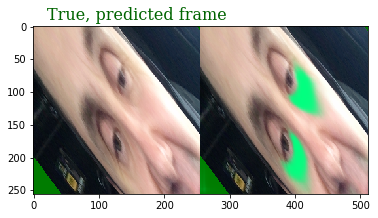

1.0
0.9917346


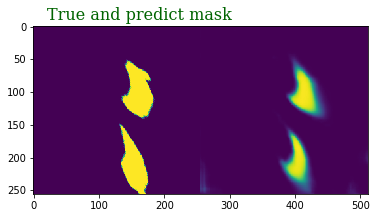

[[[529.52545 498.4319 ]
  [340.33365 324.7152 ]]]
(340, 529)
(324, 498)
[[[ 3.2455677e-01  7.3830640e-01  3.6238541e+02]
  [-1.3440322e+00  1.8052857e+00  2.6567474e+02]]]
npts
[[[551.39185 362.3854  445.47192]
  [727.8279  265.67474 -78.39749]]]
(727, 265, -78, 384)
(551, 362, 445, 634)


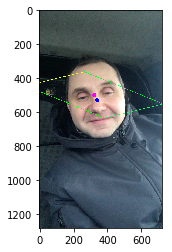

256/256 [==============================] - 56s 219ms/step - loss: 0.1645 - loss_median_loss: 0.0931 - loss_std_loss: 0.0389 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0325 - acc_loss: 0.0000e+00 - alpha_loss: 8.8264e-06 - val_loss: 0.3169 - val_loss_median_loss: 0.0865 - val_loss_std_loss: 0.0611 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1691 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.1729e-05
Epoch 10/300
[[628.0791  488.23175]]
probality_gamma: [0.51199174]
noise: [0.4719097]
gamma: [0.55287075]
probaligamma_procentty_gamma: [0.37986794]


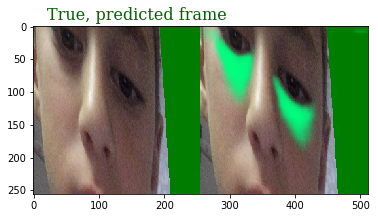

1.0
0.993796


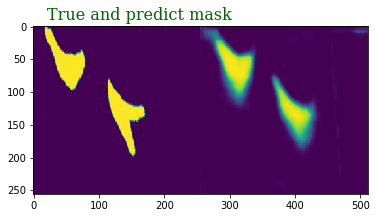

[[[605.23364 628.0791 ]
  [393.07413 488.23175]]]
(393, 605)
(488, 628)
[[[ 1.2520778e+00 -5.4473764e-01  5.3753955e+02]
  [-2.0333681e-01  3.1193333e+00  1.1498418e+02]]]
npts
[[[398.08673  537.53955  858.0715  ]
  [913.5335   114.98418   62.929955]]]
(913, 114, 62, 861)
(398, 537, 858, 719)


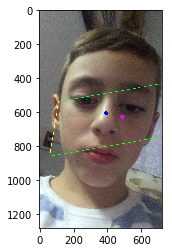

256/256 [==============================] - 57s 222ms/step - loss: 0.1770 - loss_median_loss: 0.1051 - loss_std_loss: 0.0356 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0363 - acc_loss: 0.0000e+00 - alpha_loss: 9.7303e-06 - val_loss: 0.2614 - val_loss_median_loss: 0.1951 - val_loss_std_loss: 0.0592 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0071 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.4065e-05
Epoch 11/300
[[394.37885 351.82397]]
probality_gamma: [0.5968442]
noise: [0.40045854]
gamma: [0.73837066]
probaligamma_procentty_gamma: [0.3975523]


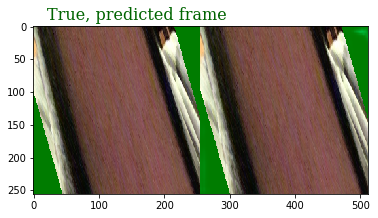

0.0
0.47663552


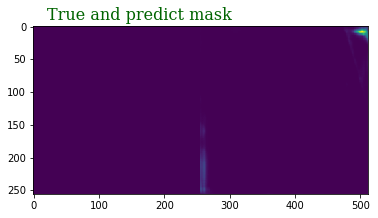

[[[611.3113  394.37885]
  [364.97952 351.82397]]]
(364, 611)
(351, 394)
[[[  0.33330166   0.39634416 300.98416   ]
  [ -0.838606     2.9472268   81.9205    ]]]
npts
[[[ 402.44827  300.98416  386.3094 ]
  [ 836.4105    81.9205  -132.76263]]]
(836, 81, -132, 623)
(402, 300, 386, 488)


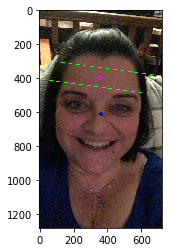

256/256 [==============================] - 57s 221ms/step - loss: 0.1629 - loss_median_loss: 0.0947 - loss_std_loss: 0.0370 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 1.0209e-05 - val_loss: 0.2453 - val_loss_median_loss: 0.0612 - val_loss_std_loss: 0.0602 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1238 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.3865e-05
Epoch 12/300
[[709.0519  382.02054]]
probality_gamma: [0.6536526]
noise: [0.6424016]
gamma: [0.39770973]
probaligamma_procentty_gamma: [0.3780402]


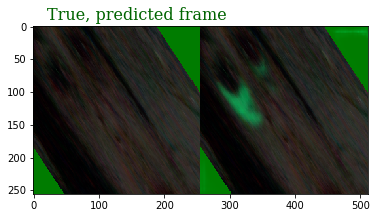

1.0
0.5847197


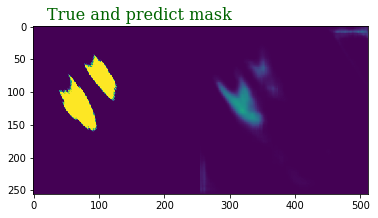

[[[684.3128  709.0519 ]
  [318.0591  382.02054]]]
(318, 684)
(382, 709)
[[[ 3.9461732e-01  3.4676057e-01  6.1415546e+02]
  [-1.5319346e+00  2.3127413e+00  2.8207727e+02]]]
npts
[[[ 702.92615  614.15546  715.1775 ]
  [ 874.13904  282.07727 -110.09799]]]
(874, 282, -110, 482)
(702, 614, 715, 803)


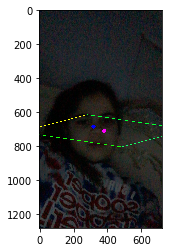

256/256 [==============================] - 56s 217ms/step - loss: 0.1645 - loss_median_loss: 0.0825 - loss_std_loss: 0.0378 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0442 - acc_loss: 0.0000e+00 - alpha_loss: 8.5895e-06 - val_loss: 0.3077 - val_loss_median_loss: 0.1184 - val_loss_std_loss: 0.0433 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1459 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.4367e-05
Epoch 13/300
[[535.0371  247.83167]]
probality_gamma: [0.2915652]
noise: [0.44015568]
gamma: [0.3747579]
probaligamma_procentty_gamma: [0.40735382]


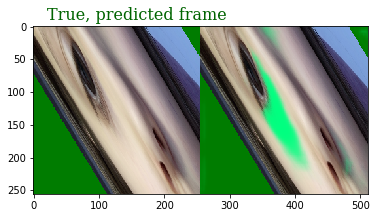

1.0
0.9960867


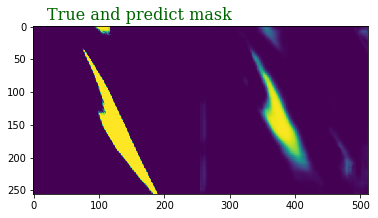

[[[518.52716 535.0371 ]
  [320.97488 247.83167]]]
(320, 518)
(247, 535)
[[[-7.5015426e-02  1.0250000e+00  4.1343906e+02]
  [-1.6313045e+00  2.6582623e+00  1.1638108e+02]]]
npts
[[[ 675.83905  413.43906  394.2351 ]
  [ 796.89624  116.38108 -301.23288]]]
(796, 116, -301, 379)
(675, 413, 394, 656)


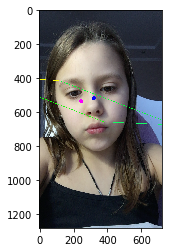

256/256 [==============================] - 56s 217ms/step - loss: 0.1597 - loss_median_loss: 0.0831 - loss_std_loss: 0.0363 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0404 - acc_loss: 0.0000e+00 - alpha_loss: 9.7862e-06 - val_loss: 0.3362 - val_loss_median_loss: 0.0973 - val_loss_std_loss: 0.0484 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1905 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.8628e-05
Epoch 14/300
[[535.8452  351.98392]]
probality_gamma: [0.6151606]
noise: [0.64442456]
gamma: [0.5600037]
probaligamma_procentty_gamma: [0.37901503]


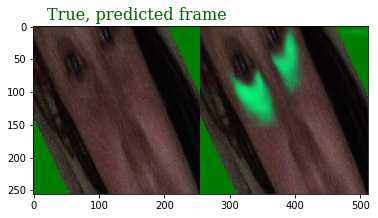

1.0
0.9351055


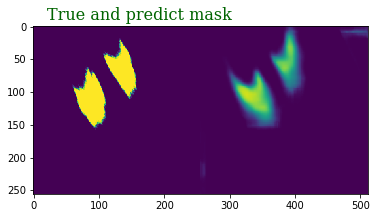

[[[511.62427 535.8452 ]
  [351.61694 351.98392]]]
(351, 511)
(351, 535)
[[[ 3.9565569e-01  5.5677414e-01  4.1393420e+02]
  [-1.2387773e+00  2.6509645e+00  1.7122392e+02]]]
npts
[[[ 556.4684   413.9342   515.22205]
  [ 849.87085  171.22392 -145.90306]]]
(849, 171, -145, 533)
(556, 413, 515, 658)


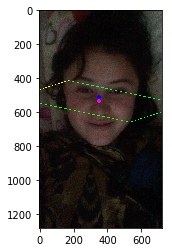

256/256 [==============================] - 56s 217ms/step - loss: 0.1592 - loss_median_loss: 0.0892 - loss_std_loss: 0.0365 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0335 - acc_loss: 0.0000e+00 - alpha_loss: 1.0756e-05 - val_loss: 0.3664 - val_loss_median_loss: 0.1065 - val_loss_std_loss: 0.0504 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2094 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.6758e-05
Epoch 15/300
[[558.09644 393.04816]]
probality_gamma: [0.41867697]
noise: [0.32995766]
gamma: [0.40878236]
probaligamma_procentty_gamma: [0.42400777]


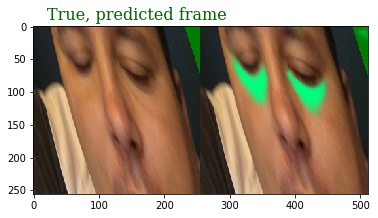

1.0
0.99378175


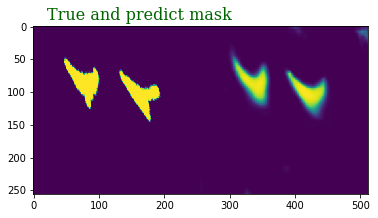

[[[530.7168  558.09644]
  [401.5919  393.04816]]]
(401, 530)
(393, 558)
[[[ 7.7926314e-01  1.5726659e-01  4.3822058e+02]
  [-7.1564806e-01  2.2471509e+00  1.9701581e+02]]]
npts
[[[478.48083  438.22058  637.7119  ]
  [772.28644  197.01581   13.809906]]]
(772, 197, 13, 588)
(478, 438, 637, 677)


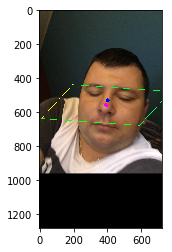

256/256 [==============================] - 56s 218ms/step - loss: 0.2706 - loss_median_loss: 0.1974 - loss_std_loss: 0.0393 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0339 - acc_loss: 0.0000e+00 - alpha_loss: 1.3286e-05 - val_loss: 0.2387 - val_loss_median_loss: 0.1737 - val_loss_std_loss: 0.0614 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0036 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.6182e-05
Epoch 16/300
[[504.28522 485.67087]]
probality_gamma: [0.524541]
noise: [0.31095037]
gamma: [0.33215958]
probaligamma_procentty_gamma: [0.3870223]


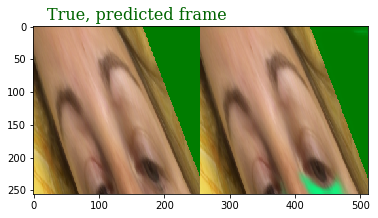

1.0
0.93707854


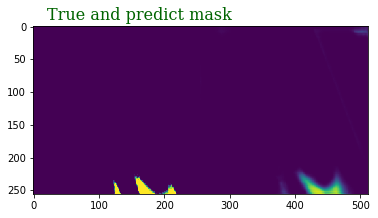

[[[599.5436  504.28522]
  [425.2938  485.67087]]]
(425, 599)
(485, 504)
[[[ 4.8826903e-01  2.0599635e-01  4.1541925e+02]
  [-1.0096397e+00  2.6367509e+00  2.7740063e+02]]]
npts
[[[468.15433  415.41925  540.41614 ]
  [952.4089   277.40063   18.932861]]]
(952, 277, 18, 693)
(468, 415, 540, 593)


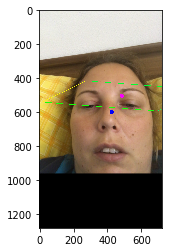

256/256 [==============================] - 56s 217ms/step - loss: 0.2053 - loss_median_loss: 0.1358 - loss_std_loss: 0.0352 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0344 - acc_loss: 0.0000e+00 - alpha_loss: 1.5127e-05 - val_loss: 0.3028 - val_loss_median_loss: 0.1885 - val_loss_std_loss: 0.0526 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0616 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.1115e-04
Epoch 17/300
[[557.6559 272.0835]]
probality_gamma: [0.40383488]
noise: [0.32529232]
gamma: [0.6873694]
probaligamma_procentty_gamma: [0.40482786]


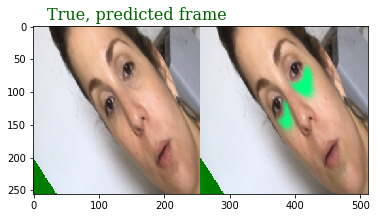

1.0
0.99546295


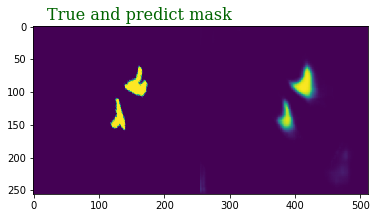

[[[560.65845 557.6559 ]
  [320.8733  272.0835 ]]]
(320, 560)
(272, 557)
[[[  0.5976529   0.7367462 386.85278  ]
  [ -1.0058036   1.5564247 201.604    ]]]
npts
[[[575.45984  386.85278  539.8519  ]
  [600.0487   201.604    -55.881714]]]
(600, 201, -55, 344)
(575, 386, 539, 728)


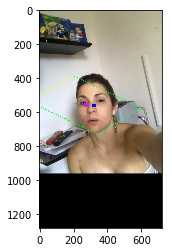

256/256 [==============================] - 56s 217ms/step - loss: 0.1687 - loss_median_loss: 0.0999 - loss_std_loss: 0.0383 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0305 - acc_loss: 0.0000e+00 - alpha_loss: 1.4850e-05 - val_loss: 0.3233 - val_loss_median_loss: 0.1555 - val_loss_std_loss: 0.0500 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1177 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.5661e-05
Epoch 18/300
[[499.54724 401.50766]]
probality_gamma: [0.8479923]
noise: [0.33233193]
gamma: [0.8856594]
probaligamma_procentty_gamma: [0.41208133]


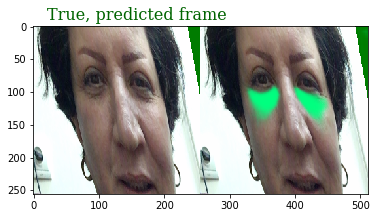

1.0
0.9991654


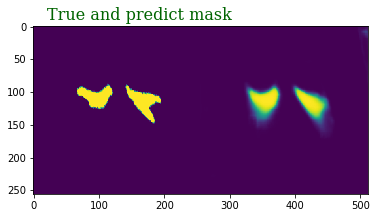

[[[478.4229  499.54724]
  [424.6719  401.50766]]]
(424, 478)
(401, 499)
[[[ 1.2118480e+00 -1.8262157e-01  3.6780624e+02]
  [-4.2671248e-01  2.4152772e+00  1.4697134e+02]]]
npts
[[[321.0551  367.80624 678.0393 ]
  [765.28235 146.97134  37.73295]]]
(765, 146, 37, 656)
(321, 367, 678, 632)


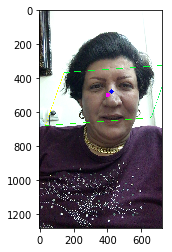

256/256 [==============================] - 55s 217ms/step - loss: 0.1575 - loss_median_loss: 0.0869 - loss_std_loss: 0.0395 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 9.1854e-06 - val_loss: 0.2391 - val_loss_median_loss: 0.1326 - val_loss_std_loss: 0.0449 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0616 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.8998e-05
Epoch 19/300
[[623.2076  363.72174]]
probality_gamma: [0.35073477]
noise: [0.44248086]
gamma: [0.48070887]
probaligamma_procentty_gamma: [0.45552355]


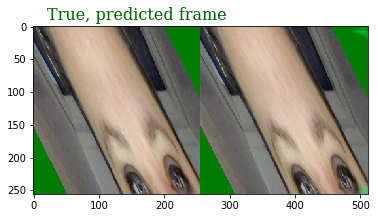

1.0
0.5265017


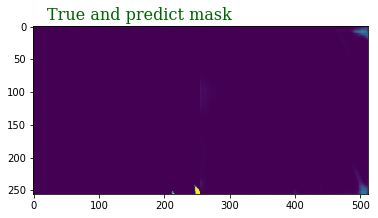

[[[729.5802  623.2076 ]
  [394.15756 363.72174]]]
(394, 729)
(363, 623)
[[[ 5.1597840e-01  1.8135476e-01  5.3394891e+02]
  [-1.3104874e+00  2.5910673e+00  1.9980751e+02]]]
npts
[[[ 580.37573  533.9489   666.03937]
  [ 863.1207   199.80751 -135.67726]]]
(863, 199, -135, 529)
(580, 533, 666, 713)


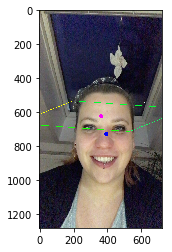

256/256 [==============================] - 56s 217ms/step - loss: 0.1540 - loss_median_loss: 0.0827 - loss_std_loss: 0.0372 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0341 - acc_loss: 0.0000e+00 - alpha_loss: 8.9026e-06 - val_loss: 0.2912 - val_loss_median_loss: 0.1504 - val_loss_std_loss: 0.0529 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0877 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.2639e-04
Epoch 20/300
[[509.283   271.10925]]
probality_gamma: [0.5033611]
noise: [0.5037686]
gamma: [0.43259534]
probaligamma_procentty_gamma: [0.37468332]


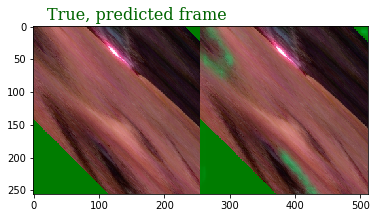

1.0
0.47769302


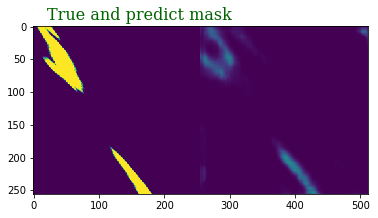

[[[475.6113  509.283  ]
  [193.45126 271.10925]]]
(193, 475)
(271, 509)
[[[-2.6869893e-01  9.8727095e-01  4.1730576e+02]
  [-1.9321530e+00  1.9186999e+00  2.7283124e+02]]]
npts
[[[ 670.0471   417.30576  348.51883]
  [ 764.01843  272.83124 -221.79993]]]
(764, 272, -221, 271)
(670, 417, 348, 601)


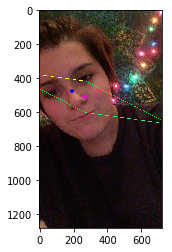

256/256 [==============================] - 56s 217ms/step - loss: 0.1620 - loss_median_loss: 0.0828 - loss_std_loss: 0.0385 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0407 - acc_loss: 0.0000e+00 - alpha_loss: 1.0539e-05 - val_loss: 0.3114 - val_loss_median_loss: 0.0994 - val_loss_std_loss: 0.0481 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1638 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.7324e-05
Epoch 21/300
[[681.708   319.21786]]
probality_gamma: [0.49083406]
noise: [0.42673373]
gamma: [1.0347685]
probaligamma_procentty_gamma: [0.4017827]


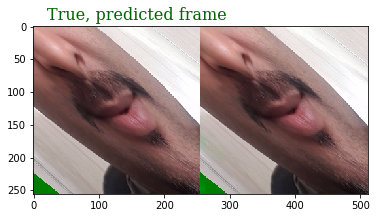

0.0
0.17502253


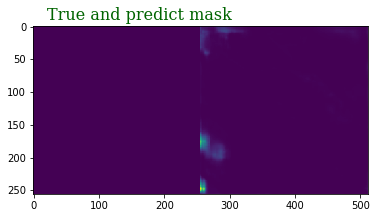

[[[546.599   681.708  ]
  [322.79675 319.21786]]]
(322, 546)
(319, 681)
[[[ 4.2174917e-01  4.5119849e-01  5.6997064e+02]
  [-1.6119528e+00  1.2962146e+00  3.5963232e+02]]]
npts
[[[685.4775   569.97064  677.9384  ]
  [691.46326  359.63232  -53.027588]]]
(691, 359, -53, 279)
(685, 569, 677, 793)


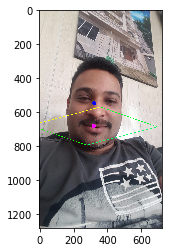

256/256 [==============================] - 56s 217ms/step - loss: 0.1634 - loss_median_loss: 0.0958 - loss_std_loss: 0.0370 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0306 - acc_loss: 0.0000e+00 - alpha_loss: 9.3068e-06 - val_loss: 0.2741 - val_loss_median_loss: 0.2184 - val_loss_std_loss: 0.0547 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 8.6410e-04 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0966e-04
Epoch 22/300
[[425.88577 295.26395]]
probality_gamma: [0.5351194]
noise: [0.6013173]
gamma: [0.54066765]
probaligamma_procentty_gamma: [0.37689197]


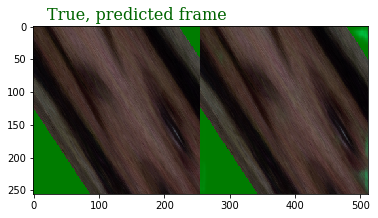

1.0
0.4874545


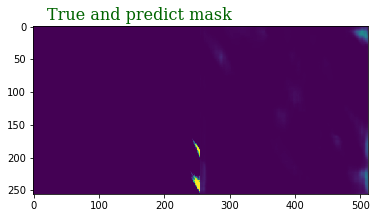

[[[511.62427 425.88577]
  [351.61694 295.26395]]]
(351, 511)
(295, 425)
[[[-6.1202765e-02  6.2043971e-01  3.5430341e+02]
  [-1.5540650e+00  2.3546941e+00  1.9278342e+02]]]
npts
[[[ 513.136    354.3034   338.6355 ]
  [ 795.5851   192.78342 -205.05722]]]
(795, 192, -205, 398)
(513, 354, 338, 497)


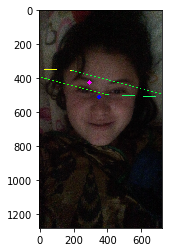

256/256 [==============================] - 56s 217ms/step - loss: 0.1597 - loss_median_loss: 0.0890 - loss_std_loss: 0.0351 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0355 - acc_loss: 0.0000e+00 - alpha_loss: 1.3735e-05 - val_loss: 0.3030 - val_loss_median_loss: 0.0644 - val_loss_std_loss: 0.0482 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1903 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.1093e-04
Epoch 23/300
[[616.70154 414.33865]]
probality_gamma: [0.43407583]
noise: [0.31308395]
gamma: [0.38821208]
probaligamma_procentty_gamma: [0.37252426]


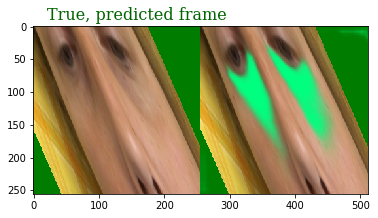

1.0
0.9974993


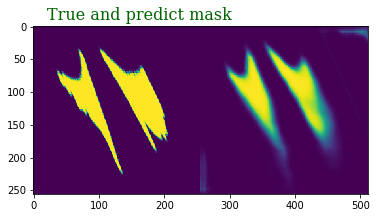

[[[607.397   616.70154]
  [442.62842 414.33865]]]
(442, 607)
(414, 616)
[[[ 5.9639478e-01  9.9471807e-03  5.3908972e+02]
  [-1.2901864e+00  2.9410520e+00  2.0302783e+02]]]
npts
[[[ 541.6362   539.0897   691.7668 ]
  [ 955.93713  203.02783 -127.25989]]]
(955, 203, -127, 625)
(541, 539, 691, 693)


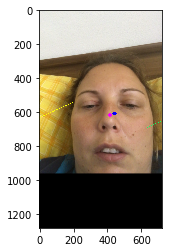

256/256 [==============================] - 56s 217ms/step - loss: 0.1854 - loss_median_loss: 0.1001 - loss_std_loss: 0.0377 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0477 - acc_loss: 0.0000e+00 - alpha_loss: 1.5099e-05 - val_loss: 0.3832 - val_loss_median_loss: 0.0704 - val_loss_std_loss: 0.0408 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2720 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.4750e-05
Epoch 24/300
[[807.4569  353.55713]]
probality_gamma: [0.3089104]
noise: [0.38634637]
gamma: [0.50215113]
probaligamma_procentty_gamma: [0.46169275]


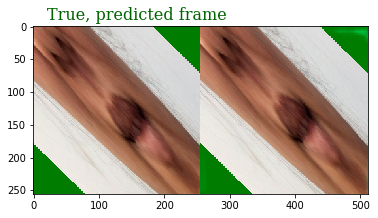

0.0
0.51775086


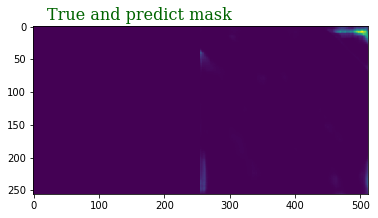

[[[676.8799  807.4569 ]
  [357.36725 353.55713]]]
(357, 676)
(353, 807)
[[[ 1.16116464e-01  4.72332329e-01  7.32135498e+02]
  [-2.01353192e+00  1.96651351e+00  3.59575470e+02]]]
npts
[[[ 853.05255  732.1355   761.8613 ]
  [ 863.0029   359.57547 -155.8887 ]]]
(863, 359, -155, 349)
(853, 732, 761, 882)


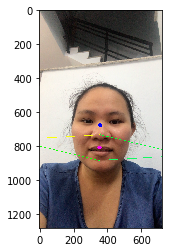

256/256 [==============================] - 55s 217ms/step - loss: 0.2086 - loss_median_loss: 0.1269 - loss_std_loss: 0.0450 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0367 - acc_loss: 0.0000e+00 - alpha_loss: 1.4703e-05 - val_loss: 0.3000 - val_loss_median_loss: 0.1231 - val_loss_std_loss: 0.0527 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1241 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.3809e-04
Epoch 25/300
[[536.5562 321.8194]]
probality_gamma: [0.32837886]
noise: [0.479808]
gamma: [0.38977653]
probaligamma_procentty_gamma: [0.39812082]


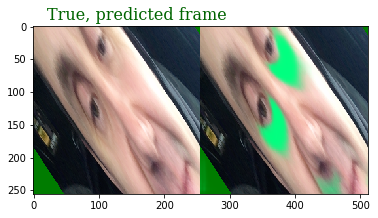

1.0
0.9975835


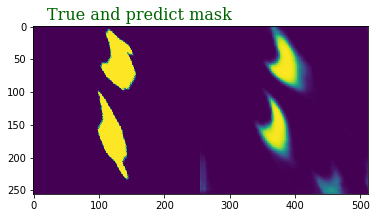

[[[529.52545 536.5562 ]
  [340.33365 321.8194 ]]]
(340, 529)
(321, 536)
[[[ 3.4829319e-01  6.0035348e-01  4.1512939e+02]
  [-1.2900590e+00  1.9495378e+00  2.3740608e+02]]]
npts
[[[568.8199   415.1294   504.29245 ]
  [736.48773  237.40608  -92.849014]]]
(736, 237, -92, 407)
(568, 415, 504, 657)


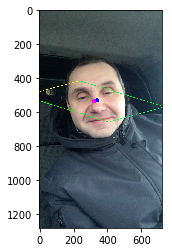

256/256 [==============================] - 56s 219ms/step - loss: 0.1637 - loss_median_loss: 0.0949 - loss_std_loss: 0.0361 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0326 - acc_loss: 0.0000e+00 - alpha_loss: 1.4935e-05 - val_loss: 0.3071 - val_loss_median_loss: 0.1048 - val_loss_std_loss: 0.0559 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1462 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.2041e-04
Epoch 26/300
[[648.63995 343.38284]]
probality_gamma: [0.42088813]
noise: [0.36969295]
gamma: [0.66209286]
probaligamma_procentty_gamma: [0.386422]


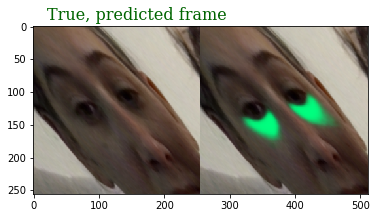

1.0
0.99618584


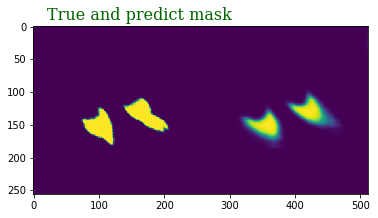

[[[661.8862  648.63995]
  [338.42484 343.38284]]]
(338, 661)
(343, 648)
[[[ 5.7139862e-01  3.9283979e-01  5.2521747e+02]
  [-1.2413650e+00  1.3932483e+00  3.2394180e+02]]]
npts
[[[625.7844    525.21747   671.4955   ]
  [680.6134    323.9418      6.1523743]]]
(680, 323, 6, 363)
(625, 525, 671, 771)


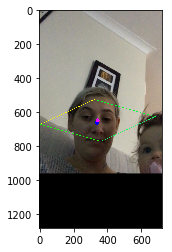

256/256 [==============================] - 56s 220ms/step - loss: 0.1590 - loss_median_loss: 0.0893 - loss_std_loss: 0.0374 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0322 - acc_loss: 0.0000e+00 - alpha_loss: 1.6615e-05 - val_loss: 0.2917 - val_loss_median_loss: 0.1115 - val_loss_std_loss: 0.0486 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1315 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.3642e-05
Epoch 27/300
[[501.4234 330.1062]]
probality_gamma: [0.6663031]
noise: [0.41263083]
gamma: [1.001781]
probaligamma_procentty_gamma: [0.3926439]


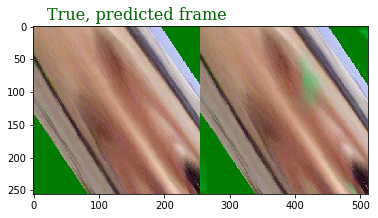

0.0
0.4028097


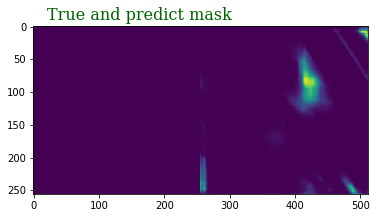

[[[623.00726 501.4234 ]
  [341.96127 330.1062 ]]]
(341, 623)
(330, 501)
[[[ 1.7603219e-01  4.8227453e-01  4.1716016e+02]
  [-1.7018073e+00  2.5297799e+00  2.2412570e+02]]]
npts
[[[ 540.62244  417.16016  462.2244 ]
  [ 871.7494   224.1257  -211.53696]]]
(871, 224, -211, 436)
(540, 417, 462, 585)


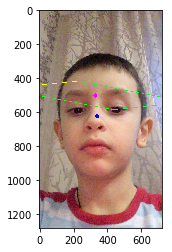

256/256 [==============================] - 56s 219ms/step - loss: 0.1526 - loss_median_loss: 0.0863 - loss_std_loss: 0.0344 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0318 - acc_loss: 0.0000e+00 - alpha_loss: 1.4980e-05 - val_loss: 0.3248 - val_loss_median_loss: 0.0856 - val_loss_std_loss: 0.0472 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1918 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.1112e-04
Epoch 28/300
[[201.41718 414.647  ]]
probality_gamma: [0.58993715]
noise: [0.43953001]
gamma: [0.6781741]
probaligamma_procentty_gamma: [0.42114115]


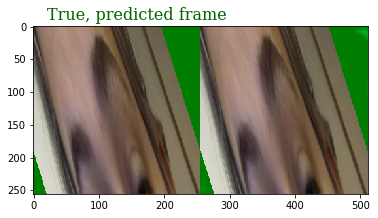

0.0
0.4023165


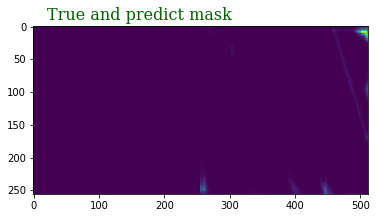

[[[312.8985  201.41718]
  [299.31894 414.647  ]]]
(299, 312)
(414, 201)
[[[  0.20258808   0.890806    61.46271   ]
  [ -0.8858082    2.8097053  168.38815   ]]]
npts
[[[289.50906   61.46271  113.32526 ]
  [887.6727   168.38815  -58.378754]]]
(887, 168, -58, 661)
(289, 61, 113, 341)


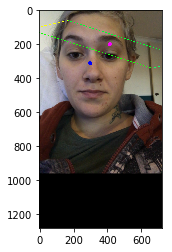

256/256 [==============================] - 56s 218ms/step - loss: 0.1610 - loss_median_loss: 0.0893 - loss_std_loss: 0.0358 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0359 - acc_loss: 0.0000e+00 - alpha_loss: 1.3239e-05 - val_loss: 0.2393 - val_loss_median_loss: 0.1119 - val_loss_std_loss: 0.0473 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0799 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.7763e-05
Epoch 29/300
[[632.5379  397.56342]]
probality_gamma: [0.26358953]
noise: [0.40333796]
gamma: [0.4361462]
probaligamma_procentty_gamma: [0.40041214]


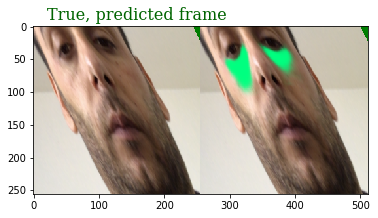

1.0
0.99979275


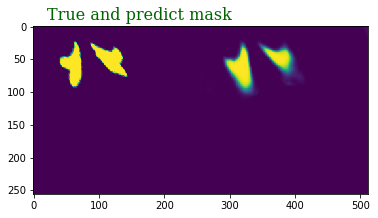

[[[563.1264  632.5379 ]
  [391.88367 397.56342]]]
(391, 563)
(397, 632)
[[[ 8.8989460e-01  1.2080662e-01  5.0316812e+02]
  [-8.6577809e-01  1.8000212e+00  2.7798029e+02]]]
npts
[[[534.0946   503.16812  730.98114 ]
  [738.7857   277.9803    56.341095]]]
(738, 277, 56, 517)
(534, 503, 730, 761)


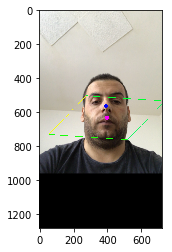

256/256 [==============================] - 56s 218ms/step - loss: 0.1661 - loss_median_loss: 0.0920 - loss_std_loss: 0.0429 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 1.1520e-05 - val_loss: 0.2332 - val_loss_median_loss: 0.1089 - val_loss_std_loss: 0.0493 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0750 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.7602e-05
Epoch 30/300
[[397.9317 309.6167]]
probality_gamma: [0.41692722]
noise: [0.5489567]
gamma: [0.34877175]
probaligamma_procentty_gamma: [0.3759634]


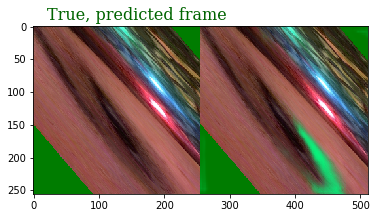

1.0
0.93374324


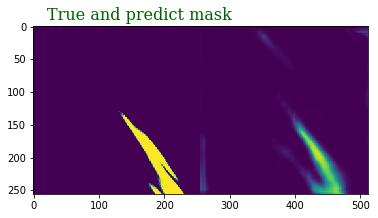

[[[475.6113  397.9317 ]
  [193.45126 309.6167 ]]]
(193, 475)
(309, 397)
[[[-1.3016331e-01  7.3338044e-01  3.2071991e+02]
  [-1.8160577e+00  2.1190076e+00  2.7083911e+02]]]
npts
[[[ 508.4653   320.7199   287.3981 ]
  [ 813.30505  270.8391  -194.07166]]]
(813, 270, -194, 349)
(508, 320, 287, 475)


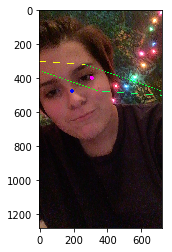

256/256 [==============================] - 55s 217ms/step - loss: 0.1735 - loss_median_loss: 0.1007 - loss_std_loss: 0.0373 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0354 - acc_loss: 0.0000e+00 - alpha_loss: 1.5978e-05 - val_loss: 0.2926 - val_loss_median_loss: 0.1246 - val_loss_std_loss: 0.0485 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1194 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0223e-04
Epoch 31/300
[[547.4894  358.10748]]
probality_gamma: [0.48871058]
noise: [0.38468105]
gamma: [0.501807]
probaligamma_procentty_gamma: [0.42999214]


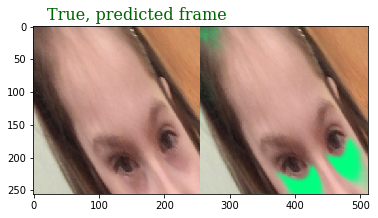

1.0
0.9986802


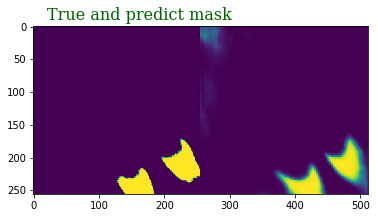

[[[638.256   547.4894 ]
  [346.5645  358.10748]]]
(346, 638)
(358, 547)
[[[  0.5586838    0.47877264 414.69492   ]
  [ -1.0812963    1.6459389  285.8332    ]]]
npts
[[[537.26074  414.69492  557.71796 ]
  [707.19354  285.8332     9.021332]]]
(707, 285, 9, 431)
(537, 414, 557, 680)


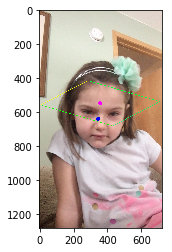

256/256 [==============================] - 56s 218ms/step - loss: 0.1554 - loss_median_loss: 0.0911 - loss_std_loss: 0.0362 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0281 - acc_loss: 0.0000e+00 - alpha_loss: 1.7031e-05 - val_loss: 0.2936 - val_loss_median_loss: 0.0879 - val_loss_std_loss: 0.0432 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1624 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0281e-04
Epoch 32/300
[[646.9738  395.87064]]
probality_gamma: [0.46764287]
noise: [0.57671714]
gamma: [0.34122926]
probaligamma_procentty_gamma: [0.3717881]


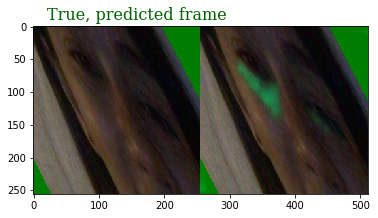

1.0
0.46878585


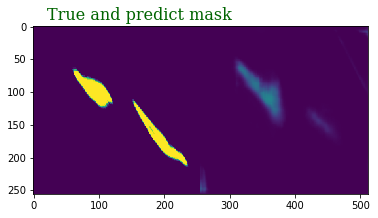

[[[650.93585 646.9738 ]
  [426.69916 395.87064]]]
(426, 650)
(395, 646)
[[[ 6.5263534e-01  1.1643261e-02  5.6194617e+02]
  [-1.2340899e+00  2.3812900e+00  2.4902905e+02]]]
npts
[[[564.9268  561.94617 729.0208 ]
  [858.6393  249.02905 -66.89795]]]
(858, 249, -66, 543)
(564, 561, 729, 732)


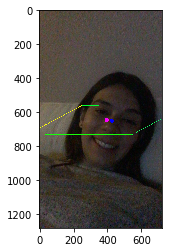

256/256 [==============================] - 56s 217ms/step - loss: 0.1545 - loss_median_loss: 0.0840 - loss_std_loss: 0.0396 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0310 - acc_loss: 0.0000e+00 - alpha_loss: 1.7752e-05 - val_loss: 0.3409 - val_loss_median_loss: 0.0672 - val_loss_std_loss: 0.0530 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2205 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.6136e-04
Epoch 33/300
[[384.73843 226.05298]]
probality_gamma: [0.3557578]
noise: [0.49859673]
gamma: [0.46135768]
probaligamma_procentty_gamma: [0.37702042]


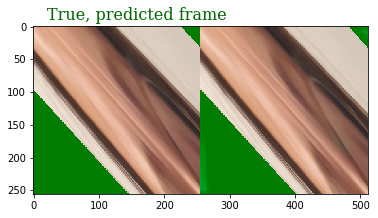

0.0
0.3510145


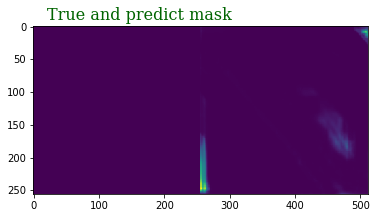

[[[522.3874  384.73843]
  [246.74948 226.05298]]]
(246, 522)
(226, 384)
[[[ -0.47243798   0.9876449  318.79196   ]
  [ -2.090753     2.2873478  200.88885   ]]]
npts
[[[ 571.629    318.79196  197.84784]
  [ 786.4499   200.88885 -334.34393]]]
(786, 200, -334, 252)
(571, 318, 197, 450)


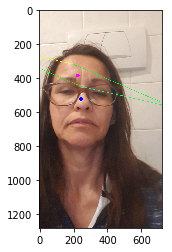

256/256 [==============================] - 56s 217ms/step - loss: 0.1538 - loss_median_loss: 0.0829 - loss_std_loss: 0.0378 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0330 - acc_loss: 0.0000e+00 - alpha_loss: 1.5051e-05 - val_loss: 0.3553 - val_loss_median_loss: 0.0742 - val_loss_std_loss: 0.0540 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2269 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.3518e-04
Epoch 34/300
[[504.07617 338.21555]]
probality_gamma: [0.3351848]
noise: [0.3371782]
gamma: [0.24286]
probaligamma_procentty_gamma: [0.38819787]


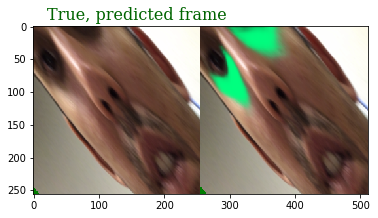

1.0
0.9993099


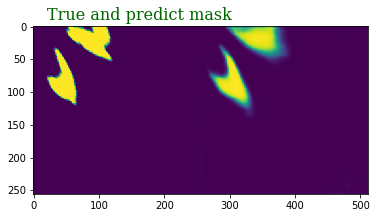

[[[440.19626 504.07617]
  [359.37936 338.21555]]]
(359, 440)
(338, 504)
[[[  0.4080677    0.52994204 384.01093   ]
  [ -1.2516088    1.5027113  306.07446   ]]]
npts
[[[519.6761   384.01093  488.47626 ]
  [690.76855  306.07446  -14.337402]]]
(690, 306, -14, 370)
(519, 384, 488, 623)


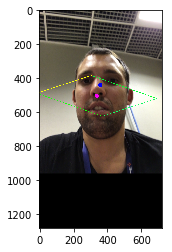

256/256 [==============================] - 56s 217ms/step - loss: 0.1518 - loss_median_loss: 0.0820 - loss_std_loss: 0.0330 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0368 - acc_loss: 0.0000e+00 - alpha_loss: 1.5915e-05 - val_loss: 0.4090 - val_loss_median_loss: 0.1112 - val_loss_std_loss: 0.0531 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2445 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.5333e-04
Epoch 35/300
[[510.3028 319.7342]]
probality_gamma: [0.56069744]
noise: [0.37529853]
gamma: [0.9692908]
probaligamma_procentty_gamma: [0.3827361]


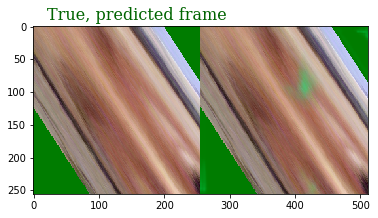

0.0
0.50588816


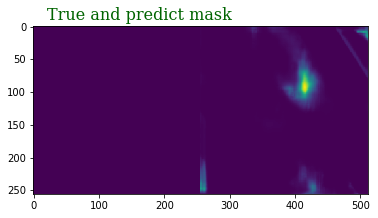

[[[623.00726 510.3028 ]
  [341.96127 319.7342 ]]]
(341, 623)
(319, 510)
[[[ 1.5399754e-01  3.4645230e-01  4.4624521e+02]
  [-1.6719487e+00  2.5590956e+00  2.0617937e+02]]]
npts
[[[ 534.937    446.2452   485.66858]
  [ 861.30786  206.17937 -221.8395 ]]]
(861, 206, -221, 434)
(534, 446, 485, 573)


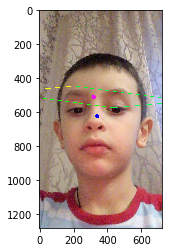

256/256 [==============================] - 56s 217ms/step - loss: 0.1569 - loss_median_loss: 0.0899 - loss_std_loss: 0.0359 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0311 - acc_loss: 0.0000e+00 - alpha_loss: 1.4518e-05 - val_loss: 0.2740 - val_loss_median_loss: 0.0935 - val_loss_std_loss: 0.0538 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1266 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.4097e-04
Epoch 36/300
[[645.41943 303.2039 ]]
probality_gamma: [0.3307999]
noise: [0.39541808]
gamma: [0.37018818]
probaligamma_procentty_gamma: [0.42607027]


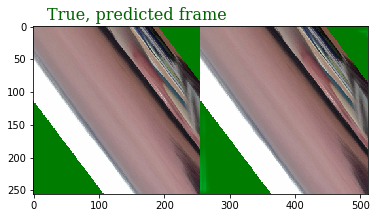

0.0
0.33649775


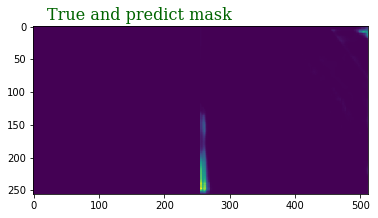

[[[795.9303  645.41943]
  [306.58124 303.2039 ]]]
(306, 795)
(303, 645)
[[[-2.5377870e-02  3.7113848e-01  6.0116211e+02]
  [-1.9673104e+00  2.5931582e+00  2.2309537e+02]]]
npts
[[[ 696.1736   601.1621   594.6654 ]
  [ 886.94385  223.09537 -280.5361 ]]]
(886, 223, -280, 383)
(696, 601, 594, 689)


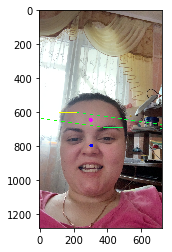

256/256 [==============================] - 56s 217ms/step - loss: 0.1611 - loss_median_loss: 0.0908 - loss_std_loss: 0.0396 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0307 - acc_loss: 0.0000e+00 - alpha_loss: 1.0334e-05 - val_loss: 0.2698 - val_loss_median_loss: 0.0752 - val_loss_std_loss: 0.0524 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1420 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.3268e-04
Epoch 37/300
[[653.09937 259.9465 ]]
probality_gamma: [0.36688536]
noise: [0.37711856]
gamma: [0.23471838]
probaligamma_procentty_gamma: [0.3839879]


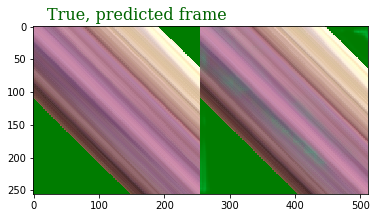

0.0
0.4050001


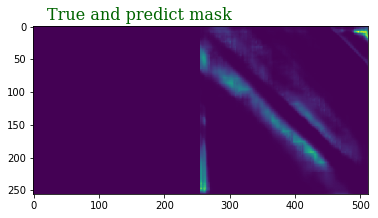

[[[738.8611  653.09937]
  [255.85606 259.9465 ]]]
(255, 738)
(259, 653)
[[[-2.4355435e-01  2.9196686e-01  6.4690253e+02]
  [-2.4102731e+00  2.3728883e+00  2.6473175e+02]]]
npts
[[[ 721.64606  646.9025   584.5526 ]
  [ 872.19116  264.73175 -352.29816]]]
(872, 264, -352, 256)
(721, 646, 584, 659)


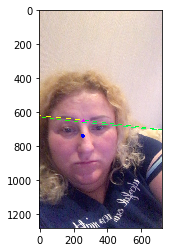

256/256 [==============================] - 56s 217ms/step - loss: 0.1564 - loss_median_loss: 0.0906 - loss_std_loss: 0.0307 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0350 - acc_loss: 0.0000e+00 - alpha_loss: 8.8247e-06 - val_loss: 0.3488 - val_loss_median_loss: 0.1128 - val_loss_std_loss: 0.0593 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1765 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.1266e-04
Epoch 38/300
[[582.4742  338.67807]]
probality_gamma: [0.32006]
noise: [0.44636375]
gamma: [0.5346761]
probaligamma_procentty_gamma: [0.3780768]


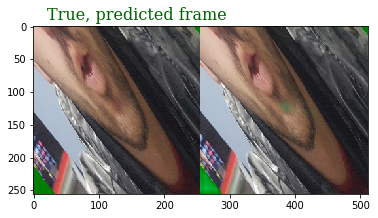

0.0
0.5013881


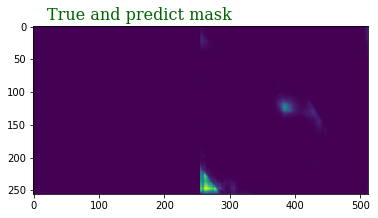

[[[414.72366 582.4742 ]
  [336.7524  338.67807]]]
(336, 414)
(338, 582)
[[[ 3.1310225e-01  6.1115634e-01  4.6416910e+02]
  [-1.3500488e+00  1.7570404e+00  2.8658313e+02]]]
npts
[[[620.6251   464.1691   544.32324 ]
  [736.3855   286.58313  -59.029358]]]
(736, 286, -59, 391)
(620, 464, 544, 700)


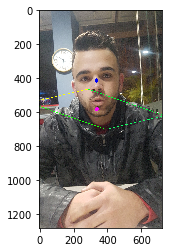

256/256 [==============================] - 56s 218ms/step - loss: 0.1590 - loss_median_loss: 0.0931 - loss_std_loss: 0.0337 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0322 - acc_loss: 0.0000e+00 - alpha_loss: 1.1989e-05 - val_loss: 0.3077 - val_loss_median_loss: 0.0854 - val_loss_std_loss: 0.0501 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1721 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.3668e-04
Epoch 39/300
[[609.8137  403.88092]]
probality_gamma: [0.2788713]
noise: [0.39385375]
gamma: [0.39674604]
probaligamma_procentty_gamma: [0.40294337]


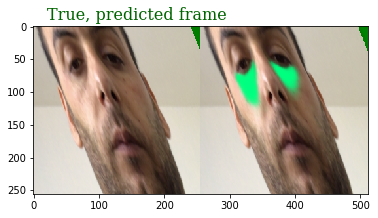

1.0
0.9993007


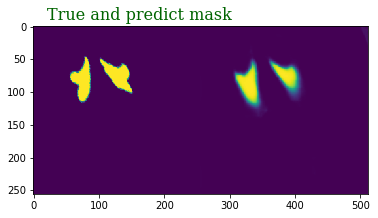

[[[563.1264  609.8137 ]
  [391.88367 403.88092]]]
(391, 563)
(403, 609)
[[[ 9.0114325e-01  1.0347998e-01  4.8122186e+02]
  [-7.5657535e-01  1.9267461e+00  2.5409906e+02]]]
npts
[[[507.71274 481.22186 711.91455]
  [747.34607 254.09906  60.41577]]]
(747, 254, 60, 553)
(507, 481, 711, 737)


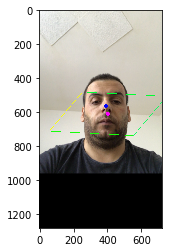

256/256 [==============================] - 55s 217ms/step - loss: 0.1549 - loss_median_loss: 0.0863 - loss_std_loss: 0.0370 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0316 - acc_loss: 0.0000e+00 - alpha_loss: 1.3568e-05 - val_loss: 0.2674 - val_loss_median_loss: 0.0920 - val_loss_std_loss: 0.0502 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1251 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0572e-04
Epoch 40/300
[[537.1557  310.73172]]
probality_gamma: [0.34924957]
noise: [0.33582655]
gamma: [0.41543275]
probaligamma_procentty_gamma: [0.37383363]


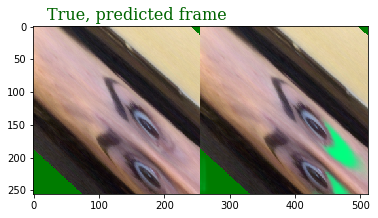

1.0
0.9906404


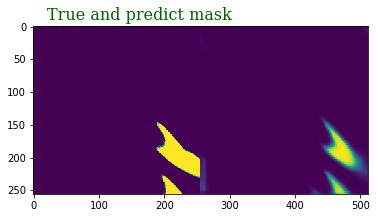

[[[608.3757  537.1557 ]
  [267.88293 310.73172]]]
(267, 608)
(310, 537)
[[[ 4.7881484e-02  6.5302169e-01  4.4744009e+02]
  [-1.7650384e+00  1.6143639e+00  3.3001807e+02]]]
npts
[[[ 614.61365  447.4401   459.69775]
  [ 743.2952   330.01807 -121.83176]]]
(743, 330, -121, 292)
(614, 447, 459, 626)


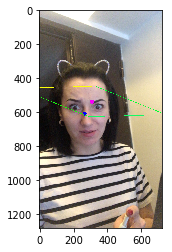

256/256 [==============================] - 56s 218ms/step - loss: 0.1499 - loss_median_loss: 0.0800 - loss_std_loss: 0.0343 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0356 - acc_loss: 0.0000e+00 - alpha_loss: 1.2226e-05 - val_loss: 0.3771 - val_loss_median_loss: 0.0540 - val_loss_std_loss: 0.0621 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2609 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0415e-04
Epoch 41/300
[[594.4486  297.62982]]
probality_gamma: [0.3144803]
noise: [0.42235693]
gamma: [0.41621578]
probaligamma_procentty_gamma: [0.3860615]


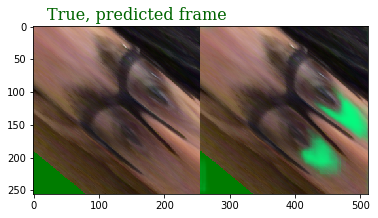

1.0
0.9580292


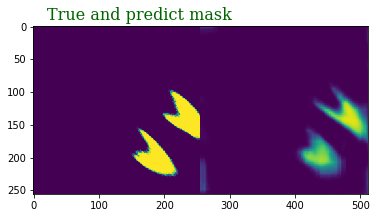

[[[638.65625 594.4486 ]
  [347.0742  297.62982]]]
(347, 638)
(297, 594)
[[[ 1.6707343e-01  4.5170802e-01  5.1524457e+02]
  [-1.7813189e+00  1.4629776e+00  3.3837753e+02]]]
npts
[[[ 630.88184  515.24457  558.0154 ]
  [ 712.8998   338.37753 -117.64011]]]
(712, 338, -117, 257)
(630, 515, 558, 673)


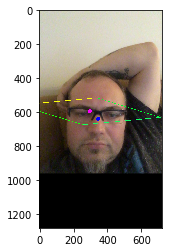

256/256 [==============================] - 56s 218ms/step - loss: 0.1903 - loss_median_loss: 0.0956 - loss_std_loss: 0.0433 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0515 - acc_loss: 0.0000e+00 - alpha_loss: 1.1824e-05 - val_loss: 0.3737 - val_loss_median_loss: 0.1420 - val_loss_std_loss: 0.0565 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1752 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 4.9585e-05
Epoch 42/300
[[546.41376 365.24194]]
probality_gamma: [0.47740608]
noise: [0.38061202]
gamma: [0.44806704]
probaligamma_procentty_gamma: [0.41682604]


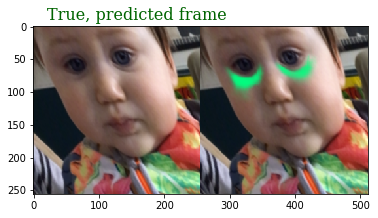

1.0
0.98390675


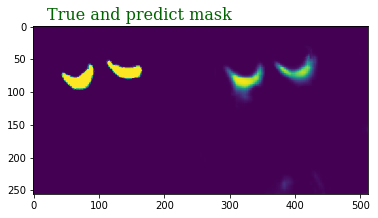

[[[488.28485 546.41376]
  [355.86368 365.24194]]]
(355, 488)
(365, 546)
[[[ 1.0682700e+00  5.8017522e-02  4.0224896e+02]
  [-5.0189245e-01  1.4743845e+00  2.4076297e+02]]]
npts
[[[417.10144 402.24896 675.7261 ]
  [618.20544 240.76297 112.2785 ]]]
(618, 240, 112, 490)
(417, 402, 675, 690)


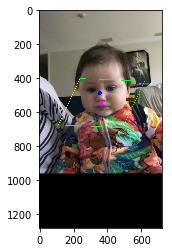

256/256 [==============================] - 56s 217ms/step - loss: 0.1963 - loss_median_loss: 0.1000 - loss_std_loss: 0.0386 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0576 - acc_loss: 0.0000e+00 - alpha_loss: 1.0223e-05 - val_loss: 0.2866 - val_loss_median_loss: 0.0723 - val_loss_std_loss: 0.0552 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1591 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.2598e-05
Epoch 43/300
[[524.63855 399.86905]]
probality_gamma: [0.4127469]
noise: [0.48744416]
gamma: [0.5067318]
probaligamma_procentty_gamma: [0.37294176]


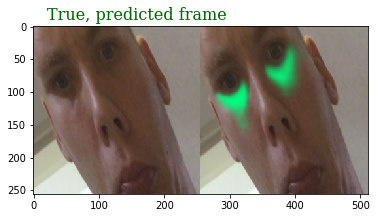

1.0
0.9701269


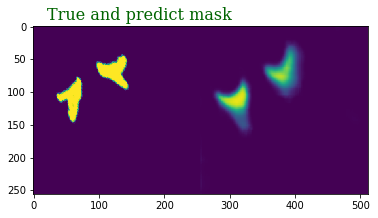

[[[480.6523  524.63855]
  [370.09784 399.86905]]]
(370, 480)
(399, 524)
[[[  0.7557782   0.4049352 376.06726  ]
  [ -0.7671475   1.6648136 284.96777  ]]]
npts
[[[479.73068 376.06726 569.5465 ]
  [711.16003 284.96777  88.57802]]]
(711, 284, 88, 515)
(479, 376, 569, 672)


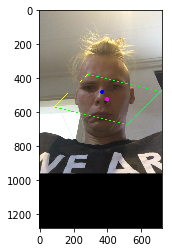

256/256 [==============================] - 56s 217ms/step - loss: 0.1692 - loss_median_loss: 0.1024 - loss_std_loss: 0.0357 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 9.3408e-06 - val_loss: 0.3198 - val_loss_median_loss: 0.1132 - val_loss_std_loss: 0.0545 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1520 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.2173e-05
Epoch 44/300
[[619.97217 264.73062]]
probality_gamma: [0.34938174]
noise: [0.39757004]
gamma: [0.24423471]
probaligamma_procentty_gamma: [0.3768738]


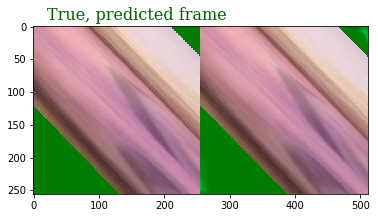

0.0
0.5194307


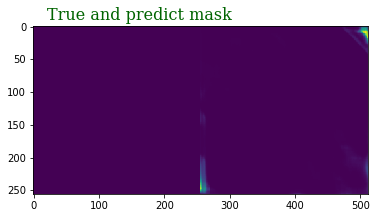

[[[738.8611  619.97217]
  [255.85606 264.73062]]]
(255, 738)
(264, 619)
[[[-7.8737736e-03  3.1779686e-01  5.8030200e+02]
  [-2.1411114e+00  2.1807601e+00  2.5965558e+02]]]
npts
[[[ 661.658    580.302    578.2863 ]
  [ 817.9302   259.65558 -288.46893]]]
(817, 259, -288, 270)
(661, 580, 578, 659)


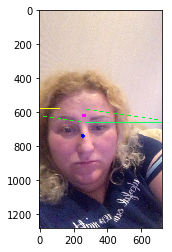

256/256 [==============================] - 56s 217ms/step - loss: 0.1549 - loss_median_loss: 0.0853 - loss_std_loss: 0.0363 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0332 - acc_loss: 0.0000e+00 - alpha_loss: 9.6803e-06 - val_loss: 0.2641 - val_loss_median_loss: 0.1174 - val_loss_std_loss: 0.0521 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0945 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.0142e-05
Epoch 45/300
[[522.05994 376.60593]]
probality_gamma: [0.31299078]
noise: [0.43118882]
gamma: [0.27083537]
probaligamma_procentty_gamma: [0.39027104]


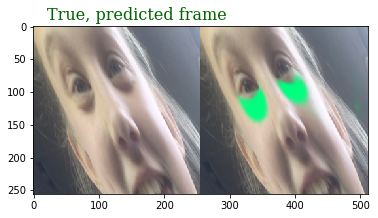

1.0
0.99894816


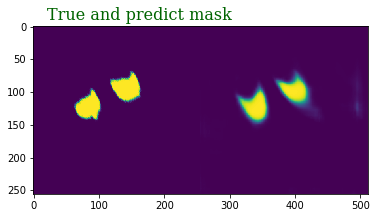

[[[504.7356  522.05994]
  [373.742   376.60593]]]
(373, 504)
(376, 522)
[[[ 6.1382329e-01  3.6632806e-01  3.9660056e+02]
  [-9.0122044e-01  1.7767429e+00  2.6453903e+02]]]
npts
[[[490.38055 396.60056 553.7393 ]
  [719.38525 264.53903  33.8266 ]]]
(719, 264, 33, 488)
(490, 396, 553, 647)


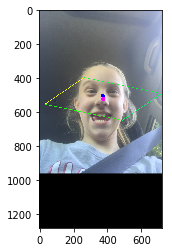

256/256 [==============================] - 56s 218ms/step - loss: 0.1509 - loss_median_loss: 0.0838 - loss_std_loss: 0.0347 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0323 - acc_loss: 0.0000e+00 - alpha_loss: 6.8275e-06 - val_loss: 0.3266 - val_loss_median_loss: 0.1145 - val_loss_std_loss: 0.0533 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1588 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.0444e-05
Epoch 46/300
[[605.5805 352.5973]]
probality_gamma: [0.3071527]
noise: [0.40134445]
gamma: [0.6851346]
probaligamma_procentty_gamma: [0.41013438]


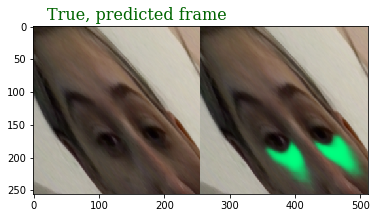

1.0
0.99309397


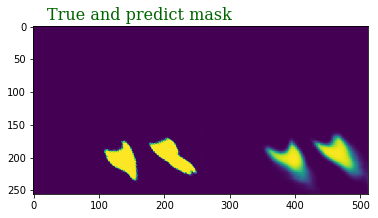

[[[661.8862  605.5805 ]
  [338.42484 352.5973 ]]]
(338, 661)
(352, 605)
[[[ 5.8697063e-01  2.8184572e-01  4.9437201e+02]
  [-1.1853261e+00  1.4754390e+00  3.1546286e+02]]]
npts
[[[566.52454  494.372    644.6365  ]
  [693.17523  315.46286   12.019379]]]
(693, 315, 12, 390)
(566, 494, 644, 716)


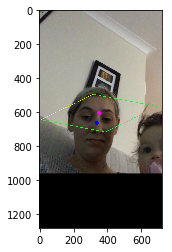

256/256 [==============================] - 56s 218ms/step - loss: 0.1550 - loss_median_loss: 0.0865 - loss_std_loss: 0.0345 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0339 - acc_loss: 0.0000e+00 - alpha_loss: 5.6920e-06 - val_loss: 0.3203 - val_loss_median_loss: 0.0896 - val_loss_std_loss: 0.0505 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1801 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.6850e-05
Epoch 47/300
[[798.05005 271.23572]]
probality_gamma: [0.39263278]
noise: [0.3569888]
gamma: [0.37702233]
probaligamma_procentty_gamma: [0.38402376]


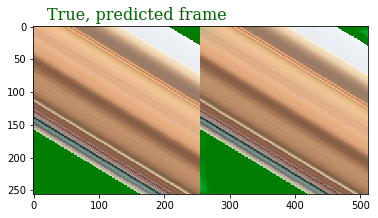

0.0
0.43402898


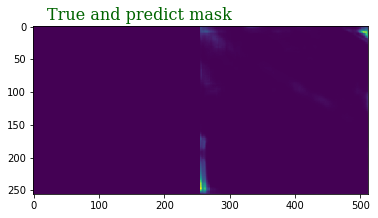

[[[755.3428  798.05005]
  [276.80313 271.23572]]]
(276, 755)
(271, 798)
[[[ 6.7797899e-02 -2.8715372e-02  7.9304749e+02]
  [-2.5446332e+00  1.5371681e+00  4.0019122e+02]]]
npts
[[[ 785.69635  793.0475   810.40375]
  [ 793.7063   400.19122 -251.23486]]]
(793, 400, -251, 142)
(785, 793, 810, 802)


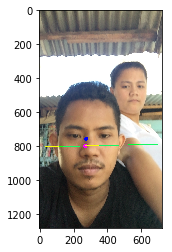

256/256 [==============================] - 56s 218ms/step - loss: 0.1438 - loss_median_loss: 0.0752 - loss_std_loss: 0.0356 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0330 - acc_loss: 0.0000e+00 - alpha_loss: 1.0708e-05 - val_loss: 0.4520 - val_loss_median_loss: 0.0747 - val_loss_std_loss: 0.0511 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.3260 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.8342e-05
Epoch 48/300
[[604.2746  349.67767]]
probality_gamma: [0.32904553]
noise: [0.33214957]
gamma: [0.76710546]
probaligamma_procentty_gamma: [0.40351954]


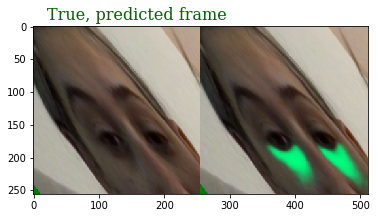

1.0
0.9912698


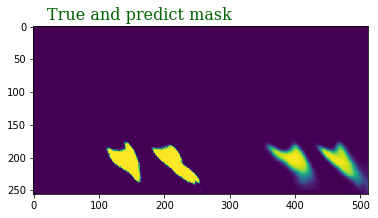

[[[661.8862  604.2746 ]
  [338.42484 349.67767]]]
(338, 661)
(349, 604)
[[[ 5.9704798e-01  1.9692248e-01  5.0264636e+02]
  [-1.2487043e+00  1.6290053e+00  3.0099911e+02]]]
npts
[[[553.05853 502.64636 655.49066]
  [718.0245  300.9991  -18.66919]]]
(718, 300, -18, 400)
(553, 502, 655, 706)


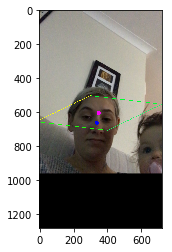

256/256 [==============================] - 56s 217ms/step - loss: 0.1707 - loss_median_loss: 0.0965 - loss_std_loss: 0.0383 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0359 - acc_loss: 0.0000e+00 - alpha_loss: 1.2246e-05 - val_loss: 0.3322 - val_loss_median_loss: 0.0928 - val_loss_std_loss: 0.0510 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1883 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.8463e-05
Epoch 49/300
[[548.1414  340.21097]]
probality_gamma: [0.4469307]
noise: [0.36571747]
gamma: [0.67247957]
probaligamma_procentty_gamma: [0.38392857]


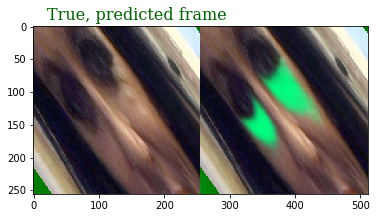

1.0
0.99221015


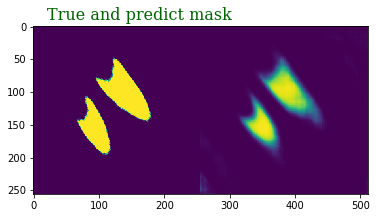

[[[543.73975 548.1414 ]
  [339.4501  340.21097]]]
(339, 543)
(340, 548)
[[[ 3.6476427e-01  4.5474976e-01  4.4324362e+02]
  [-1.2708480e+00  1.7957828e+00  2.7301929e+02]]]
npts
[[[559.65955 443.24362 536.6233 ]
  [732.7397  273.0193  -52.31781]]]
(732, 273, -52, 407)
(559, 443, 536, 652)


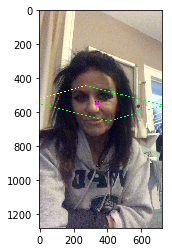

256/256 [==============================] - 56s 217ms/step - loss: 0.1653 - loss_median_loss: 0.0932 - loss_std_loss: 0.0375 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0346 - acc_loss: 0.0000e+00 - alpha_loss: 9.8135e-06 - val_loss: 0.3522 - val_loss_median_loss: 0.1147 - val_loss_std_loss: 0.0458 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1915 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.3183e-05
Epoch 50/300
[[611.89197 336.9881 ]]
probality_gamma: [0.26784188]
noise: [0.46863315]
gamma: [0.35437477]
probaligamma_procentty_gamma: [0.41090262]


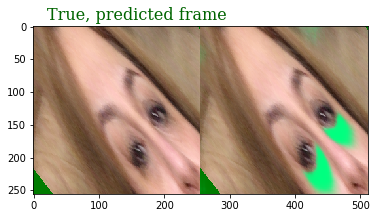

1.0
0.998485


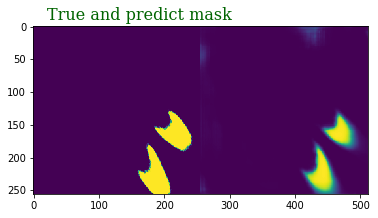

[[[676.1286  611.89197]
  [370.31027 336.9881 ]]]
(370, 676)
(336, 611)
[[[ 5.1535428e-01  3.8253406e-01  4.9696225e+02]
  [-1.3280444e+00  1.7128625e+00  2.8773138e+02]]]
npts
[[[594.891    496.96225  628.89294 ]
  [726.2242   287.73138  -52.247986]]]
(726, 287, -52, 387)
(594, 496, 628, 726)


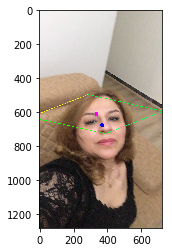

256/256 [==============================] - 56s 218ms/step - loss: 0.1588 - loss_median_loss: 0.0922 - loss_std_loss: 0.0353 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 1.4110e-05 - val_loss: 0.2741 - val_loss_median_loss: 0.0734 - val_loss_std_loss: 0.0490 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1516 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.1118e-04
Epoch 51/300
[[516.0529  437.95877]]
probality_gamma: [0.6190562]
noise: [0.28933144]
gamma: [0.9713795]
probaligamma_procentty_gamma: [0.3864873]


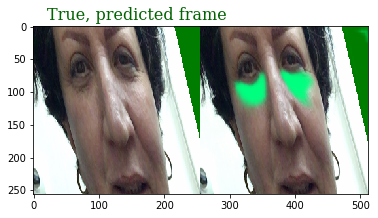

1.0
0.999479


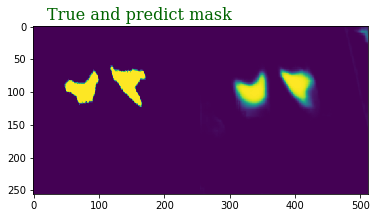

[[[478.4229  516.0529 ]
  [424.6719  437.95877]]]
(424, 478)
(437, 516)
[[[ 9.6068251e-01  8.6234897e-02  3.8204749e+02]
  [-5.4245371e-01  2.3949552e+00  2.0083855e+02]]]
npts
[[[404.12363  382.0475   627.9822  ]
  [813.9471   200.83855   61.970398]]]
(813, 200, 61, 674)
(404, 382, 627, 649)


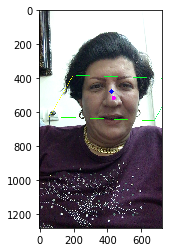

256/256 [==============================] - 56s 217ms/step - loss: 0.1568 - loss_median_loss: 0.0877 - loss_std_loss: 0.0374 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0317 - acc_loss: 0.0000e+00 - alpha_loss: 2.0052e-05 - val_loss: 0.3271 - val_loss_median_loss: 0.0781 - val_loss_std_loss: 0.0426 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2062 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.2400e-04
Epoch 52/300
[[519.5539  365.23425]]
probality_gamma: [0.5922178]
noise: [0.4991382]
gamma: [0.649623]
probaligamma_procentty_gamma: [0.37790135]


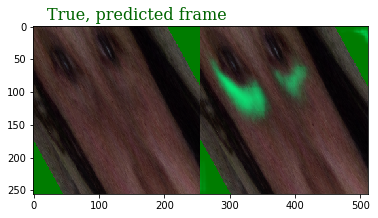

1.0
0.87854165


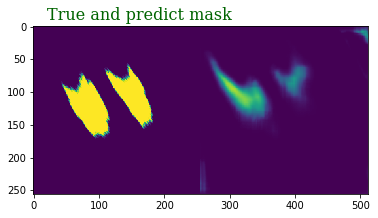

[[[511.62427 519.5539 ]
  [351.61694 365.23425]]]
(351, 511)
(365, 519)
[[[ 3.9829648e-01  2.2960126e-01  4.3918298e+02]
  [-1.3207625e+00  2.3886786e+00  2.2854103e+02]]]
npts
[[[ 497.9609   439.18298  541.14685]
  [ 840.0427   228.54103 -109.57417]]]
(840, 228, -109, 503)
(497, 439, 541, 599)


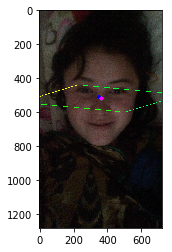

256/256 [==============================] - 56s 218ms/step - loss: 0.2546 - loss_median_loss: 0.1783 - loss_std_loss: 0.0371 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0391 - acc_loss: 0.0000e+00 - alpha_loss: 1.7204e-05 - val_loss: 0.2635 - val_loss_median_loss: 0.0590 - val_loss_std_loss: 0.0443 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1600 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.5225e-05
Epoch 53/300
[[697.129  527.5233]]
probality_gamma: [0.5042536]
noise: [0.3337355]
gamma: [0.63061404]
probaligamma_procentty_gamma: [0.47166404]


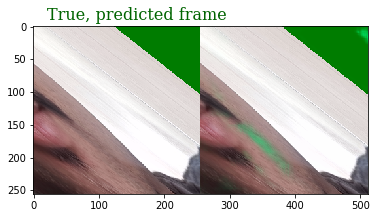

0.0
0.6975029


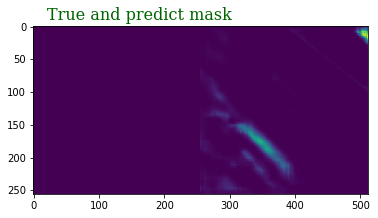

[[[546.599   697.129  ]
  [322.79675 527.5233 ]]]
(322, 546)
(527, 697)
[[[ 5.3517067e-01  9.8983780e-02  6.1595721e+02]
  [-1.5340867e+00  1.2092156e+00  5.6910675e+02]]]
npts
[[[641.29706 615.9572  752.96094]
  [878.66595 569.10675 176.38055]]]
(878, 569, 176, 485)
(641, 615, 752, 778)


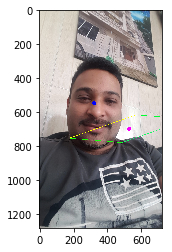

256/256 [==============================] - 56s 217ms/step - loss: 0.2571 - loss_median_loss: 0.1861 - loss_std_loss: 0.0382 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0327 - acc_loss: 0.0000e+00 - alpha_loss: 1.4998e-05 - val_loss: 0.2986 - val_loss_median_loss: 0.2484 - val_loss_std_loss: 0.0470 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0031 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.1201e-05
Epoch 54/300
[[ 48.395523 553.1879  ]]
probality_gamma: [0.60305667]
noise: [0.30860043]
gamma: [1.2735249]
probaligamma_procentty_gamma: [0.41144314]


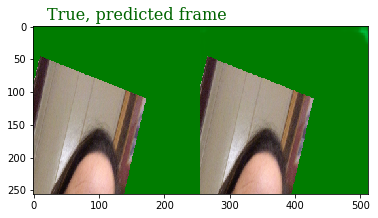

0.0
0.47901607


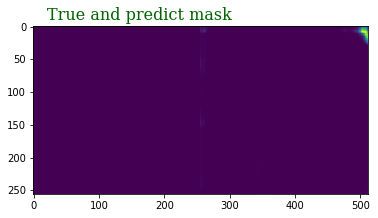

[[[438.77167   48.395523]
  [514.6292   553.1879  ]]]
(514, 438)
(553, 48)
[[[  1.3763353  -0.5431423 -58.25318  ]
  [  0.9407195   4.0377264 -84.05319  ]]]
npts
[[[-197.2976   -58.25318  294.08865]
  [ 949.60474  -84.05319  156.771  ]]]
(949, -84, 156, 1021)
(-197, -58, 294, 433)


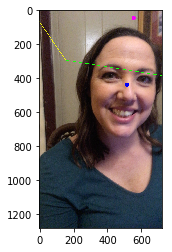

256/256 [==============================] - 56s 218ms/step - loss: 0.1743 - loss_median_loss: 0.1094 - loss_std_loss: 0.0350 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0299 - acc_loss: 0.0000e+00 - alpha_loss: 9.7928e-06 - val_loss: 0.2943 - val_loss_median_loss: 0.1035 - val_loss_std_loss: 0.0482 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1425 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.1120e-05
Epoch 55/300
[[531.8569 432.9371]]
probality_gamma: [0.3326342]
noise: [0.32648373]
gamma: [0.34966934]
probaligamma_procentty_gamma: [0.3875881]


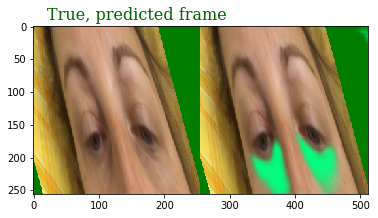

1.0
0.9833356


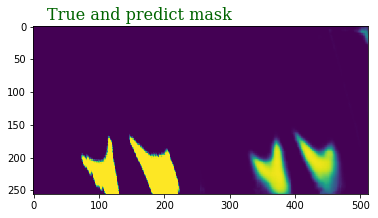

[[[607.397   531.8569 ]
  [442.62842 432.9371 ]]]
(442, 607)
(432, 531)
[[[ 7.2782606e-01  2.2547841e-02  4.3580902e+02]
  [-7.8804821e-01  2.9357760e+00  1.5802792e+02]]]
npts
[[[441.58127  435.80902  622.1325  ]
  [909.58655  158.02792  -43.712418]]]
(909, 158, -43, 708)
(441, 435, 622, 628)


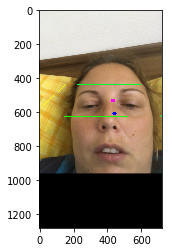

256/256 [==============================] - 56s 220ms/step - loss: 0.1546 - loss_median_loss: 0.0884 - loss_std_loss: 0.0370 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0292 - acc_loss: 0.0000e+00 - alpha_loss: 1.1613e-05 - val_loss: 0.3034 - val_loss_median_loss: 0.1003 - val_loss_std_loss: 0.0500 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1531 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.4380e-05
Epoch 56/300
[[521.78674 351.19318]]
probality_gamma: [0.27919465]
noise: [0.3612899]
gamma: [0.42826813]
probaligamma_procentty_gamma: [0.41202646]


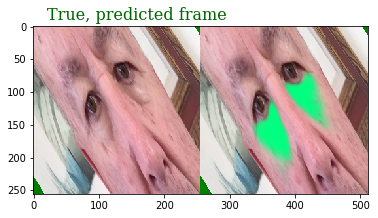

1.0
0.9995683


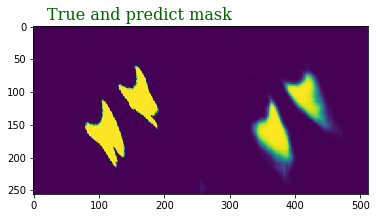

[[[531.50757 521.78674]
  [355.48083 351.19318]]]
(355, 531)
(351, 521)
[[[  0.44917542   0.5175816  398.04187   ]
  [ -1.1273075    1.8670022  256.51227   ]]]
npts
[[[530.5427  398.04187 513.03076]
  [734.46484 256.51227 -32.07846]]]
(734, 256, -32, 446)
(530, 398, 513, 645)


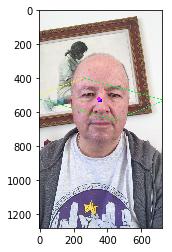

256/256 [==============================] - 56s 220ms/step - loss: 0.1523 - loss_median_loss: 0.0820 - loss_std_loss: 0.0371 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0332 - acc_loss: 0.0000e+00 - alpha_loss: 8.6521e-06 - val_loss: 0.3246 - val_loss_median_loss: 0.0784 - val_loss_std_loss: 0.0530 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1931 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.6003e-05
Epoch 57/300
[[525.16815 406.89322]]
probality_gamma: [0.605906]
noise: [0.32501012]
gamma: [0.8306876]
probaligamma_procentty_gamma: [0.3997887]


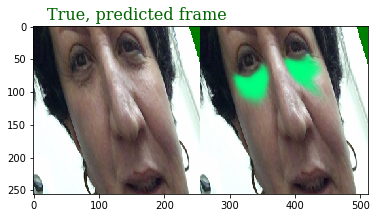

1.0
0.9968207


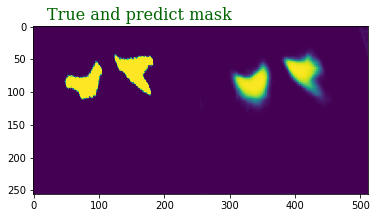

[[[478.4229  525.16815]
  [424.6719  406.89322]]]
(424, 478)
(406, 525)
[[[ 8.7800384e-01  1.7169401e-01  3.9080679e+02]
  [-6.2353492e-01  2.0970728e+00  2.1828036e+02]]]
npts
[[[434.76047  390.8068   615.5758  ]
  [755.131    218.28036   58.655426]]]
(755, 218, 58, 595)
(434, 390, 615, 659)


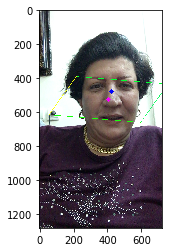

256/256 [==============================] - 56s 219ms/step - loss: 0.1515 - loss_median_loss: 0.0783 - loss_std_loss: 0.0383 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0349 - acc_loss: 0.0000e+00 - alpha_loss: 8.2513e-06 - val_loss: 0.2920 - val_loss_median_loss: 0.0824 - val_loss_std_loss: 0.0458 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1637 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.0487e-05
Epoch 58/300
[[613.07715 358.28772]]
probality_gamma: [0.31061763]
noise: [0.3626818]
gamma: [0.661309]
probaligamma_procentty_gamma: [0.4068786]


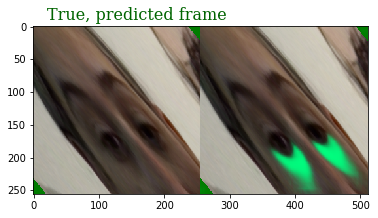

1.0
0.9863659


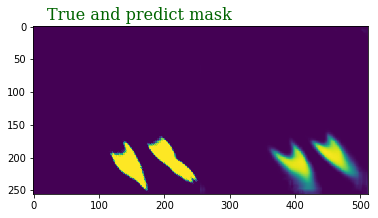

[[[661.8862  613.07715]
  [338.42484 358.28772]]]
(338, 661)
(358, 613)
[[[ 3.9625454e-01  3.3275384e-01  5.1976404e+02]
  [-1.3698208e+00  1.6881173e+00  3.1754578e+02]]]
npts
[[[604.94904  519.76404  621.2052  ]
  [749.7038   317.54578  -33.128357]]]
(749, 317, -33, 399)
(604, 519, 621, 706)


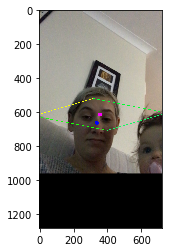

256/256 [==============================] - 56s 219ms/step - loss: 0.1459 - loss_median_loss: 0.0814 - loss_std_loss: 0.0325 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0320 - acc_loss: 0.0000e+00 - alpha_loss: 8.0568e-06 - val_loss: 0.2602 - val_loss_median_loss: 0.1157 - val_loss_std_loss: 0.0473 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0971 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.1855e-05
Epoch 59/300
[[211.06105 339.81754]]
probality_gamma: [0.5718241]
noise: [0.4285224]
gamma: [0.672762]
probaligamma_procentty_gamma: [0.40048936]


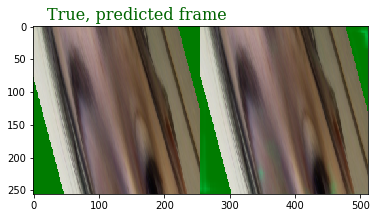

0.0
0.43384865


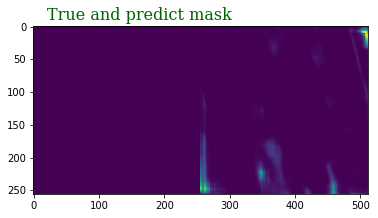

[[[312.8985  211.06105]
  [299.31894 339.81754]]]
(299, 312)
(339, 211)
[[[ 0.1149013   0.76040804 99.02145   ]
  [-0.7850878   2.9678276  60.426865  ]]]
npts
[[[ 293.6859     99.02145   128.43619 ]
  [ 820.19073    60.426865 -140.55562 ]]]
(820, 60, -140, 620)
(293, 99, 128, 322)


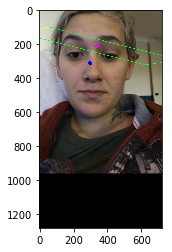

256/256 [==============================] - 56s 218ms/step - loss: 0.1481 - loss_median_loss: 0.0776 - loss_std_loss: 0.0363 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0342 - acc_loss: 0.0000e+00 - alpha_loss: 1.4193e-05 - val_loss: 0.3928 - val_loss_median_loss: 0.0889 - val_loss_std_loss: 0.0503 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2534 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.6499e-05
Epoch 60/300
[[677.6186  380.59094]]
probality_gamma: [0.44446477]
noise: [0.47412524]
gamma: [0.82867813]
probaligamma_procentty_gamma: [0.5175922]


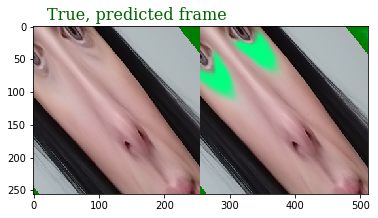

1.0
0.9963869


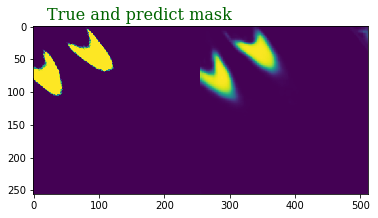

[[[625.1375  677.6186 ]
  [353.95264 380.59094]]]
(353, 625)
(380, 677)
[[[ 5.7445538e-01  1.7900805e-01  5.8117529e+02]
  [-1.3822947e+00  1.7188993e+00  3.3750555e+02]]]
npts
[[[627.00134  581.1753   728.23584 ]
  [777.54376  337.50555  -16.361877]]]
(777, 337, -16, 424)
(627, 581, 728, 774)


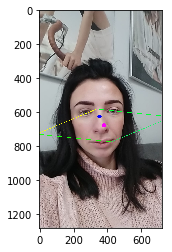

256/256 [==============================] - 56s 219ms/step - loss: 0.1888 - loss_median_loss: 0.1046 - loss_std_loss: 0.0393 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0449 - acc_loss: 0.0000e+00 - alpha_loss: 1.3967e-05 - val_loss: 0.3453 - val_loss_median_loss: 0.0777 - val_loss_std_loss: 0.0530 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2145 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.5897e-05
Epoch 61/300
[[416.62817 319.3751 ]]
probality_gamma: [0.38911843]
noise: [0.3883412]
gamma: [0.63127565]
probaligamma_procentty_gamma: [0.38506672]


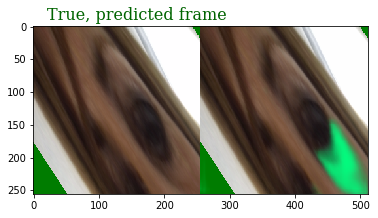

1.0
0.96993893


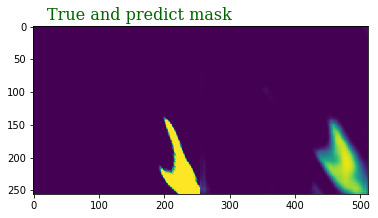

[[[505.90552 416.62817]
  [311.73782 319.3751 ]]]
(311, 505)
(319, 416)
[[[ 2.4673522e-01  5.4100263e-01  3.1579770e+02]
  [-1.3134925e+00  1.9996297e+00  2.3154953e+02]]]
npts
[[[ 454.29437  315.7977   378.9619 ]
  [ 743.4547   231.54953 -104.70456]]]
(743, 231, -104, 408)
(454, 315, 378, 517)


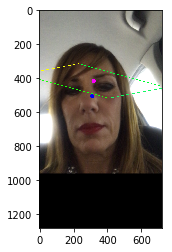

256/256 [==============================] - 56s 219ms/step - loss: 0.1627 - loss_median_loss: 0.0926 - loss_std_loss: 0.0389 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 9.9350e-06 - val_loss: 0.2282 - val_loss_median_loss: 0.1693 - val_loss_std_loss: 0.0564 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0024 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 8.1911e-05
Epoch 62/300
[[296.6058  346.78644]]
probality_gamma: [0.54197216]
noise: [0.36558485]
gamma: [0.5222906]
probaligamma_procentty_gamma: [0.41411245]


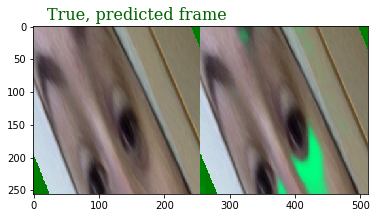

1.0
0.9878187


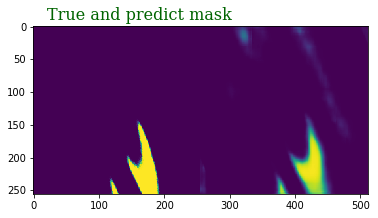

[[[350.10297 296.6058 ]
  [265.23184 346.78644]]]
(265, 350)
(346, 296)
[[[  0.28278214   0.45800492 201.78503   ]
  [ -0.92105484   2.2336903  178.76909   ]]]
npts
[[[319.0343  201.78503 274.17725]
  [750.5938  178.76909 -57.02095]]]
(750, 178, -57, 515)
(319, 201, 274, 392)


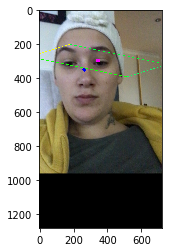

256/256 [==============================] - 56s 219ms/step - loss: 0.1607 - loss_median_loss: 0.0904 - loss_std_loss: 0.0387 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0315 - acc_loss: 0.0000e+00 - alpha_loss: 1.1138e-05 - val_loss: 0.2473 - val_loss_median_loss: 0.1386 - val_loss_std_loss: 0.0553 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0533 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.5745e-05
Epoch 63/300
[[378.12048 269.8668 ]]
probality_gamma: [0.46390465]
noise: [0.4009305]
gamma: [0.7182596]
probaligamma_procentty_gamma: [0.3852635]


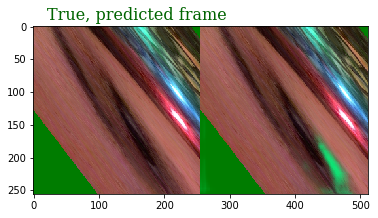

1.0
0.861454


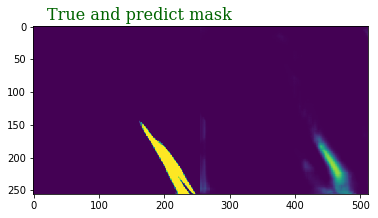

[[[475.6113  378.12048]
  [193.45126 269.8668 ]]]
(193, 475)
(269, 378)
[[[-9.6966028e-02  7.1596789e-01  2.9888824e+02]
  [-1.6254878e+00  2.1200631e+00  2.0656116e+02]]]
npts
[[[ 482.17603  298.88824  274.06494]
  [ 749.2973   206.56116 -209.56372]]]
(749, 206, -209, 334)
(482, 298, 274, 458)


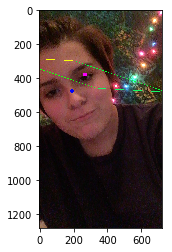

256/256 [==============================] - 56s 219ms/step - loss: 0.1440 - loss_median_loss: 0.0812 - loss_std_loss: 0.0328 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0301 - acc_loss: 0.0000e+00 - alpha_loss: 1.2995e-05 - val_loss: 0.2865 - val_loss_median_loss: 0.1007 - val_loss_std_loss: 0.0541 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1316 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 9.5813e-05
Epoch 64/300
[[440.9376  371.65607]]
probality_gamma: [0.270786]
noise: [0.33258018]
gamma: [0.37608266]
probaligamma_procentty_gamma: [0.41614404]


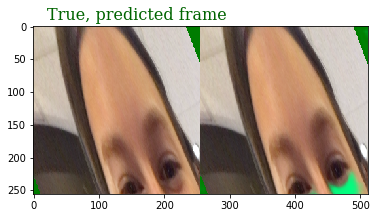

1.0
0.99022406


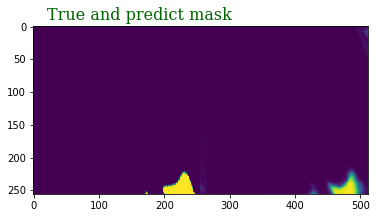

[[[556.5004  440.9376 ]
  [399.86194 371.65607]]]
(399, 556)
(371, 440)
[[[ 6.3562846e-01  2.7673200e-01  3.2415543e+02]
  [-8.5730010e-01  2.2419014e+00  1.9442711e+02]]]
npts
[[[394.9988   324.15543  486.8763  ]
  [768.3539   194.42711  -25.041718]]]
(768, 194, -25, 549)
(394, 324, 486, 556)


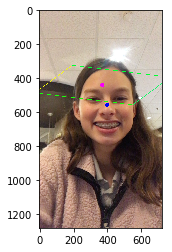

256/256 [==============================] - 57s 222ms/step - loss: 0.1434 - loss_median_loss: 0.0737 - loss_std_loss: 0.0353 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0344 - acc_loss: 0.0000e+00 - alpha_loss: 1.5115e-05 - val_loss: 0.3055 - val_loss_median_loss: 0.0985 - val_loss_std_loss: 0.0573 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1496 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.1165e-05
Epoch 65/300
[[861.05884 263.2995 ]]
probality_gamma: [0.42973587]
noise: [0.33136377]
gamma: [0.4162786]
probaligamma_procentty_gamma: [0.38727126]


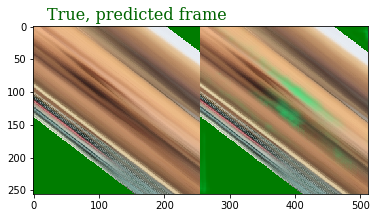

0.0
0.59414524


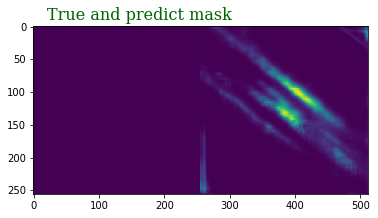

[[[755.3428  861.05884]
  [276.80313 263.2995 ]]]
(276, 755)
(263, 861)
[[[ 3.2347798e-02  1.2155682e-01  8.4135895e+02]
  [-2.4541106e+00  1.8618211e+00  3.3911255e+02]]]
npts
[[[ 872.4775   841.35895  849.64   ]
  [ 815.7388   339.11255 -289.13977]]]
(815, 339, -289, 187)
(872, 841, 849, 880)


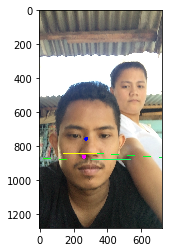

256/256 [==============================] - 56s 220ms/step - loss: 0.1517 - loss_median_loss: 0.0830 - loss_std_loss: 0.0345 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0342 - acc_loss: 0.0000e+00 - alpha_loss: 1.3868e-05 - val_loss: 0.4949 - val_loss_median_loss: 0.1490 - val_loss_std_loss: 0.0556 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2902 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.8929e-05
Epoch 66/300
[[448.6354  238.07434]]
probality_gamma: [0.39504176]
noise: [0.34377915]
gamma: [0.32607004]
probaligamma_procentty_gamma: [0.3932877]


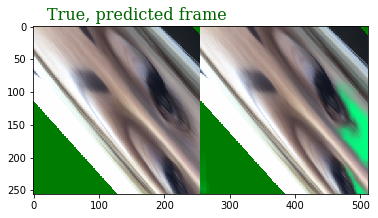

1.0
0.9952991


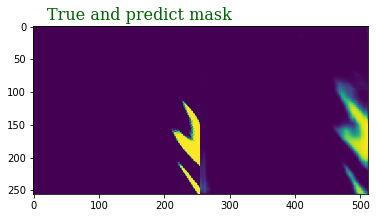

[[[548.2867  448.6354 ]
  [290.05334 238.07434]]]
(290, 548)
(238, 448)
[[[-2.2926080e-01  8.6535960e-01  3.6721475e+02]
  [-1.8761680e+00  2.0774732e+00  2.1230728e+02]]]
npts
[[[ 588.7468   367.21475  308.524  ]
  [ 744.1404   212.30728 -267.99173]]]
(744, 212, -267, 265)
(588, 367, 308, 529)


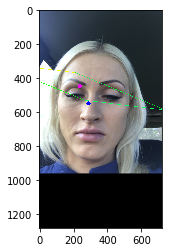

256/256 [==============================] - 57s 222ms/step - loss: 0.1984 - loss_median_loss: 0.1152 - loss_std_loss: 0.0440 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0393 - acc_loss: 0.0000e+00 - alpha_loss: 1.4239e-05 - val_loss: 0.3864 - val_loss_median_loss: 0.0903 - val_loss_std_loss: 0.0535 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2426 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 5.5071e-05
Epoch 67/300
[[721.78925 413.50995]]
probality_gamma: [0.39616674]
noise: [0.39387864]
gamma: [0.49540466]
probaligamma_procentty_gamma: [0.50714815]


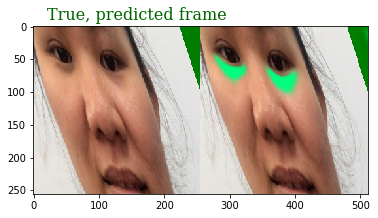

1.0
0.9980477


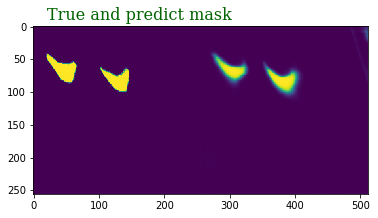

[[[676.8799  721.78925]
  [357.36725 413.50995]]]
(357, 676)
(413, 721)
[[[ 9.01320219e-01 -1.03304416e-01  6.19643250e+02]
  [-7.12936163e-01  2.22586489e+00  2.19855042e+02]]]
npts
[[[593.1973   619.64325  850.3812  ]
  [789.67645  219.85504   37.343384]]]
(789, 219, 37, 607)
(593, 619, 850, 824)


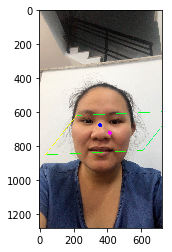

256/256 [==============================] - 58s 225ms/step - loss: 0.1575 - loss_median_loss: 0.0899 - loss_std_loss: 0.0381 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0295 - acc_loss: 0.0000e+00 - alpha_loss: 1.0321e-05 - val_loss: 0.2540 - val_loss_median_loss: 0.1452 - val_loss_std_loss: 0.0536 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0551 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.5862e-05
Epoch 68/300
[[590.8243  290.74908]]
probality_gamma: [0.48647946]
noise: [0.4058974]
gamma: [0.7397002]
probaligamma_procentty_gamma: [0.39275485]


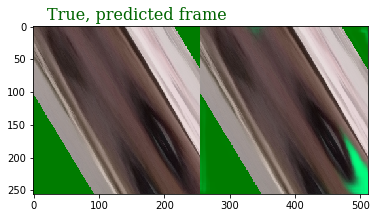

1.0
0.98886603


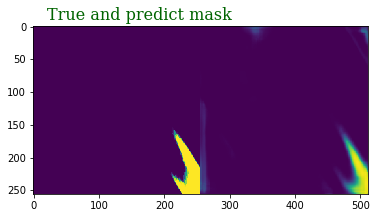

[[[671.6427  590.8243 ]
  [301.2274  290.74908]]]
(301, 671)
(290, 590)
[[[ 8.6093128e-02  4.4332263e-01  5.2305908e+02]
  [-1.5703651e+00  2.5821533e+00  1.6124016e+02]]]
npts
[[[ 636.5497   523.0591   545.09894]
  [ 822.2714   161.24016 -240.7733 ]]]
(822, 161, -240, 421)
(636, 523, 545, 658)


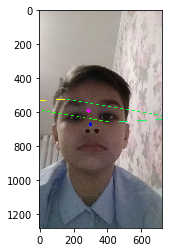

256/256 [==============================] - 58s 226ms/step - loss: 0.1475 - loss_median_loss: 0.0856 - loss_std_loss: 0.0349 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0270 - acc_loss: 0.0000e+00 - alpha_loss: 1.1205e-05 - val_loss: 0.2616 - val_loss_median_loss: 0.1214 - val_loss_std_loss: 0.0609 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0792 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 5.2144e-05
Epoch 69/300
[[665.2544 336.4999]]
probality_gamma: [0.32872868]
noise: [0.33475837]
gamma: [0.4680683]
probaligamma_procentty_gamma: [0.3823321]


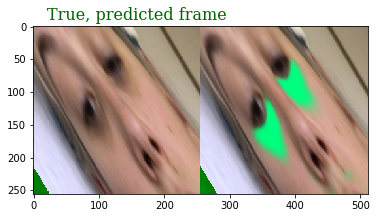

1.0
0.99916613


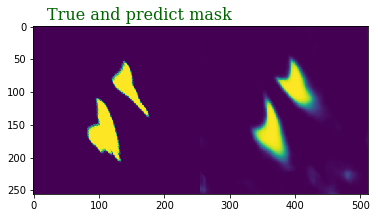

[[[668.4969  665.2544 ]
  [317.65173 336.4999 ]]]
(317, 668)
(336, 665)
[[[ 6.0306871e-01  1.9119905e-01  5.6358813e+02]
  [-1.1281925e+00  1.8740282e+00  2.4103293e+02]]]
npts
[[[612.5351   563.58813  717.97375 ]
  [720.7842   241.03293  -47.784363]]]
(720, 241, -47, 432)
(612, 563, 717, 766)


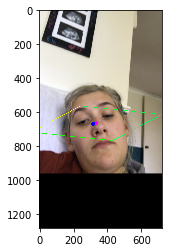

256/256 [==============================] - 57s 221ms/step - loss: 0.1442 - loss_median_loss: 0.0811 - loss_std_loss: 0.0349 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0281 - acc_loss: 0.0000e+00 - alpha_loss: 1.1390e-05 - val_loss: 0.3344 - val_loss_median_loss: 0.0981 - val_loss_std_loss: 0.0550 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1812 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 5.3906e-05
Epoch 70/300
[[538.7155 336.2251]]
probality_gamma: [0.39718777]
noise: [0.34605867]
gamma: [0.42390278]
probaligamma_procentty_gamma: [0.44214928]


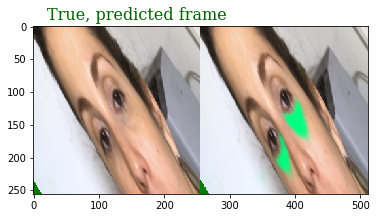

1.0
0.9988611


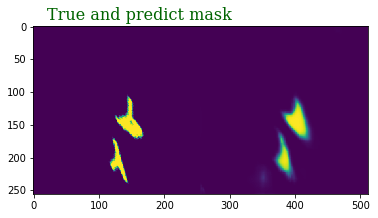

[[[560.3485 538.7155]
  [320.174  336.2251]]]
(320, 560)
(336, 538)
[[[ 3.7767553e-01  4.9533838e-01  4.2696973e+02]
  [-1.0131330e+00  1.7923719e+00  2.3648254e+02]]]
npts
[[[553.77637  426.96973  523.65466 ]
  [695.3297   236.48254  -22.879517]]]
(695, 236, -22, 437)
(553, 426, 523, 650)


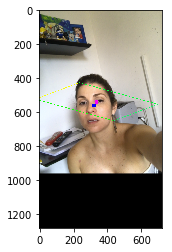

256/256 [==============================] - 57s 221ms/step - loss: 0.1463 - loss_median_loss: 0.0762 - loss_std_loss: 0.0344 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0356 - acc_loss: 0.0000e+00 - alpha_loss: 9.1063e-06 - val_loss: 0.2521 - val_loss_median_loss: 0.0810 - val_loss_std_loss: 0.0562 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1148 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 4.4945e-05
Epoch 71/300
[[429.38205 433.6285 ]]
probality_gamma: [0.3926463]
noise: [0.39346504]
gamma: [0.13895291]
probaligamma_procentty_gamma: [0.39404142]


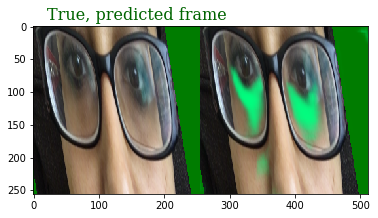

1.0
0.99064285


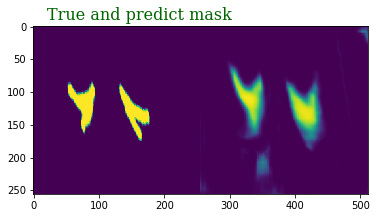

[[[424.58444 429.38205]
  [395.1558  433.6285 ]]]
(395, 424)
(433, 429)
[[[ 7.4983907e-01  1.7435038e-01  3.1108575e+02]
  [-4.8721880e-01  3.0427563e+00  1.0651966e+02]]]
npts
[[[355.71945  311.08575  503.04456 ]
  [885.4653   106.51966  -18.208351]]]
(885, 106, -18, 761)
(355, 311, 503, 547)


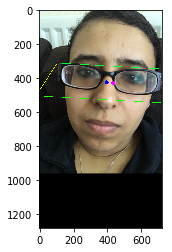

256/256 [==============================] - 57s 221ms/step - loss: 0.1449 - loss_median_loss: 0.0785 - loss_std_loss: 0.0353 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0311 - acc_loss: 0.0000e+00 - alpha_loss: 9.4572e-06 - val_loss: 0.2830 - val_loss_median_loss: 0.0901 - val_loss_std_loss: 0.0548 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1381 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 4.9808e-05
Epoch 72/300
[[514.2102  300.59747]]
probality_gamma: [0.31653225]
noise: [0.4003036]
gamma: [0.37525427]
probaligamma_procentty_gamma: [0.3865321]


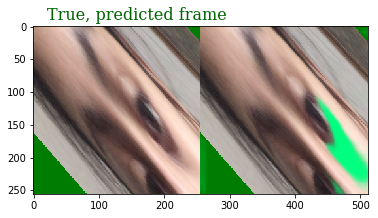

1.0
0.9995328


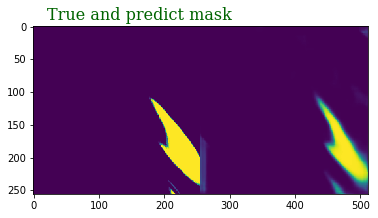

[[[583.21124 514.2102 ]
  [298.24918 300.59747]]]
(298, 583)
(300, 514)
[[[-3.3749461e-02  6.5833199e-01  4.3426367e+02]
  [-1.6663222e+00  1.9057190e+00  2.6995468e+02]]]
npts
[[[ 602.79663  434.26367  425.6238 ]
  [ 757.8187   269.95468 -156.62381]]]
(757, 269, -156, 332)
(602, 434, 425, 593)


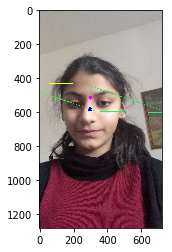

256/256 [==============================] - 57s 223ms/step - loss: 0.1569 - loss_median_loss: 0.0790 - loss_std_loss: 0.0405 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0374 - acc_loss: 0.0000e+00 - alpha_loss: 1.0277e-05 - val_loss: 0.2986 - val_loss_median_loss: 0.0906 - val_loss_std_loss: 0.0506 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1573 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.2022e-05
Epoch 73/300
[[548.5162 367.3835]]
probality_gamma: [0.34904304]
noise: [0.38711023]
gamma: [0.17661892]
probaligamma_procentty_gamma: [0.37828827]


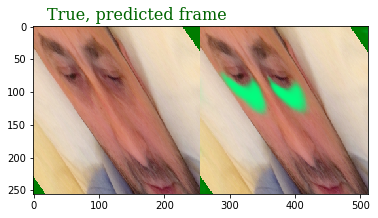

1.0
0.987909


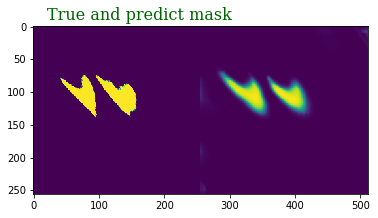

[[[529.7037  548.5162 ]
  [361.43594 367.3835 ]]]
(361, 529)
(367, 548)
[[[ 5.2407956e-01  3.3023918e-01  4.3916336e+02]
  [-1.2923148e+00  1.8510571e+00  2.9586450e+02]]]
npts
[[[523.7046  439.16336 573.32776]
  [769.7351  295.8645  -34.96808]]]
(769, 295, -34, 440)
(523, 439, 573, 657)


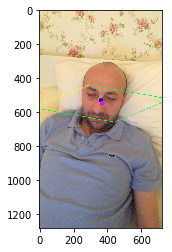

256/256 [==============================] - 57s 221ms/step - loss: 0.1637 - loss_median_loss: 0.0837 - loss_std_loss: 0.0427 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0373 - acc_loss: 0.0000e+00 - alpha_loss: 9.8894e-06 - val_loss: 0.3041 - val_loss_median_loss: 0.1378 - val_loss_std_loss: 0.0571 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1092 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.5145e-05
Epoch 74/300
[[574.54565 351.03723]]
probality_gamma: [0.46021038]
noise: [0.37923673]
gamma: [0.9338283]
probaligamma_procentty_gamma: [0.43193763]


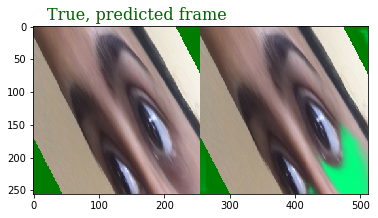

1.0
0.9955545


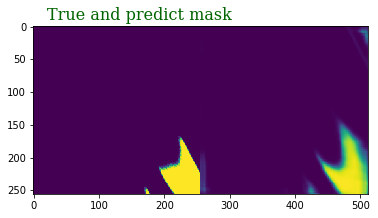

[[[663.7616  574.54565]
  [386.798   351.03723]]]
(386, 663)
(351, 574)
[[[ 4.8415530e-01  1.6799355e-01  4.9107059e+02]
  [-1.2215301e+00  2.3453617e+00  2.0718677e+02]]]
npts
[[[ 534.0769   491.0706   615.01434]
  [ 807.59937  207.18677 -105.52493]]]
(807, 207, -105, 495)
(534, 491, 615, 658)


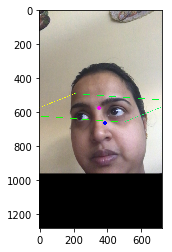

256/256 [==============================] - 57s 223ms/step - loss: 0.1569 - loss_median_loss: 0.0852 - loss_std_loss: 0.0391 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0326 - acc_loss: 0.0000e+00 - alpha_loss: 9.1800e-06 - val_loss: 0.3046 - val_loss_median_loss: 0.0949 - val_loss_std_loss: 0.0541 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1555 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 4.3668e-05
Epoch 75/300
[[712.5976  363.70282]]
probality_gamma: [0.3507512]
noise: [0.38296026]
gamma: [0.48803422]
probaligamma_procentty_gamma: [0.41136697]


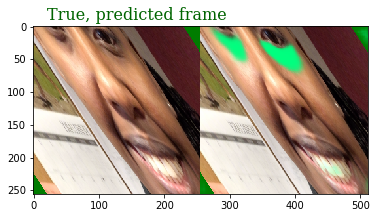

1.0
0.999731


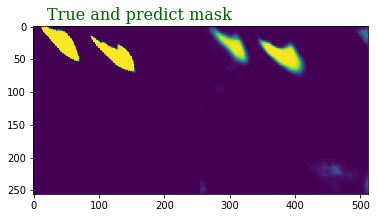

[[[641.65643 712.5976 ]
  [397.31937 363.70282]]]
(397, 641)
(363, 712)
[[[ 8.6860913e-01 -2.5425023e-01  6.3395966e+02]
  [-1.2321134e+00  1.9269524e+00  2.7476340e+02]]]
npts
[[[568.8716   633.95966  856.3236  ]
  [768.06323  274.7634   -40.657623]]]
(768, 274, -40, 454)
(568, 633, 856, 791)


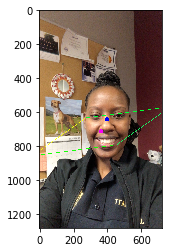

256/256 [==============================] - 57s 221ms/step - loss: 0.1535 - loss_median_loss: 0.0791 - loss_std_loss: 0.0377 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0367 - acc_loss: 0.0000e+00 - alpha_loss: 9.9909e-06 - val_loss: 0.2516 - val_loss_median_loss: 0.0724 - val_loss_std_loss: 0.0584 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1207 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 6.0622e-05
Epoch 76/300
[[490.36453 322.62076]]
probality_gamma: [0.31557146]
noise: [0.36594176]
gamma: [0.35426086]
probaligamma_procentty_gamma: [0.37653485]


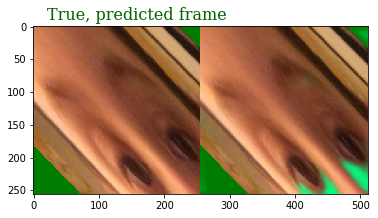

1.0
0.98029226


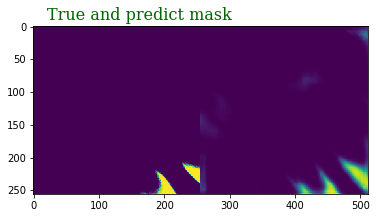

[[[574.4634  490.36453]
  [313.06418 322.62076]]]
(313, 574)
(322, 490)
[[[ 2.1340036e-01  4.8938295e-01  4.0040826e+02]
  [-1.7509263e+00  1.7883849e+00  3.1782605e+02]]]
npts
[[[ 525.6903   400.40826  455.03876]
  [ 775.6526   317.82605 -130.41107]]]
(775, 317, -130, 328)
(525, 400, 455, 580)


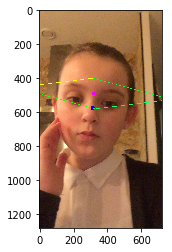

256/256 [==============================] - 57s 223ms/step - loss: 0.1572 - loss_median_loss: 0.0884 - loss_std_loss: 0.0328 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0360 - acc_loss: 0.0000e+00 - alpha_loss: 1.7064e-05 - val_loss: 0.3406 - val_loss_median_loss: 0.1098 - val_loss_std_loss: 0.0529 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1779 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.0472e-04
Epoch 77/300
[[524.06335 356.80844]]
probality_gamma: [0.35057658]
noise: [0.40277383]
gamma: [0.16428722]
probaligamma_procentty_gamma: [0.36761707]


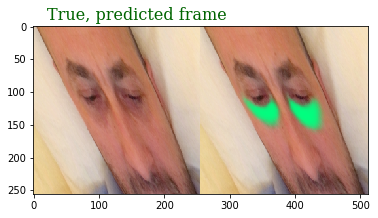

1.0
0.99252677


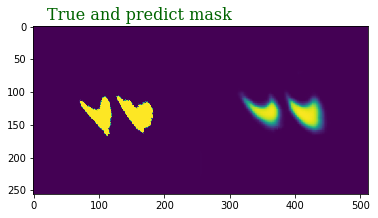

[[[529.7037  524.06335]
  [361.43594 356.80844]]]
(361, 529)
(356, 524)
[[[ 6.2099862e-01  3.6263320e-01  3.9815860e+02]
  [-9.5599532e-01  1.7549402e+00  2.5454349e+02]]]
npts
[[[490.9927   398.1586   557.1343  ]
  [703.80817  254.54349    9.808685]]]
(703, 254, 9, 458)
(490, 398, 557, 649)


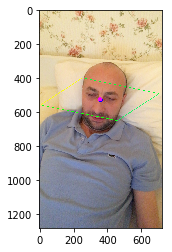

256/256 [==============================] - 56s 219ms/step - loss: 0.1523 - loss_median_loss: 0.0761 - loss_std_loss: 0.0403 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0359 - acc_loss: 0.0000e+00 - alpha_loss: 1.9333e-05 - val_loss: 0.2752 - val_loss_median_loss: 0.0809 - val_loss_std_loss: 0.0566 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1376 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 7.7609e-05
Epoch 78/300
[[696.7153  402.45782]]
probality_gamma: [0.5139433]
noise: [0.3874973]
gamma: [0.972369]
probaligamma_procentty_gamma: [0.40142474]


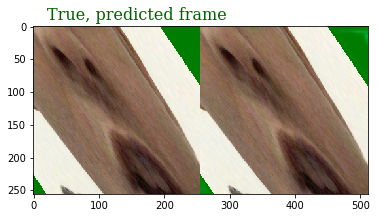

0.0
0.39784166


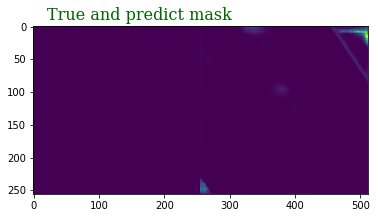

[[[584.5444  696.7153 ]
  [359.7902  402.45782]]]
(359, 584)
(402, 696)
[[[ 7.0123440e-01 -2.2164112e-01  6.3532733e+02]
  [-1.4067829e+00  2.0654984e+00  3.1814224e+02]]]
npts
[[[578.5872  635.32733 814.8433 ]
  [846.9098  318.14224 -41.99417]]]
(846, 318, -41, 487)
(578, 635, 814, 757)


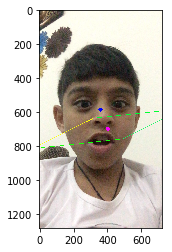

 85/256 [========>.....................] - ETA: 1:01 - loss: 0.1520 - loss_median_loss: 0.0890 - loss_std_loss: 0.0269 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0361 - acc_loss: 0.0000e+00 - alpha_loss: 2.0335e-05

KeyboardInterrupt: 

In [261]:
fixed_result = model.fit_generator(data_generator_single,validation_data = ([x_val, y_val], [mmm,mmm,mmm,mmm,mmm,mmm]), epochs=300, steps_per_epoch = 256, callbacks = [callbackshow])


In [ ]:
fixed_result = model.fit_generator(data_generator_single,validation_data = ([x_val, y_val], [mmm]*6), epochs=300, steps_per_epoch = 256, callbacks = [callbackshow])


In [ ]:
fixed_result = model.fit_generator(data_generator_single,validation_data = ([x_val, y_val], [mmm]*6), epochs=300, steps_per_epoch = 256, callbacks = [callbackshow])


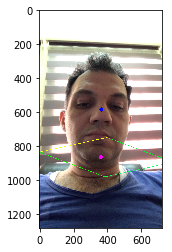

256/256 [==============================] - 59s 231ms/step - loss: 0.1223 - loss_median_loss: 0.0575 - loss_std_loss: 0.0383 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0265 - acc_loss: 0.0000e+00 - alpha_loss: 1.1991e-05 - val_loss: 0.1336 - val_loss_median_loss: 0.0659 - val_loss_std_loss: 0.0509 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.0165 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 2.6558e-04
Epoch 293/300
[[690.10046 408.14636]]
probality_gamma: [0.57675123]
noise: [0.51590455]
gamma: [0.53837216]
probaligamma_procentty_gamma: [0.37027907]


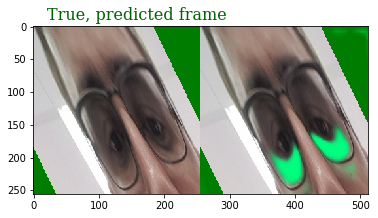

1.0
0.9958644


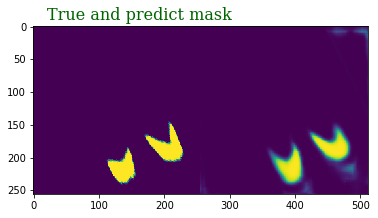

[[[746.1005  690.10046]
  [438.34302 408.14636]]]
(438, 746)
(408, 690)
[[[ 6.8848026e-01  1.6424048e-01  5.8095215e+02]
  [-1.2835599e+00  2.6232686e+00  2.3666364e+02]]]
npts
[[[622.9977   580.95215  757.2031  ]
  [908.2204   236.66364  -91.927704]]]
(908, 236, 0, 672)
(622, 580, 757, 799)


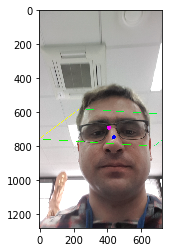

256/256 [==============================] - 58s 228ms/step - loss: 0.1232 - loss_median_loss: 0.0557 - loss_std_loss: 0.0362 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0313 - acc_loss: 0.0000e+00 - alpha_loss: 9.9569e-06 - val_loss: 0.3099 - val_loss_median_loss: 0.0551 - val_loss_std_loss: 0.0506 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2040 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 2.0190e-04
Epoch 294/300
[[502.86926 389.05377]]
probality_gamma: [0.36995402]
noise: [0.4431677]
gamma: [0.89517146]
probaligamma_procentty_gamma: [0.4471088]


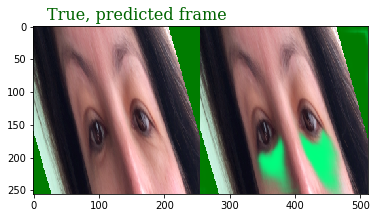

1.0
0.997329


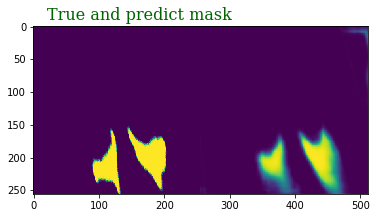

[[[556.11383 502.86926]
  [397.21286 389.05377]]]
(397, 556)
(389, 502)
[[[ 6.2143350e-01  2.4229036e-01  3.9231256e+02]
  [-8.1481993e-01  2.8448911e+00  1.2920465e+02]]]
npts
[[[454.3389  392.31256 551.39954]
  [857.49677 129.20465 -79.38925]]]
(857, 129, 0, 728)
(454, 392, 551, 613)


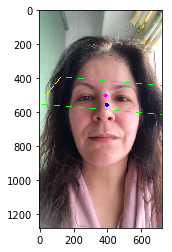

256/256 [==============================] - 58s 227ms/step - loss: 0.1296 - loss_median_loss: 0.0617 - loss_std_loss: 0.0368 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0312 - acc_loss: 0.0000e+00 - alpha_loss: 6.4253e-06 - val_loss: 0.3260 - val_loss_median_loss: 0.0309 - val_loss_std_loss: 0.0482 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2466 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.9398e-04
Epoch 295/300
[[306.77014 569.2952 ]]
probality_gamma: [0.67126685]
noise: [0.42858428]
gamma: [1.270509]
probaligamma_procentty_gamma: [0.43192685]


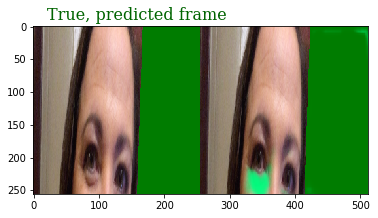

1.0
0.9658685


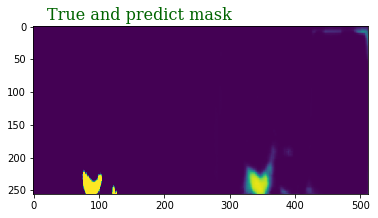

[[[438.77167 306.77014]
  [514.6292  569.2952 ]]]
(514, 438)
(569, 306)
[[[ 9.6105427e-01 -2.0173430e-01  2.0957716e+02]
  [ 1.4295173e-01  4.2175169e+00  1.1155224e+01]]]
npts
[[[ 157.93318   209.57716   455.60706 ]
  [1090.8396     11.155224   47.750866]]]
(1090, 11, 47, 1126)
(157, 209, 455, 403)


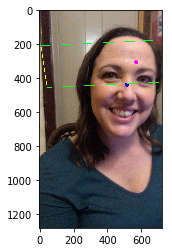

256/256 [==============================] - 60s 235ms/step - loss: 0.1234 - loss_median_loss: 0.0566 - loss_std_loss: 0.0368 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0300 - acc_loss: 0.0000e+00 - alpha_loss: 5.7140e-06 - val_loss: 0.3378 - val_loss_median_loss: 0.0363 - val_loss_std_loss: 0.0514 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.2499 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.6028e-04
Epoch 296/300
[[801.2805  353.18042]]
probality_gamma: [0.32597518]
noise: [0.42479962]
gamma: [0.73416007]
probaligamma_procentty_gamma: [0.55096376]


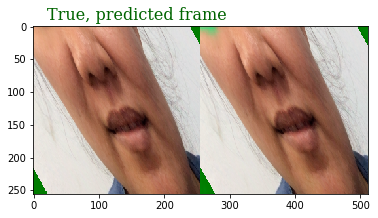

1.0
0.6591277


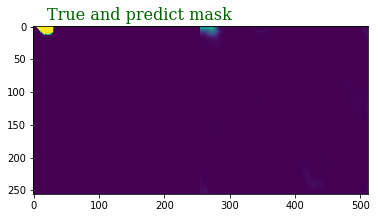

[[[676.8799  801.2805 ]
  [357.36725 353.18042]]]
(357, 676)
(353, 801)
[[[ 7.0802414e-01  2.7167207e-01  6.7587946e+02]
  [-1.1097746e+00  1.9973220e+00  2.3957437e+02]]]
npts
[[[745.4275   675.87946  857.13367 ]
  [750.8888   239.57437  -44.527924]]]
(750, 239, 0, 511)
(745, 675, 857, 927)


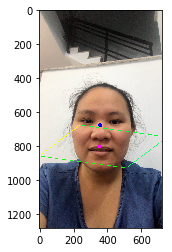

256/256 [==============================] - 58s 226ms/step - loss: 0.1197 - loss_median_loss: 0.0557 - loss_std_loss: 0.0372 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0267 - acc_loss: 0.0000e+00 - alpha_loss: 1.0128e-05 - val_loss: 0.2680 - val_loss_median_loss: 0.0480 - val_loss_std_loss: 0.0626 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1572 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 1.9366e-04
Epoch 297/300
[[191.64603 367.73923]]
probality_gamma: [0.6119118]
noise: [0.42780876]
gamma: [0.54503226]
probaligamma_procentty_gamma: [0.43482858]


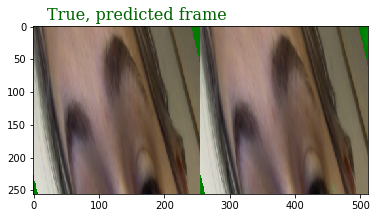

0.0
0.11498221


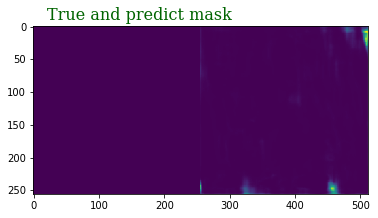

[[[312.8985  191.64603]
  [299.31894 367.73923]]]
(299, 312)
(367, 191)
[[[  0.34308267   0.5892136   72.312096  ]
  [ -0.5769793    2.4316356  130.3432    ]]]
npts
[[[223.15079   72.312096 160.14127 ]
  [752.8419   130.3432   -17.363495]]]
(752, 130, 0, 622)
(223, 72, 160, 311)


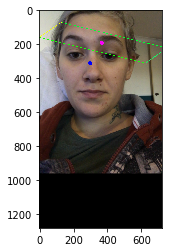

256/256 [==============================] - 59s 230ms/step - loss: 0.1248 - loss_median_loss: 0.0603 - loss_std_loss: 0.0389 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0256 - acc_loss: 0.0000e+00 - alpha_loss: 9.6802e-06 - val_loss: 0.2324 - val_loss_median_loss: 0.0568 - val_loss_std_loss: 0.0630 - val_loss_square_loss: 0.0000e+00 - val_cce_loss_loss: 0.1124 - val_acc_loss: 0.0000e+00 - val_alpha_loss: 2.1780e-04
Epoch 298/300
[[571.2798  350.91354]]
probality_gamma: [0.3102391]
noise: [0.40717918]
gamma: [0.55728275]
probaligamma_procentty_gamma: [0.3681844]


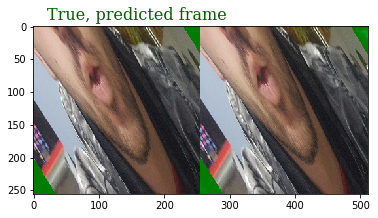

0.0
0.3063594


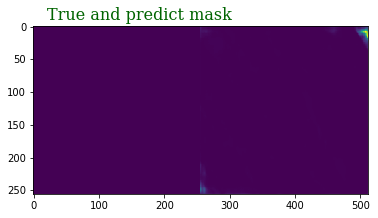

[[[414.72366 571.2798 ]
  [336.7524  350.91354]]]
(336, 414)
(350, 571)
[[[ 4.5370615e-01  4.5137239e-01  4.5542975e+02]
  [-1.2528855e+00  2.0368109e+00  2.5057106e+02]]]
npts
[[[570.9811  455.42975 571.5785 ]
  [771.9946  250.57106 -70.16762]]]
(771, 250, 0, 521)
(570, 455, 571, 686)


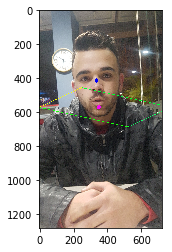

 57/256 [=====>........................] - ETA: 1:24 - loss: 0.1103 - loss_median_loss: 0.0543 - loss_std_loss: 0.0352 - loss_square_loss: 0.0000e+00 - cce_loss_loss: 0.0208 - acc_loss: 0.0000e+00 - alpha_loss: 8.2056e-06

KeyboardInterrupt: 

In [255]:
fixed_result = model.fit_generator(data_generator_single,validation_data = ([x_val, y_val], [mmm,mmm,mmm,mmm,mmm,mmm]), epochs=300, steps_per_epoch = 256, callbacks = [callbackshow])


In [ ]:

tf.__version__

In [ ]:
!pip freeze

In [ ]:
model.save('stn_bags_segment_720_1280_(3,2)_(4,2)_2019.09.30.hdf5')

In [ ]:
def jaccard_distance(y_true, y_pred, smooth=1.):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

In [ ]:
def max_mean(y_true, y_pred):    
    return 1. - K.mean(y_pred)

In [ ]:
def afine_stn_loss(y_true_in, y_pred_in):
    smooth = 1.
    
    y_true1 = y_pred_in[...,0:1]
    y_pred1 = y_pred_in[...,1:2]
    
    y_true = tf.concat([1. - y_true1, y_true1], -1)
    y_pred = tf.concat([1. - y_pred1, y_pred1], -1)
    
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    jac = (1 - jac) * smooth
    
    return jac + K.binary_crossentropy(y_true1[...,0], y_pred1[...,0])

In [ ]:
def mean_loss(y_true_in, y_pred_in):
    y_true = y_pred_in[...,0:1]/tf.cast([[720],[1280]], 'float32')
    y_pred = y_pred_in[...,1:2]/tf.cast([[720],[1280]], 'float32')
    return K.mean(K.abs(y_true - y_pred), axis=-1)


In [ ]:


def mean_loss_std(y_true_in, y_pred_in):
    y_true = y_pred_in[...,0:1]
    y_pred = y_pred_in[...,1:2]
    return K.mean(K.abs(1./(K.epsilon() + y_true) - 1./(K.epsilon() + y_pred)))

In [ ]:
def stn_square_find(y_true_in,y_pred_in):
    batch = K.shape(y_pred_in)[0]
    fix = tf.cast([[[1,1, 720], [1,1, 1280]]], 'float32')
    m = K.reshape(y_pred_in,shape=(batch, 2, 3))*fix
 
    pts1 = tf.cast([[[256], [0],[1]]],'float32')
    new_pts1 = K.dot(m,pts1)
    new_pts1=K.reshape(new_pts1, (batch,2))
    
    pts4 =tf.cast([[[0], [256],[1]]],'float32')
    new_pts4 = K.dot(m,pts4)
    new_pts4=K.reshape(new_pts4, (batch,2))
    
    pts2 = tf.cast([[[0], [0],[1]]],'float32')
    new_pts2 = K.dot(m,pts2)
    new_pts2=K.reshape(new_pts2, (batch,2))
    
    pts3 = tf.cast([[[256], [256],[1]]],'float32')
    new_pts3 = K.dot(m,pts3)
    new_pts3=K.reshape(new_pts3, (batch,2))

    new_pts41 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts4,new_pts1),dtype='float32')
    new_pts41 = K.sum(new_pts41,1)
    
    new_pts32 = tf.map_fn(lambda x: x**2, tf.subtract(new_pts3,new_pts2),dtype='float32')
    new_pts32 = K.sum(new_pts32,1)

    new_pts41 = tf.sqrt(K.epsilon() +new_pts41)
    new_pts32 = tf.sqrt(K.epsilon() +new_pts32)
    diff = tf.sqrt(K.epsilon() + tf.abs(tf.subtract(new_pts41**2,new_pts32**2)))
    summ = tf.sqrt(K.epsilon() + tf.add(new_pts41**2, new_pts32**2))
    
    return K.mean(K.epsilon() + diff/summ)

In [ ]:
from keras.optimizers import Adam

In [ ]:

# model.compile(loss=[afine_stn_loss,max_mean, 'binary_crossentropy', 'mae'], optimizer=Adam(lr=0.001), loss_weights = [1, 1,500., 0.])
model.compile(loss=[afine_stn_loss,stn_square_find,mean_loss,mean_loss_std], optimizer=Adam(lr=0.001), loss_weights = [0.1,0.,1.,0.])



batch_size = 16
num_epochs = 20

mmm = np.tile(np.array([[1.,0.,0.,0.,1.,0.]]), (batch_size, 1))

input_image = model.input[0]
input_mask = model.input[1]
x_segment_in = model.get_layer('loc_m1').output[0]
x_m = model.get_layer('loc_m1').output[1]
x_segment_predict = model.get_layer('segment').output
x_segment_true = model.get_layer('tf_afin').output[0]
#x_segment_original = model.get_layer('loc_m2').output[0]
x_segment_pl = model.get_layer('concatenate_6').output

STN_debug_function = K.function([input_image, input_mask], 
                                [x_segment_in, x_segment_predict, x_segment_true, x_m,x_segment_pl])

In [ ]:
z_train2 = z_train2.reshape((-1,6))

In [ ]:
batch_size = 1
sel = np.random.randint(0, x_train.shape[0], batch_size)
x_batch2, y_batch2 = x_train[sel],  y_train[sel]



In [ ]:
z_val2 = z_val2.reshape((-1,6))

In [ ]:
def data_generator_old(batch_size, x_batch, y_batch,y_batch2, mm):
    while True:
        sel = np.random.randint(0, x_batch.shape[0], batch_size)
        yield [x_batch[sel]/255., y_batch[sel]/255.], [y_batch[sel]/255.,mm[sel],mm[sel],mm[sel]]

In [ ]:
batch_size = 32
#mmm = np.tile(np.array([[1.,0.,0.,0.,1.,0.]]), (batch_size, 1))
data_generator_single = data_generator_old(batch_size, x_train, y_train, y_train2, z_train2)

mmm = np.tile(np.array([[1.,0.,0.,0.,1.,0.]]), (batch_size, 1))
#x_batch_val, y_batch_val = (x_val/255.).astype(np.float16),  (y_val/255.).astype(np.float16)

In [ ]:
loss_list = []

In [ ]:

for j in range(80):
    if j%2==0:
        clear_output()
    print(j)
    np_segment_in, np_segment_predict, np_segment_true, x_m,np_segment_pl = STN_debug_function([x_batch2/255., y_batch2/255.])
    
    print((int(np_segment_pl[0][0][1]), int(np_segment_pl[0][1][1])))
    print((int(np_segment_pl[0][0][0]), int(np_segment_pl[0][1][0])))
    print(np_segment_pl)
    print(x_m)
    for item in np_segment_in:
        plt.imshow(item[...])
        plt.show()

    for item in np_segment_predict:
        plt.imshow(item[...,0])
        plt.show()

    for item in np_segment_true:
        plt.imshow(item[...,0])
        plt.show()

    batch = K.shape(x_m)[0]
    fix = 1./tf.cast([[[1,1, 1280], [1,1, 720]]], 'float32')
    m = K.reshape(x_m,shape=(batch, 2, 3))*fix
        
    pts = tf.cast([[[256], [0],[1]],[[0], [0],[1]],[[0], [256],[1]]],'float32')
    npts=K.dot(m,pts)
    npts=K.reshape(npts, (batch,2,3))
    npts = K.eval(npts)
    
    for item in x_batch2:
        item1 = cv2.circle(item.copy(), (int(np_segment_pl[0][0][1]), int(np_segment_pl[0][1][1])), 12, (0, 0, 250), -1)
        item1 = cv2.circle(item1, (int(np_segment_pl[0][0][0]), int(np_segment_pl[0][1][0])), 12, (250, 0, 250), -1)
        
        cv2.line(item1, (int(npts[0][0][0]),int(npts[0][1][0])), (int(npts[0][0][1]),int(npts[0][1][1])), (0,255,250), 2)
        cv2.line(item1, (int(npts[0][0][1]),int(npts[0][1][1])), (int(npts[0][0][2]), int(npts[0][1][2])), (250,255,0), 2) 
        cv2.line(item1, (int(npts[0][0][2]), int(npts[0][1][2])), (abs(int(npts[0][0][0])-int(npts[0][0][1]))+ int(npts[0][0][2]) ,abs(int(npts[0][1][0])-int(npts[0][1][1]))+ int(npts[0][1][2])), (23,255,100), 2)
        cv2.line(item1, (abs(int(npts[0][0][0])-int(npts[0][0][1]))+ int(npts[0][0][2]) ,abs(int(npts[0][1][0])-int(npts[0][1][1]))+ int(npts[0][1][2])), (int(npts[0][0][0]),int(npts[0][1][0])), (20,250,100), 2)
        plt.imshow(item1)
        plt.show()
    
    plt.plot(loss_list)
    plt.show()
    fixed_result = model.fit_generator(data_generator_single, epochs=1, steps_per_epoch = 128)
    loss_list.extend(fixed_result.history['loss'])

    

In [ ]:
 x_batch2.shape

In [ ]:
def median_find(new_image):
    b,x_size, y_size, _ = K.shape(new_image)[0], K.shape(new_image)[1], K.shape(new_image)[2],K.shape(new_image)[3]
    tmp_x = K.tile(K.expand_dims(tf.range(0., x_size), 0), [b, 1])
    tmp_y = K.tile(K.expand_dims(tf.range(0., y_size), 0), [b, 1])
    
    sum_value_y = (K.sum(K.sum(new_image, axis=[1, -1]),axis=-1))
    sum_value_x = (K.sum(K.sum(new_image, axis=[2, -1]),axis=-1))

    x_med = (K.sum(tmp_y*K.sum(new_image, axis=[1, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_y)    
    y_med = (K.sum(tmp_x*K.sum(new_image, axis=[2, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_x)
    

    xy_mean = K.concatenate([K.expand_dims(x_med, -1), K.expand_dims(y_med, -1)], -1)
    
    return xy_mean

def std_find(new_image):
    mean_xy = median_find(new_image)
    y_m = K.cast(mean_xy[:, 1:2], dtype='float32')
    x_m = K.cast(mean_xy[:, 0:1], dtype='float32')
                          
    b,y_size, x_size, _ = K.shape(new_image)[0], K.shape(new_image)[1], K.shape(new_image)[2],K.shape(new_image)[3]
    #print(K.eval(y_size))
    tmp_x = (K.tile(K.expand_dims(tf.range(0., x_size), 0), [b, 1]) - x_m)**2
    tmp_y = (K.tile(K.expand_dims(tf.range(0., y_size), 0), [b, 1]) - y_m)**2
    
    sum_value_y = (K.sum(K.sum(new_image, axis=[2, -1]),axis=-1))
    sum_value_x = (K.sum(K.sum(new_image, axis=[1, -1]),axis=-1))


    x_med = (K.sum(tmp_y*K.sum(new_image, axis=[2, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_y)    
    y_med = (K.sum(tmp_x*K.sum(new_image, axis=[1, -1]), axis=-1, keepdims=False))/(K.epsilon() + sum_value_x)
    

    xy_mean = K.concatenate([K.expand_dims(x_med, -1), K.expand_dims(y_med, -1)], -1)
    
    return 5.*K.sqrt(K.epsilon() + xy_mean)

In [ ]:
x=median_find(tf.cast(y_batch_val,'float32'))
print(K.eval(x)[0])
print("std")
y=std_find(tf.cast(y_batch_val,'float32'))
print(K.eval(y)[0])

In [ ]:
plt.imshow(y_batch_val[0,...,0].astype(np.float))

In [ ]:
K.eval(tf.cast([[[422.32904, 348.07562],
  [693.1679,  654.64716]]],'float32')/tf.cast([[720],[1280]], 'float32'))

In [ ]:
x_val[0:2].shape

In [ ]:
def invert_mask(predicted):
    pred_mask = predicted[0][..., 1:2]
    plt.imshow(pred_mask[0,...,0])
    plt.show()
    
    matrix = K.reshape(predicted[1], shape=(K.shape(predicted[1])[0], 2, 3))
    M = K.concatenate([matrix,
                           K.tile(tf.cast([[[0, 0, 1]]], 'float32'), [K.shape(predicted[1])[0], 1, 1])], 1)
    M = tf.linalg.inv(M)
    matrix_tf = tf.contrib.image.matrices_to_flat_transforms(M)
    print(pred_mask.shape)
    print(matrix_tf.shape)
    mask_tf = tf.contrib.image.transform(pred_mask, matrix_tf, interpolation="BILINEAR",
                                             )
    print(mask_tf.shape)
    mask = K.eval(mask_tf[..., 0])
    return mask

y_in = np.full((2,) + (720, 1280, 1), (0.5))
pred = model.predict([x_val[0:2].copy()/255.,y_in])
mask1 = invert_mask(pred)
plt.imshow(mask1[0])
plt.show()
plt.imshow(x_val[0])

In [ ]:
(x_val[0:2].copy()/255.).shape

In [ ]:
y_in.shape

In [ ]:
y_in = np.full((2,) + (720, 1280, 1), (0.5))
pred = model.predict([x_val[0:2].copy()/255.,y_in])[0]
mask = pred[1]


image = np.squeeze(mask[...,1])
print(image.shape)
plt.imshow(image, cmap='gray')
plt.show()
plt.imshow(x_val[1])     

In [ ]:
model.save('stn_segment_02.hdf5')

In [ ]:
x1,y=next(data_generator_single)

In [ ]:
from keras.losses import binary_crossentropy

In [ ]:
K.eval(binary_crossentropy(K.constant(0*y_batch2/255.), K.constant(y_batch2/255.))).mean()

In [ ]:
(x_val.astype(np.float32)/255.).dtype

In [ ]:
val_score = model.evaluate([x_val.astype(np.float32)/255., 
                            y_val.astype(np.float32)/255.], [np.full((369, 128,128, 1),0., dtype=np.float32), z_val2], 
                           verbose=1, batch_size=1)

In [ ]:
z_val2.dtype

In [ ]:
STN_code_functionm([x_batch2[:9]])

In [ ]:
y_val.shape

In [ ]:
z_val2.shape

In [ ]:
def data_generator_old(batch_size, x_batch, y_batch, y_batch1,mm):
    min_gamma = 0.65
    max_gamma = 1.75
    while True:
        sel = np.random.randint(0, x_batch.shape[0], batch_size)

        yield [x_batch[sel], y_batch[sel]], [y_batch1[sel],mm[sel]]

In [ ]:
batch_size = 32
#mmm = np.tile(np.array([[1.,0.,0.,0.,1.,0.]]), (batch_size, 1))
data_generator_single = data_generator_old(batch_size, x_train, y_train, y_train,z_train2)


In [ ]:

fixed_result = model.fit_generator(data_generator_single, validation_data=([x_val,y_val], [y_val, z_val2]), 
                                            epochs=15, steps_per_epoch = 256)



In [ ]:
def local(input_shape=( 720,1280, 3),
              input_shape2=(720,1280, 1),
              sampling_size=(256, 256)):
    image0 = Input(shape=input_shape)
    image_true0 = Input(shape=input_shape2) #mask
    locnet = image0


    locnet = Conv2D(4, (3, 3))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(4, 3))(locnet)
    
    locnet = Conv2D(8, (3, 3))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(4, 3))(locnet)    
    
    c_layer_000 = locnet
    
    locnet = Conv2D(16, (5, 5))(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)
    c_layer_001 = locnet

    locnet = Conv2D(32, (5, 5))(locnet)    
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)
    c_layer_002 = locnet
    
    locnet = Conv2D(64, (5, 5))(locnet)    
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = MaxPool2D(pool_size=(2, 2))(locnet)
    c_layer_003 = locnet
    
    locnet = Flatten()(locnet)
    locnet = Dropout(0.1)(locnet)
    locnet = Dense(256)(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)
    locnet = Dropout(0.1)(locnet)
    locnet = Dense(128)(locnet)
    locnet = BatchNormalization()(locnet)
    locnet = Activation('relu')(locnet)    
 
    locnet = Dense(64)(locnet)
    weights = get_initial_weights(64)
    
    locnet = Dense(6, weights=weights, name='matr')(locnet)
    
    image, image_true, _ = Augment(invert=False,probability_gamma=1., name='augment')([image0, image_true0])
    
    x, m_c, mean_grid, std_grid  = STN(sampling_size, invert=False, name='loc_m1')([image, locnet])
    
    c_layer = Conv2D(8, (3, 3), padding='same')(x)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(8, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = MaxPooling2D((2, 2))(c_layer)
    c_layer_000 = c_layer

    c_layer = Conv2D(16, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(16, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = MaxPooling2D((2, 2))(c_layer)
    c_layer_001 = c_layer

    c_layer = Conv2D(24, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(24, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(24, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = MaxPooling2D((2, 2))(c_layer)
    c_layer_002 = c_layer

    c_layer = Conv2D(36, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(36, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)    
    c_layer = Conv2D(36, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = MaxPooling2D((2, 2))(c_layer)
    c_layer_003 = c_layer

    c_layer = Conv2D(64, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(64, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer = Conv2D(64, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    c_layer_004 = c_layer
    
    c_layer_004 = Conv2D(16, (3, 3), padding='same')(c_layer_004)
    c_layer_004 = BatchNormalization()(c_layer_004)
    c_layer_004 = Activation('relu')(c_layer_004)

    c_layer_003 = Conv2D(16, (3, 3), padding='same')(c_layer_003)
    c_layer_003 = BatchNormalization()(c_layer_003)
    c_layer_003 = Activation('relu')(c_layer_003)
    c_layer = Concatenate()([c_layer, c_layer_003, c_layer_004])

    c_layer = UpSampling2D((2, 2))(c_layer)
    c_layer = Conv2D(16, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)

    c_layer_002 = Conv2D(16, (3, 3), padding='same')(c_layer_002)
    c_layer_002 = BatchNormalization()(c_layer_002)
    c_layer_002 = Activation('relu')(c_layer_002)
    c_layer = Concatenate()([c_layer, c_layer_002])

    c_layer = UpSampling2D((2, 2))(c_layer)
    c_layer = Conv2D(16, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)

    c_layer_001 = Conv2D(16, (3, 3), padding='same')(c_layer_001)
    c_layer_001 = BatchNormalization()(c_layer_001)
    c_layer_001 = Activation('relu')(c_layer_001)
    c_layer = Concatenate()([c_layer, c_layer_001])

    c_layer = UpSampling2D((2, 2))(c_layer)
    c_layer = Conv2D(8, (3, 3), padding='same')(c_layer)
    c_layer = BatchNormalization()(c_layer)
    c_layer = Activation('relu')(c_layer)
    
    c_layer_000 = Conv2D(4, (3, 3), padding='same')(c_layer_000)
    c_layer_000 = BatchNormalization()(c_layer_000)
    c_layer_000 = Activation('relu')(c_layer_000)
    c_layer = Concatenate()([c_layer, c_layer_000])    

    c_layer = UpSampling2D((2, 2))(c_layer)
    c_layer = Conv2D(1, (3, 3), padding='same')(c_layer)
    c_layer = Activation('sigmoid', name='segment')(c_layer)
    
    true_stn_image, matr = Tf_afine(sampling_size, name='tf_afin')([image_true, locnet])
   
    c_layer = Concatenate(axis=-1)([true_stn_image, c_layer])
 
    true_mask_mask1 = image_true
    true_mask_mask = Lambda(lambda x : median_find(x))(true_mask_mask1)

    true_mask_mask = Lambda(lambda x : K.expand_dims(x, -1))(true_mask_mask)
    mean_grid = Lambda(lambda x : K.expand_dims(x, -1))(mean_grid)

    mean_diff_out = Concatenate(axis=-1)([true_mask_mask,mean_grid])
    
    true_std_mask = Lambda(lambda x : std_find(x))(true_mask_mask1)
    true_std_mask = Lambda(lambda x : K.expand_dims(x, -1))(true_std_mask)
    std_grid = Lambda(lambda x : K.expand_dims(x, -1))(std_grid)
    mean_diff_out_std = Concatenate(axis=-1)([true_std_mask,std_grid])

    return Model(inputs=[image0, image_true0], outputs=[c_layer,locnet, mean_diff_out, mean_diff_out_std])


